# Group 14 - Project FP01
## Time series anomaly detection - Isolation Forest Classifier

This project aims at investigating the current state-of-the-arts TAD scenario.

In [1]:
# %pip install --no-binary :all: -r requirements.txt

In [2]:
# %pip install numpy==1.26.4
# %pip install pandas==1.5.3
# %pip install tensorflow
# %pip install tsfel
# %pip install keras_tuner
# %pip install -U kaleido
# %pip install seaborn
# %pip install plotly
# %pip install openpyxl

In [3]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest

from src.dataset import get_df_action, get_features_ts, get_train_test_data, label_collision_data
from src.plots import seaborn_cm, create_and_plot_cm, plot_uncertainty, plot_signals, plot_anomalies, plot_anomalies_over_time, plot_anomalies_over_time_isolation_forest, plot_roc_curve
from src.metrics import Confidence, anomaly_detection_metric, compute_metrics

# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# Set style for matplotlib
plt.style.use("Solarize_Light2")

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
# Path to the root directory of the dataset
ROOTDIR_DATASET_NORMAL =  './dataset/normal' #'/content/drive/MyDrive/dataset/normal'
ROOTDIR_DATASET_ANOMALY = './dataset/collisions'#'/content/drive/MyDrive/dataset/collisions'

# TF_ENABLE_ONEDNN_OPTS=0 means that the model will not use the oneDNN library for optimization

import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

### Dataset: Kuka-v1
In 5 different recording sessions, the robot executes several different operations, while being
monitored by several sensors. The sensed signals are collected, with different sampling frequencies
(1, 10, 100, 200 Hz),

### Data Loading

In [6]:
#freq = '1.0'
# freq = '0.1'
#freq = '0.01'
freq = '0.005'

# NORMAL DATA
filepath_csv = [os.path.join(ROOTDIR_DATASET_NORMAL, f"rec{r}_20220811_rbtc_{freq}s.csv") for r in [0, 2, 3, 4]]
filepath_meta = [os.path.join(ROOTDIR_DATASET_NORMAL, f"rec{r}_20220811_rbtc_{freq}s.metadata") for r in [0, 2, 3, 4]]
df_action, df, df_meta, action2int = get_df_action(filepath_csv, filepath_meta)


# COLLISION DATA
xls = pd.ExcelFile(os.path.join(ROOTDIR_DATASET_ANOMALY, "20220811_collisions_timestamp_adjusted.xlsx"))
collision_rec1 = pd.read_excel(xls, 'rec1')
collision_rec5 = pd.read_excel(xls, 'rec5')


collisions = pd.concat([collision_rec1, collision_rec5]).dropna()
collisions_init = collisions[collisions['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions[collisions['Inizio/fine'] == "i"].Timestamp), 'h')
collisions_adjusted = collisions.Timestamp - pd.to_timedelta([2] * len(collisions.Timestamp), 'h')
collisions['Timestamp'] = collisions_adjusted


collisions_1 = collision_rec1.dropna()
collisions_init_1 = collisions_1[collisions_1['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions_1[collisions_1['Inizio/fine'] == "i"].Timestamp), 'h')
collisions_adjusted_1 = collisions_1.Timestamp - pd.to_timedelta([2] * len(collisions_1.Timestamp), 'h')
collisions_1['Timestamp'] = collisions_adjusted_1


collisions_5 = collision_rec5.dropna()
collisions_init_5 = collisions_5[collisions_5['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions_5[collisions_5['Inizio/fine'] == "i"].Timestamp), 'h')
collisions_adjusted_5 = collisions_5.Timestamp - pd.to_timedelta([2] * len(collisions_5.Timestamp), 'h')
collisions_5['Timestamp'] = collisions_adjusted_5



filepath_csv = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [1, 5]]
filepath_meta = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [1, 5]]
#df_collision è il dataset a meno di alcune colonne
df_action_collision, df_collision, df_meta_collision, action2int_collision = get_df_action(filepath_csv, filepath_meta)


filepath_csv_1 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [1]]
filepath_meta_1 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [1]]
#df_collision è il dataset a meno di alcune colonne
df_action_collision_1, df_collision_1, df_meta_collision_1, action2int_collision_1 = get_df_action(filepath_csv_1, filepath_meta_1)


filepath_csv_5 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [5]]
filepath_meta_5 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [5]]
#df_collision è il dataset a meno di alcune colonne
df_action_collision_5, df_collision_5, df_meta_collision_5, action2int_collision_5 = get_df_action(filepath_csv_5, filepath_meta_5)

Loading data.
Found 31 different actions.
Loading data done.



C:\Users\gabry\AppData\Local\Temp\ipykernel_7816\790474957.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  collisions_1['Timestamp'] = collisions_adjusted_1
C:\Users\gabry\AppData\Local\Temp\ipykernel_7816\790474957.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  collisions_5['Timestamp'] = collisions_adjusted_5


Loading data.
Found 31 different actions.
Loading data done.

Loading data.
Found 31 different actions.
Loading data done.

Loading data.
Found 31 different actions.
Loading data done.



### Features Exctraction

In [7]:
start_time = time.time()
frequency = 1/float(freq)

df_features = get_features_ts("statistical", df_action, df_meta, frequency, action2int)

df_features_collision = get_features_ts("statistical", df_action_collision, df_meta_collision, frequency, action2int_collision)
df_features_collision_1 = get_features_ts("statistical", df_action_collision_1, df_meta_collision_1, frequency, action2int_collision_1)
df_features_collision_5 = get_features_ts("statistical", df_action_collision_5, df_meta_collision_5, frequency, action2int_collision_5)

print("--- %s seconds ---" % (time.time() - start_time))

Computing features.


Skipped feature extraction for pickFromPallet(1,2)=[true,1,0] 2022-08-11 14:37:37.436000 : 2022-08-11 14:37:37.421000.
Skipped feature extraction for placeToPallet(1,1)=[true,0] 2022-08-11 14:37:37.421000 : 2022-08-11 14:37:37.442000.
Skipped feature extraction for pickFromPallet(3,2)=[true,1,0] 2022-08-11 15:36:32.568000 : 2022-08-11 15:36:32.533000.
Skipped feature extraction for pickFromPallet(3,2)=[true,1,0] 2022-08-11 15:36:32.572000 : 2022-08-11 15:36:32.561000.
Skipped feature extraction for placeToPallet(1,3)=[true,0] 2022-08-11 15:36:32.533000 : 2022-08-11 15:36:32.572000.
Skipped feature extraction for placeToPallet(1,3)=[true,0] 2022-08-11 15:36:32.561000 : 2022-08-11 15:36:32.561000.
Computing features done.
Computing features.


Skipped feature extraction for moveOverPallet(1,3)=[true,0] 2022-08-11 16:55:15.149000 : 2022-08-11 16:55:15.146000.
Skipped feature extraction for moveOverPallet(3,1)=[true,0] 2022-08-11 16:55:15.146000 : 2022-08-11 16:55:15.150000.
Computing features done.
Computing features.


Computing features done.
Computing features.


Skipped feature extraction for moveOverPallet(1,3)=[true,0] 2022-08-11 16:55:15.149000 : 2022-08-11 16:55:15.146000.
Skipped feature extraction for moveOverPallet(3,1)=[true,0] 2022-08-11 16:55:15.146000 : 2022-08-11 16:55:15.150000.
Computing features done.
--- 218.4924578666687 seconds ---


In [8]:
X_train, y_train, X_test, y_test, X_test_start_end = get_train_test_data(df_features, df_features_collision)
X_train_1, y_train_1, X_test_1, y_test_1, X_test_start_end_1 = get_train_test_data(df_features, df_features_collision_1)
X_train_5, y_train_5, X_test_5, y_test_5, X_test_start_end_5 = get_train_test_data(df_features, df_features_collision_5)

X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (306, 2200)
y_test shape: (306,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (306, 96)
y_test shape: (306,)
X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (164, 2200)
y_test shape: (164,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (164, 96)
y_test shape: (164,)
X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (141, 2200)
y_test shape: (141,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (141, 96)
y_test shape: (141,)


In [9]:
collisions_init

0     2022-08-11 14:02:17.450
2     2022-08-11 14:02:28.320
4     2022-08-11 14:02:45.770
6     2022-08-11 14:02:57.490
8     2022-08-11 14:03:56.960
                ...          
102   2022-08-11 17:01:56.990
104   2022-08-11 17:02:11.180
106   2022-08-11 17:02:58.080
108   2022-08-11 17:03:44.090
110   2022-08-11 17:04:10.600
Length: 93, dtype: datetime64[ns]

In [10]:
df_with_labels = label_collision_data(df_features_collision, collisions_init)
y_test_collision = df_with_labels["is_collision"]

In [11]:
df_with_labels_1 = label_collision_data(df_features_collision_1, collisions_init_1)
y_test_collision_1 = df_with_labels_1["is_collision"]

In [12]:
df_with_labels_5 = label_collision_data(df_features_collision_5, collisions_init_5)
y_test_collision_5 = df_with_labels_5["is_collision"]

### Collision_zones



In [13]:
# ts_starts = collisions[collisions['Inizio/fine'] == 'i'].Timestamp.reset_index()
# ts_ends = collisions[collisions['Inizio/fine'] == 'f'].Timestamp.reset_index()

# d = {'start': ts_starts.Timestamp, 'end': ts_ends.Timestamp}
# collision_zones = pd.DataFrame(d)


## Isolation Forest

In [14]:
#Let's cheat a little bit, computing contamination dircetly on the test set --> By the way in the training set we do not have collisions -.-
cont = np.sum(y_test_collision)/float(len(y_test_collision))
print(f"dataset contamination = {cont}")

num_estims = [1, 2, 3, 5, 10, 100]
contamination_s = [cont, 0.005, 0.001, 0.001, 0.03, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
contamination_s += np.linspace(0.03, 0.1, 5).tolist()
clf_s = []
clf_s_1 = []
clf_s_5 = []

#Variare contamination è come variare threshold
for n in num_estims:
    for cont in contamination_s:
        classifier = IsolationForest(
            n_estimators = n,
            contamination = cont
        )
        # Train the RandomForestClassifier on normal data
        classifier.fit(X_train, y_train)
        clf_s.append((classifier, n, cont))

        classifier.fit(X_train_1, y_train_1)
        clf_s_1.append((classifier, n, cont))

        classifier.fit(X_train_5, y_train_5)
        clf_s_5.append((classifier, n, cont))

        print("Random Forest training completed.")


dataset contamination = 0.2973856209150327
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Rando

## Predicting Labels

In [15]:
print(f"Real number of collisions {np.sum(y_test_collision == 1)}")
print(f"Real number of collisions {np.sum(y_test_collision_1 == 1)}")
print(f"Real number of collisions {np.sum(y_test_collision_5 == 1)}")

Real number of collisions 91
Real number of collisions 35
Real number of collisions 56


In [16]:
#Facendo così otteniamo le stesse prediction del metodo con gli score, ma con gli score possiamo plottare grafici, quindi terrei quello

# pred_s = []
# # For each of the trained clasisfier make a prediction
# for clf in clf_s:
#     try:
#         anomalies_detected = clf.predict(X_test)
#         pred_s.append(anomalies_detected)
#     except Exception as e:
#         print(f"An error occurred during prediction: {str(e)}")
#         # If an error occurs, you might want to inspect the model's internal state

#     #Anomalies are set as -1
#     print(f"Number of anomalies detected: {-np.sum(anomalies_detected[anomalies_detected == -1])} with contamination {clf.get_params()['contamination']}")


## Decision function

In [17]:
anomaly_scores_s = []
for clf in clf_s:
    try:
        anomaly_scores = clf[0].decision_function(X_test)
        # Replace inf values with the maximum float value
        anomaly_scores_s.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
    print("Anomaly prediction completed.")

Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly pr

In [18]:
anomaly_scores_s_1 = []
for clf in clf_s_1:
    try:
        anomaly_scores = clf[0].decision_function(X_test_1)
        # Replace inf values with the maximum float value
        anomaly_scores_s_1.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
    print("Anomaly prediction completed.")

Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly pr

In [19]:
anomaly_scores_s_5 = []
for clf in clf_s_5:
    try:
        anomaly_scores = clf[0].decision_function(X_test_5)
        # Replace inf values with the maximum float value
        anomaly_scores_s_5.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
    print("Anomaly prediction completed.")

Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly pr

In [20]:
def plot_anomalies(anomaly_scores, freq, threshold, model_name="No_Model"):
    
    # Visualize the results
    plt.figure(figsize=(12, 6))

    scatter = plt.scatter(range(len(anomaly_scores)), anomaly_scores,
                        c=anomaly_scores, cmap='coolwarm',
                        norm=plt.Normalize(vmin=0, vmax=threshold*2))

    plt.colorbar(scatter, label='Anomaly Score')
    plt.axhline(y=threshold, color='g', linestyle='--', label='Threshold')
    plt.title(f'Anomaly Scores from {model_name} at frequency {freq}')
    plt.xlabel('Sample Index')
    plt.ylabel('Anomaly Score')
    plt.legend()
    plt.show()

    anomalies_detected = sum(anomaly_scores > threshold)
    print(f"Number of anomalies detected: {anomalies_detected}")
    
    return anomalies_detected

### Classifying collisions

IsolationForest(contamination=0.2973856209150327, n_estimators=1)
92


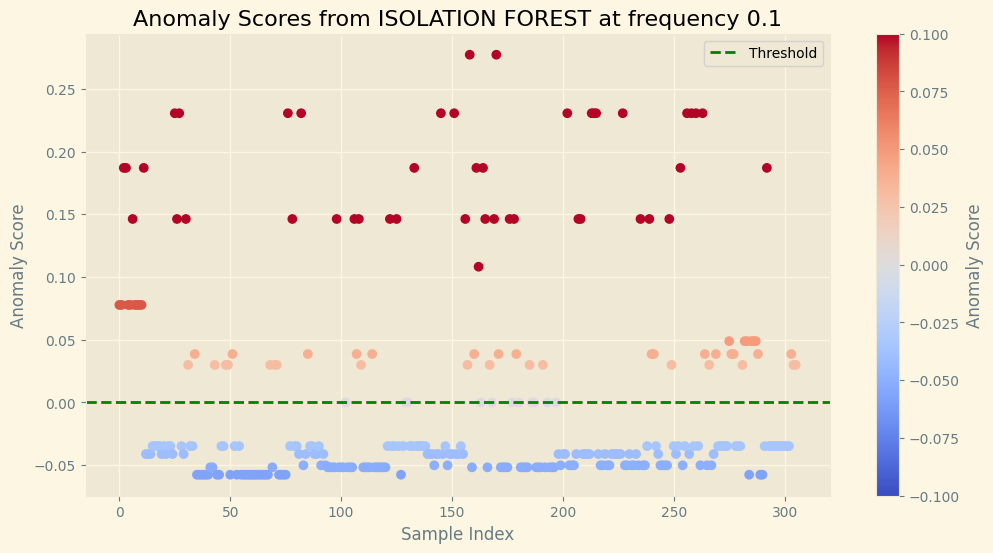

Number of anomalies detected: 92
Threshold: 0.0000
ROC AUC Score: 0.5912
F1 Score: 0.3607
Accuracy: 0.6176
Precision: 0.3587
Recall: 0.3626
              precision    recall  f1-score   support

           0       0.73      0.73      0.73       215
           1       0.36      0.36      0.36        91

    accuracy                           0.62       306
   macro avg       0.54      0.54      0.54       306
weighted avg       0.62      0.62      0.62       306



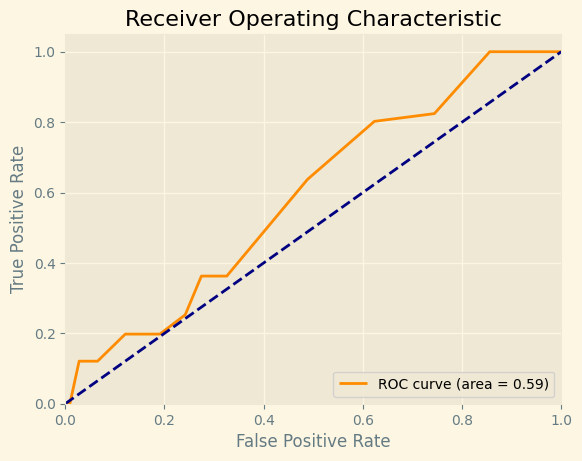

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
17
IsolationForest(contamination=0.05, n_estimators=1)
11
IsolationForest(contamination=0.1, n_estimators=1)
20
IsolationForest(contamination=0.2, n_estimators=1)
70
IsolationForest(contamination=0.3, n_estimators=1)
115


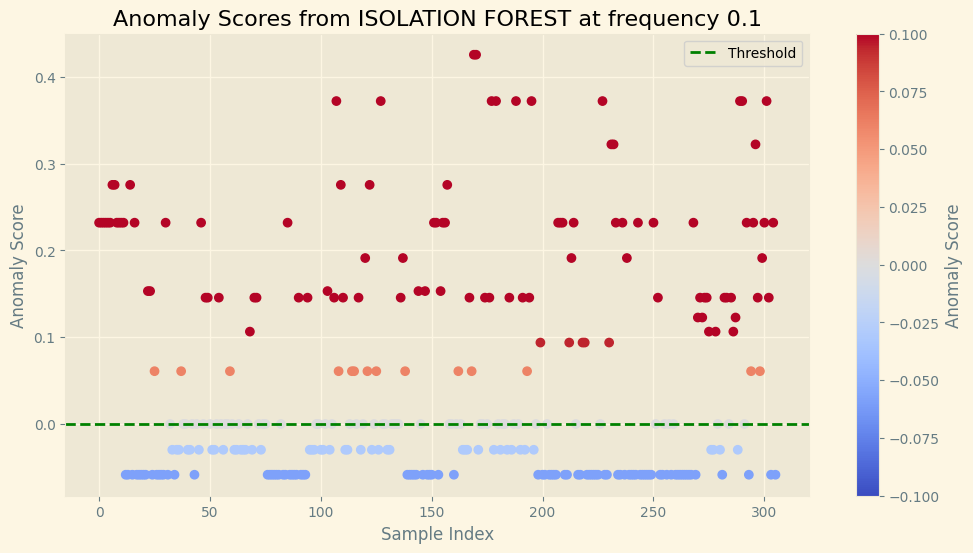

Number of anomalies detected: 115
Threshold: 0.0000
ROC AUC Score: 0.6545
F1 Score: 0.4854
Accuracy: 0.6536
Precision: 0.4348
Recall: 0.5495
              precision    recall  f1-score   support

           0       0.79      0.70      0.74       215
           1       0.43      0.55      0.49        91

    accuracy                           0.65       306
   macro avg       0.61      0.62      0.61       306
weighted avg       0.68      0.65      0.66       306



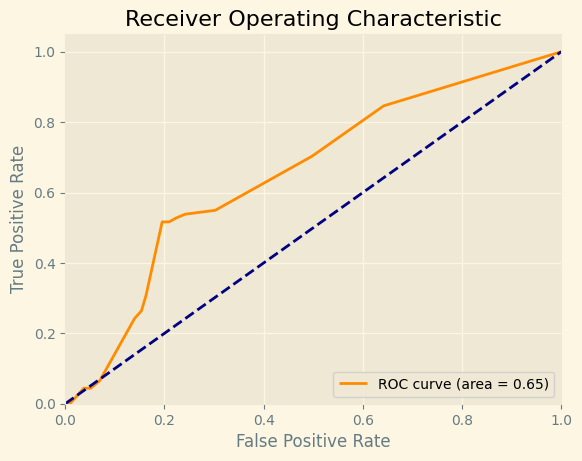

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=1)
95


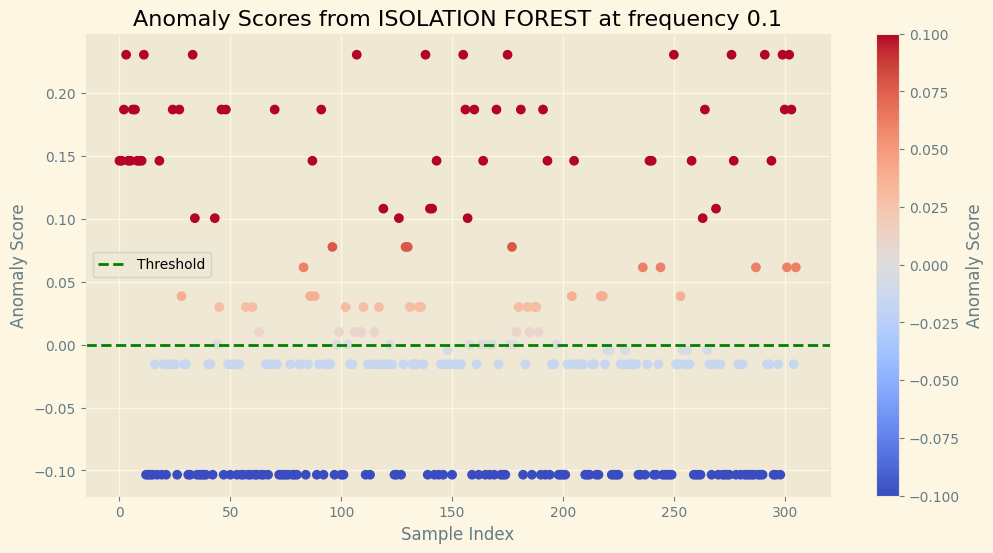

Number of anomalies detected: 95
Threshold: 0.0000
ROC AUC Score: 0.5536
F1 Score: 0.2796
Accuracy: 0.5621
Precision: 0.2737
Recall: 0.2857
              precision    recall  f1-score   support

           0       0.69      0.68      0.69       215
           1       0.27      0.29      0.28        91

    accuracy                           0.56       306
   macro avg       0.48      0.48      0.48       306
weighted avg       0.57      0.56      0.56       306



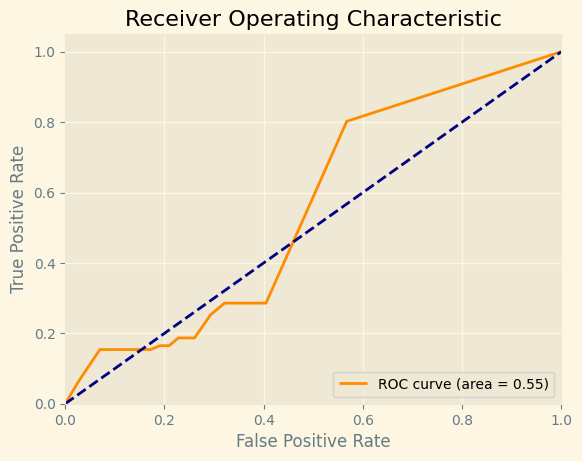

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=1)
106


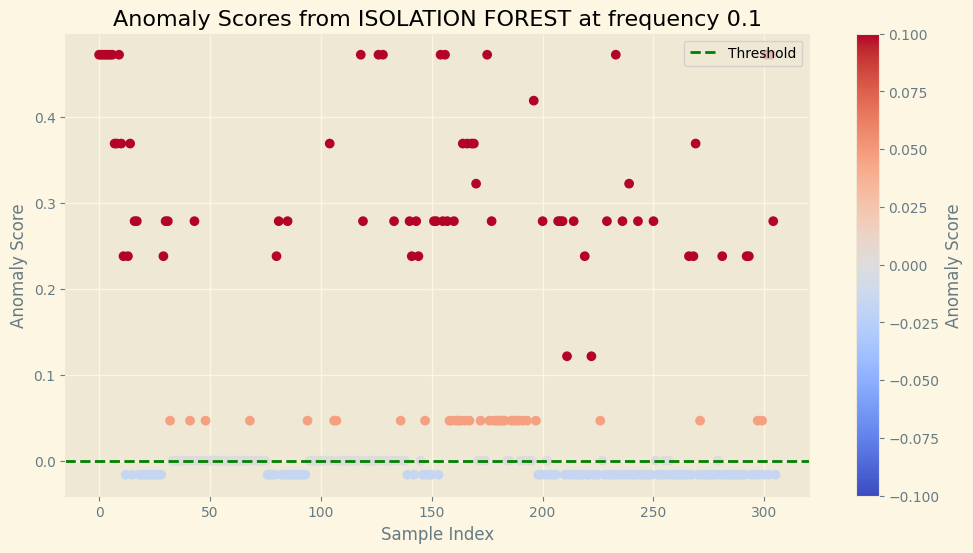

Number of anomalies detected: 106
Threshold: 0.0000
ROC AUC Score: 0.5951
F1 Score: 0.3858
Accuracy: 0.6046
Precision: 0.3585
Recall: 0.4176
              precision    recall  f1-score   support

           0       0.73      0.68      0.71       215
           1       0.36      0.42      0.39        91

    accuracy                           0.60       306
   macro avg       0.55      0.55      0.55       306
weighted avg       0.62      0.60      0.61       306



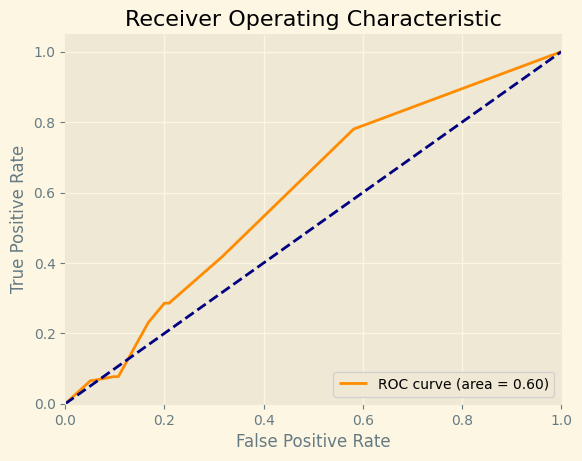

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.03, n_estimators=1)
1
IsolationForest(contamination=0.0475, n_estimators=1)
35
IsolationForest(contamination=0.065, n_estimators=1)
53
IsolationForest(contamination=0.0825, n_estimators=1)
24
IsolationForest(contamination=0.1, n_estimators=1)
117


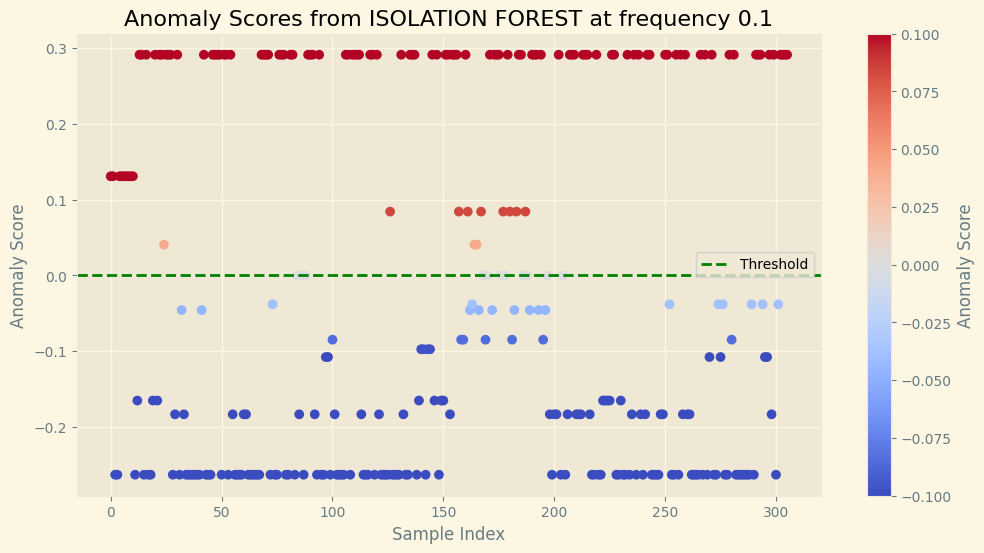

Number of anomalies detected: 117
Threshold: 0.0000
ROC AUC Score: 0.9399
F1 Score: 0.8077
Accuracy: 0.8693
Precision: 0.7179
Recall: 0.9231
              precision    recall  f1-score   support

           0       0.96      0.85      0.90       215
           1       0.72      0.92      0.81        91

    accuracy                           0.87       306
   macro avg       0.84      0.88      0.85       306
weighted avg       0.89      0.87      0.87       306



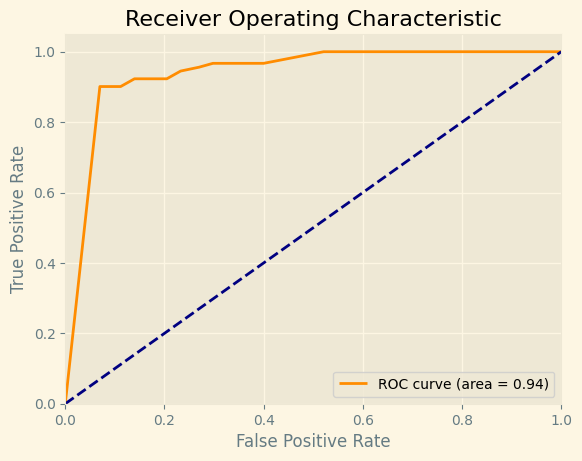

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=2)
128
IsolationForest(contamination=0.005, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
57
IsolationForest(contamination=0.05, n_estimators=2)
39
IsolationForest(contamination=0.1, n_estimators=2)
79
IsolationForest(contamination=0.2, n_estimators=2)
61
IsolationForest(contamination=0.3, n_estimators=2)
132
IsolationForest(contamination=0.4, n_estimators=2)
146
IsolationForest(contamination=0.5, n_estimators=2)
177
IsolationForest(contamination=0.03, n_estimators=2)
50
IsolationForest(contamination=0.0475, n_estimators=2)
19
IsolationForest(contamination=0.065, n_estimators=2)
74
IsolationForest(contamination=0.0825, n_estimators=2)
71
IsolationForest(contamination=0.1, n_estimators=2)
61
Isolatio

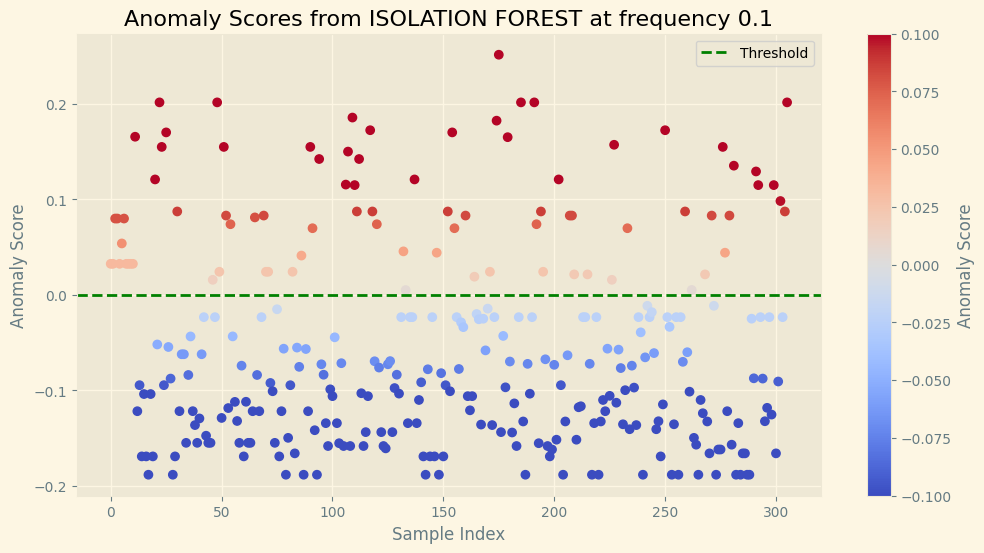

Number of anomalies detected: 82
Threshold: 0.0000
ROC AUC Score: 0.8307
F1 Score: 0.5896
Accuracy: 0.7680
Precision: 0.6220
Recall: 0.5604
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       215
           1       0.62      0.56      0.59        91

    accuracy                           0.77       306
   macro avg       0.72      0.71      0.71       306
weighted avg       0.76      0.77      0.76       306



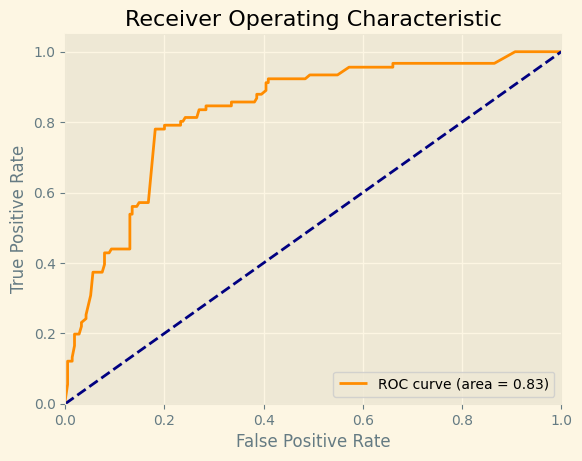

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
134
IsolationForest(contamination=0.3, n_estimators=3)
150
IsolationForest(contamination=0.4, n_estimators=3)
177
IsolationForest(contamination=0.5, n_estimators=3)
207
IsolationForest(contamination=0.03, n_estimators=3)
19
IsolationForest(contamination=0.0475, n_estimators=3)
14
IsolationForest(contamination=0.065, n_estimators=3)
88


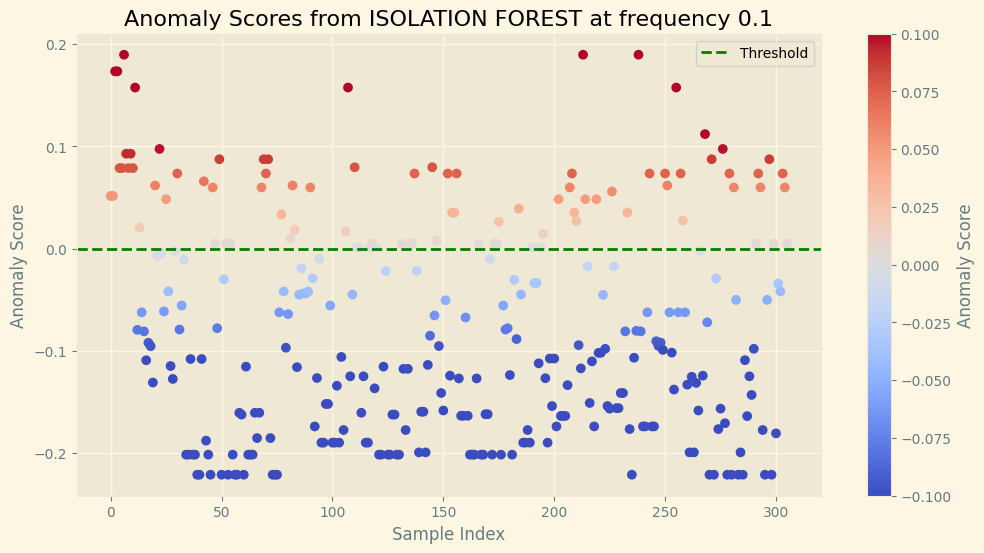

Number of anomalies detected: 88
Threshold: 0.0000
ROC AUC Score: 0.8629
F1 Score: 0.6480
Accuracy: 0.7941
Precision: 0.6591
Recall: 0.6374
              precision    recall  f1-score   support

           0       0.85      0.86      0.85       215
           1       0.66      0.64      0.65        91

    accuracy                           0.79       306
   macro avg       0.75      0.75      0.75       306
weighted avg       0.79      0.79      0.79       306



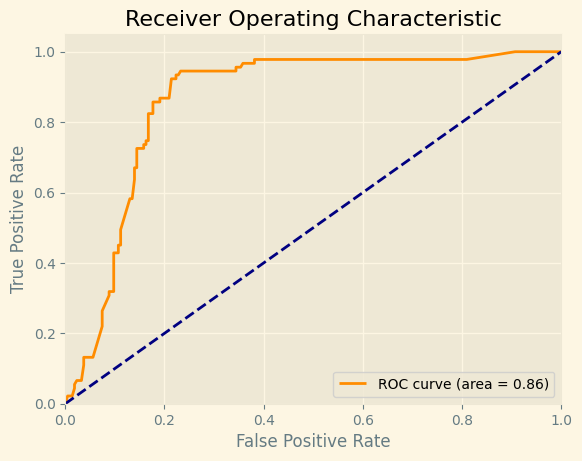

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=3)
72
IsolationForest(contamination=0.1, n_estimators=3)
116


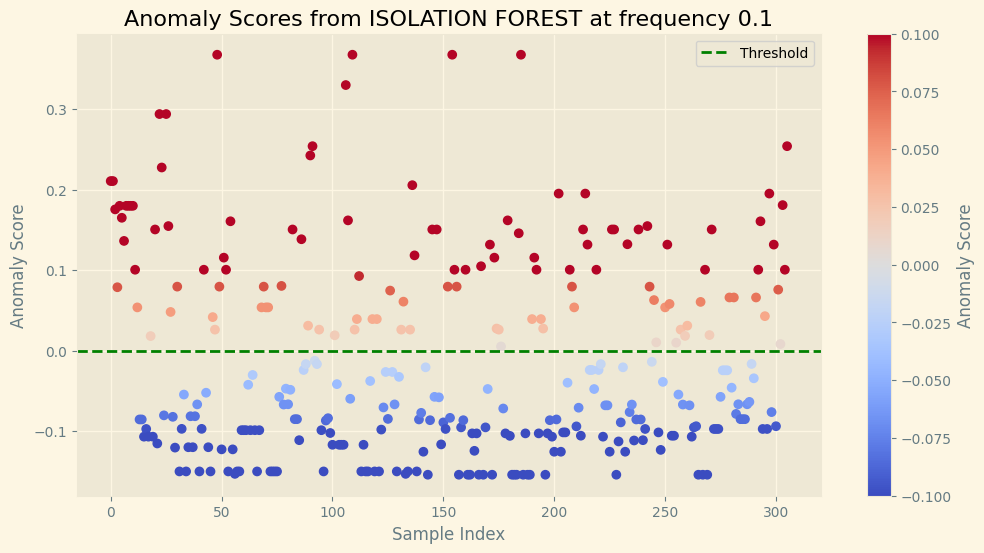

Number of anomalies detected: 116
Threshold: 0.0000
ROC AUC Score: 0.8595
F1 Score: 0.7633
Accuracy: 0.8399
Precision: 0.6810
Recall: 0.8681
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       215
           1       0.68      0.87      0.76        91

    accuracy                           0.84       306
   macro avg       0.81      0.85      0.82       306
weighted avg       0.86      0.84      0.84       306



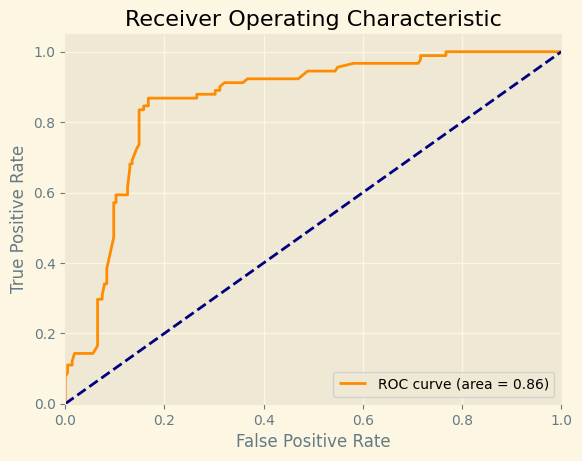

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=5)
164
IsolationForest(contamination=0.005, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.03, n_estimators=5)
13
IsolationForest(contamination=0.05, n_estimators=5)
38
IsolationForest(contamination=0.1, n_estimators=5)
44
IsolationForest(contamination=0.2, n_estimators=5)
150
IsolationForest(contamination=0.3, n_estimators=5)
117


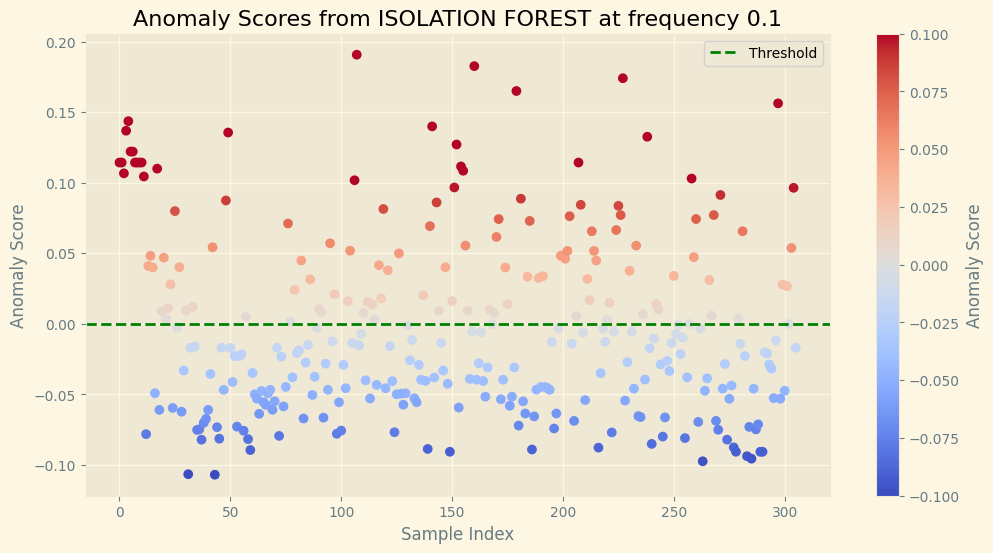

Number of anomalies detected: 117
Threshold: 0.0000
ROC AUC Score: 0.7318
F1 Score: 0.5385
Accuracy: 0.6863
Precision: 0.4786
Recall: 0.6154
              precision    recall  f1-score   support

           0       0.81      0.72      0.76       215
           1       0.48      0.62      0.54        91

    accuracy                           0.69       306
   macro avg       0.65      0.67      0.65       306
weighted avg       0.71      0.69      0.70       306



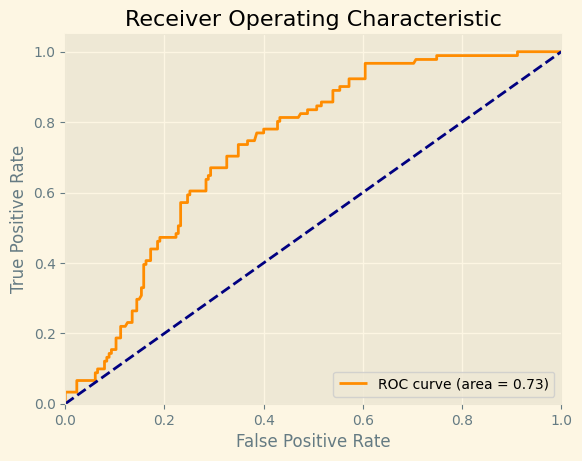

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=5)
168
IsolationForest(contamination=0.5, n_estimators=5)
191
IsolationForest(contamination=0.03, n_estimators=5)
22
IsolationForest(contamination=0.0475, n_estimators=5)
66
IsolationForest(contamination=0.065, n_estimators=5)
85


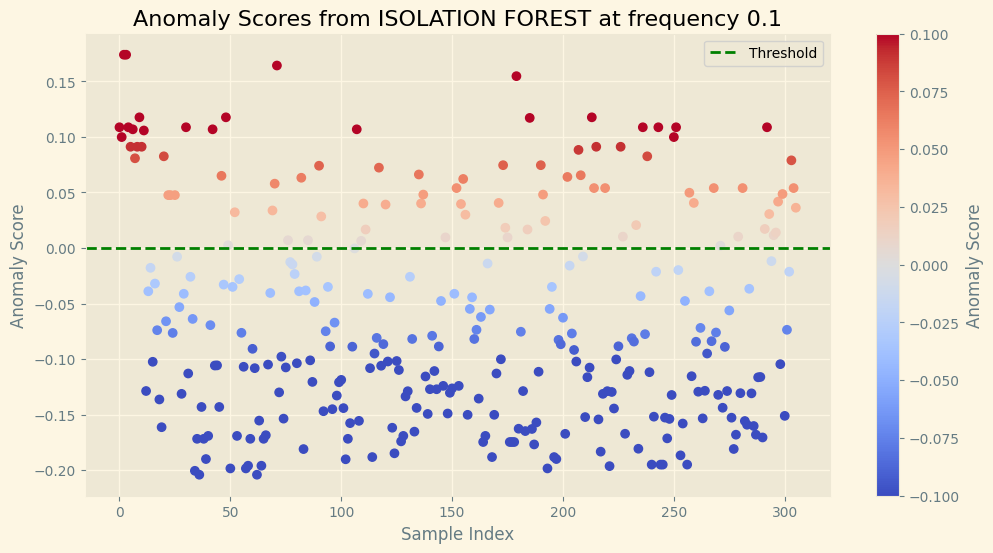

Number of anomalies detected: 85
Threshold: 0.0000
ROC AUC Score: 0.8890
F1 Score: 0.6591
Accuracy: 0.8039
Precision: 0.6824
Recall: 0.6374
              precision    recall  f1-score   support

           0       0.85      0.87      0.86       215
           1       0.68      0.64      0.66        91

    accuracy                           0.80       306
   macro avg       0.77      0.76      0.76       306
weighted avg       0.80      0.80      0.80       306



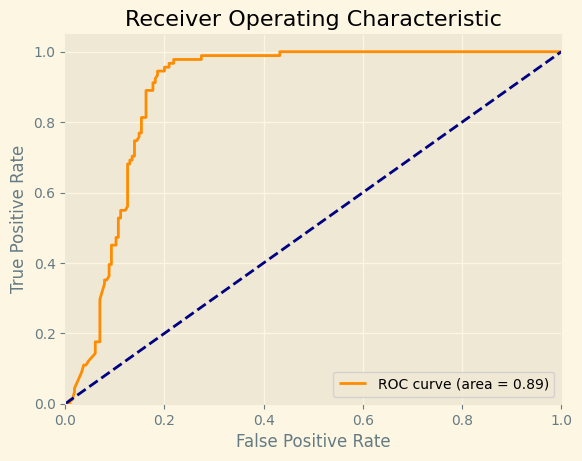

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=5)
85


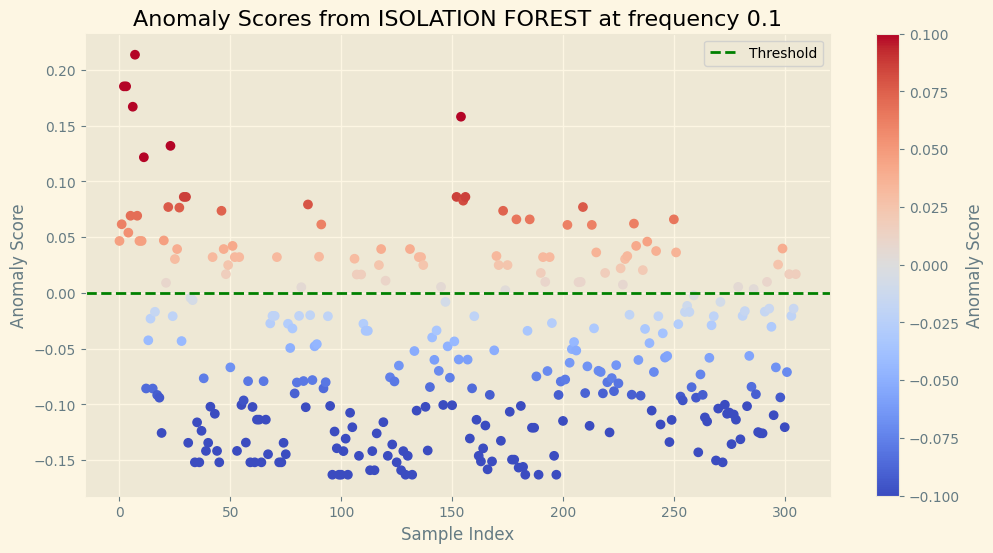

Number of anomalies detected: 85
Threshold: 0.0000
ROC AUC Score: 0.8787
F1 Score: 0.6591
Accuracy: 0.8039
Precision: 0.6824
Recall: 0.6374
              precision    recall  f1-score   support

           0       0.85      0.87      0.86       215
           1       0.68      0.64      0.66        91

    accuracy                           0.80       306
   macro avg       0.77      0.76      0.76       306
weighted avg       0.80      0.80      0.80       306



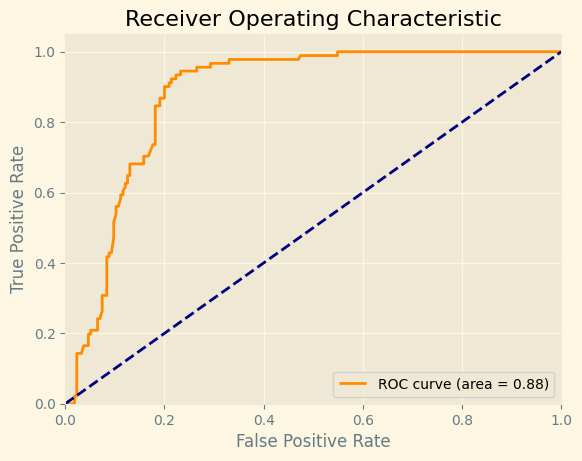

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=5)
89


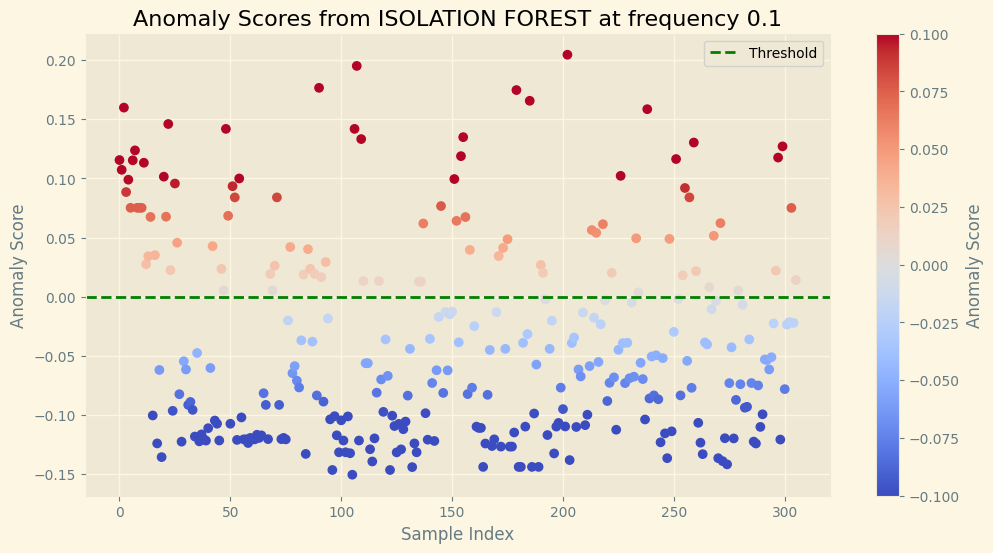

Number of anomalies detected: 89
Threshold: 0.0000
ROC AUC Score: 0.8422
F1 Score: 0.6111
Accuracy: 0.7712
Precision: 0.6180
Recall: 0.6044
              precision    recall  f1-score   support

           0       0.83      0.84      0.84       215
           1       0.62      0.60      0.61        91

    accuracy                           0.77       306
   macro avg       0.73      0.72      0.72       306
weighted avg       0.77      0.77      0.77       306



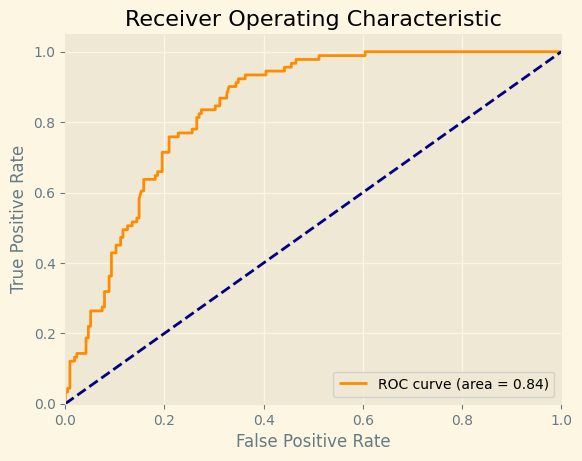

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=10)
165
IsolationForest(contamination=0.005, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
9
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
72
IsolationForest(contamination=0.05, n_estimators=10)
89


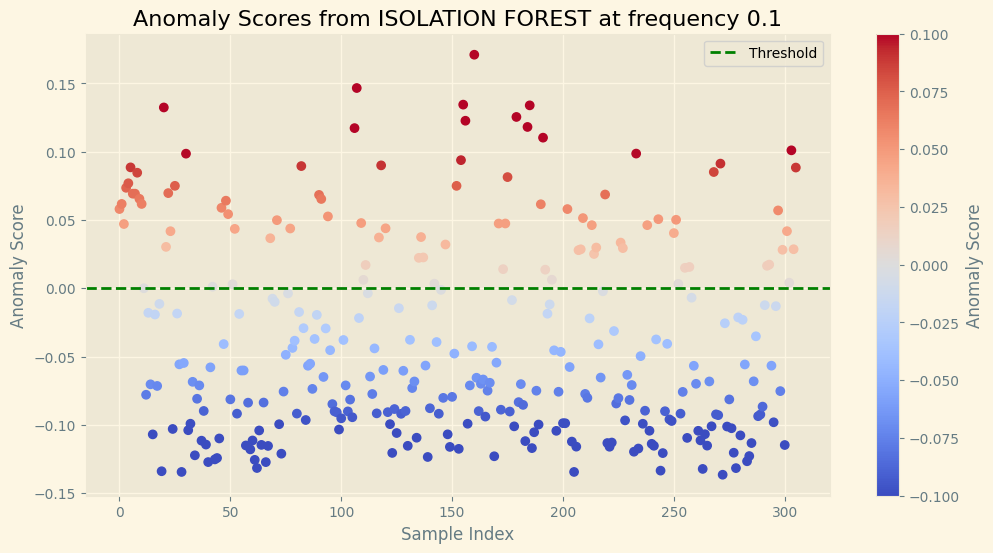

Number of anomalies detected: 89
Threshold: 0.0000
ROC AUC Score: 0.8882
F1 Score: 0.7111
Accuracy: 0.8301
Precision: 0.7191
Recall: 0.7033
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       215
           1       0.72      0.70      0.71        91

    accuracy                           0.83       306
   macro avg       0.80      0.79      0.80       306
weighted avg       0.83      0.83      0.83       306



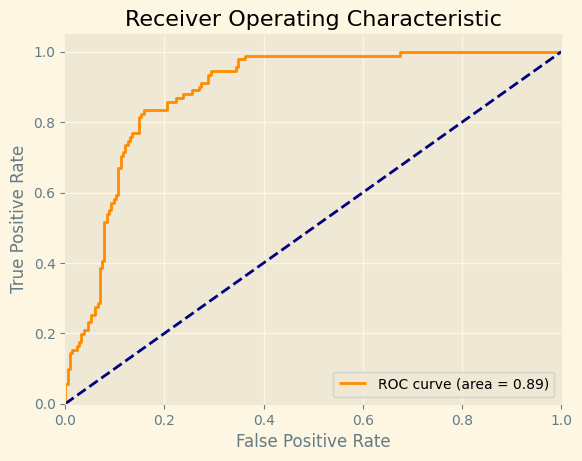

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
120
IsolationForest(contamination=0.2, n_estimators=10)
128
IsolationForest(contamination=0.3, n_estimators=10)
152
IsolationForest(contamination=0.4, n_estimators=10)
178
IsolationForest(contamination=0.5, n_estimators=10)
203
IsolationForest(contamination=0.03, n_estimators=10)
16
IsolationForest(contamination=0.0475, n_estimators=10)
86


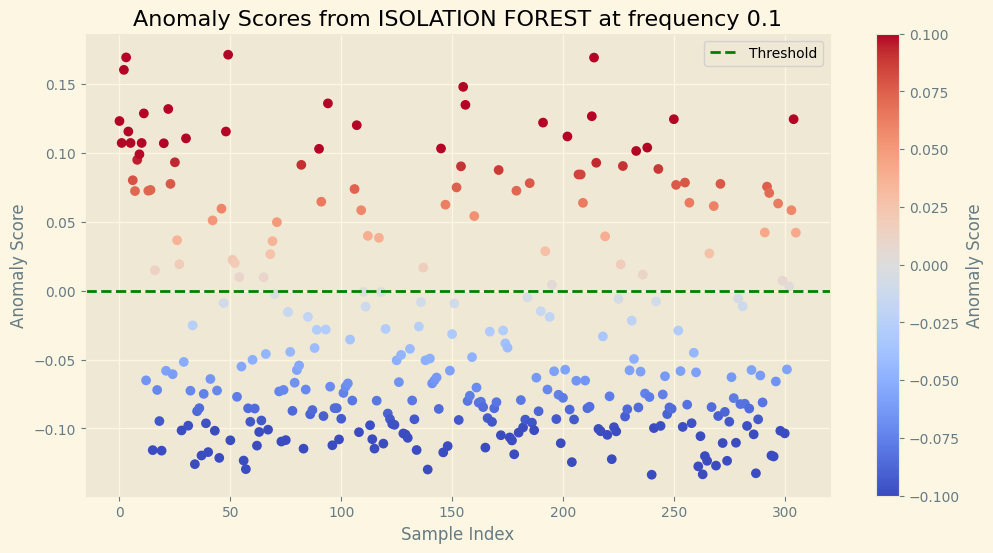

Number of anomalies detected: 86
Threshold: 0.0000
ROC AUC Score: 0.9052
F1 Score: 0.7006
Accuracy: 0.8268
Precision: 0.7209
Recall: 0.6813
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       215
           1       0.72      0.68      0.70        91

    accuracy                           0.83       306
   macro avg       0.79      0.78      0.79       306
weighted avg       0.82      0.83      0.83       306



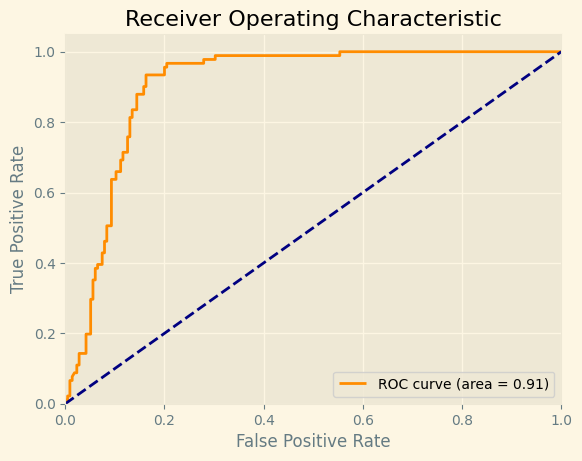

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=10)
75
IsolationForest(contamination=0.0825, n_estimators=10)
119


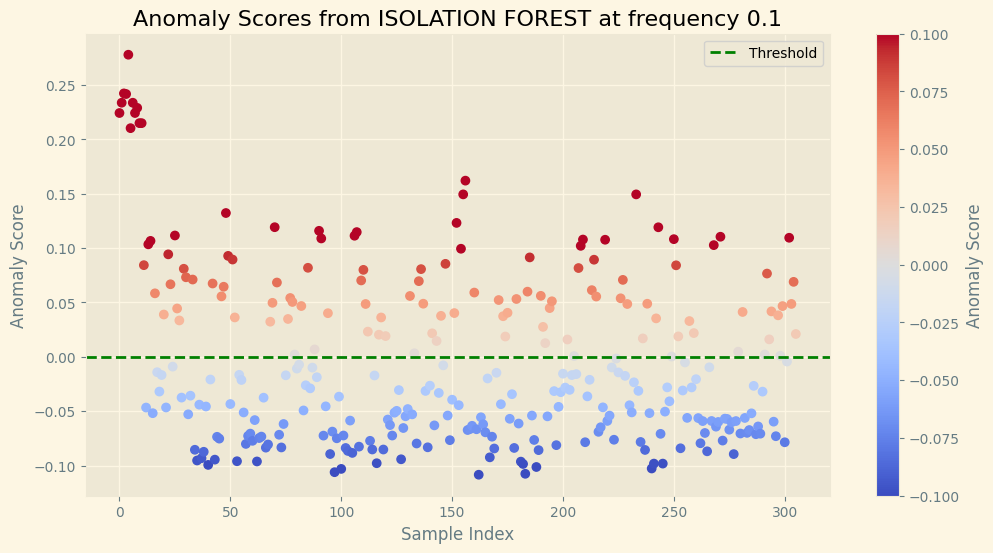

Number of anomalies detected: 119
Threshold: 0.0000
ROC AUC Score: 0.9041
F1 Score: 0.7810
Accuracy: 0.8497
Precision: 0.6891
Recall: 0.9011
              precision    recall  f1-score   support

           0       0.95      0.83      0.89       215
           1       0.69      0.90      0.78        91

    accuracy                           0.85       306
   macro avg       0.82      0.86      0.83       306
weighted avg       0.87      0.85      0.85       306



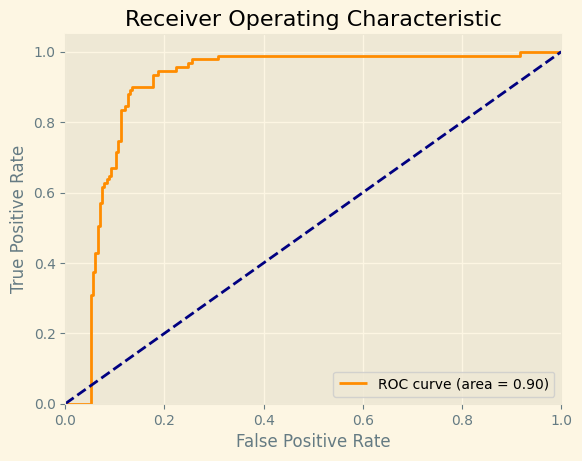

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
87


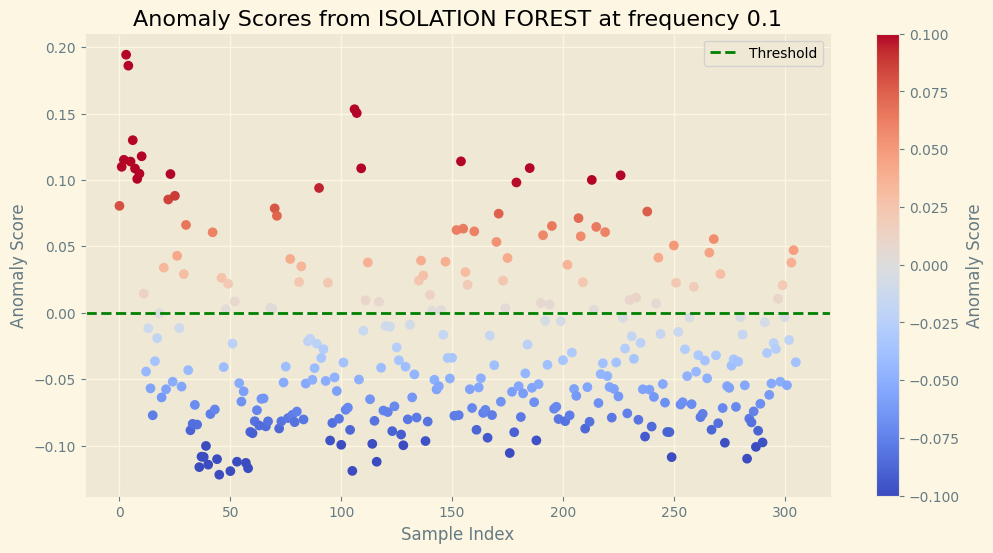

Number of anomalies detected: 87
Threshold: 0.0000
ROC AUC Score: 0.8618
F1 Score: 0.7191
Accuracy: 0.8366
Precision: 0.7356
Recall: 0.7033
              precision    recall  f1-score   support

           0       0.88      0.89      0.88       215
           1       0.74      0.70      0.72        91

    accuracy                           0.84       306
   macro avg       0.81      0.80      0.80       306
weighted avg       0.83      0.84      0.84       306



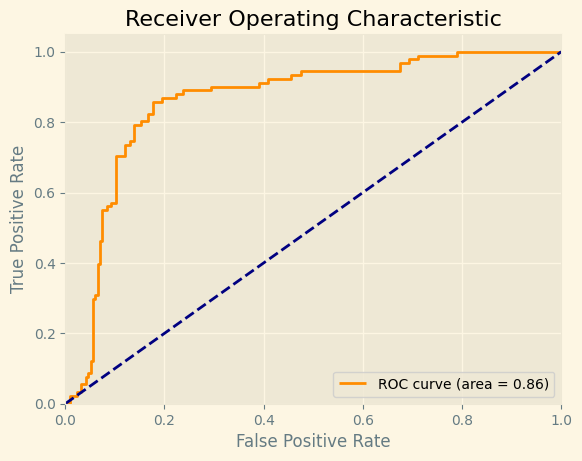

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327)
148
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
16
IsolationForest(contamination=0.05)
110


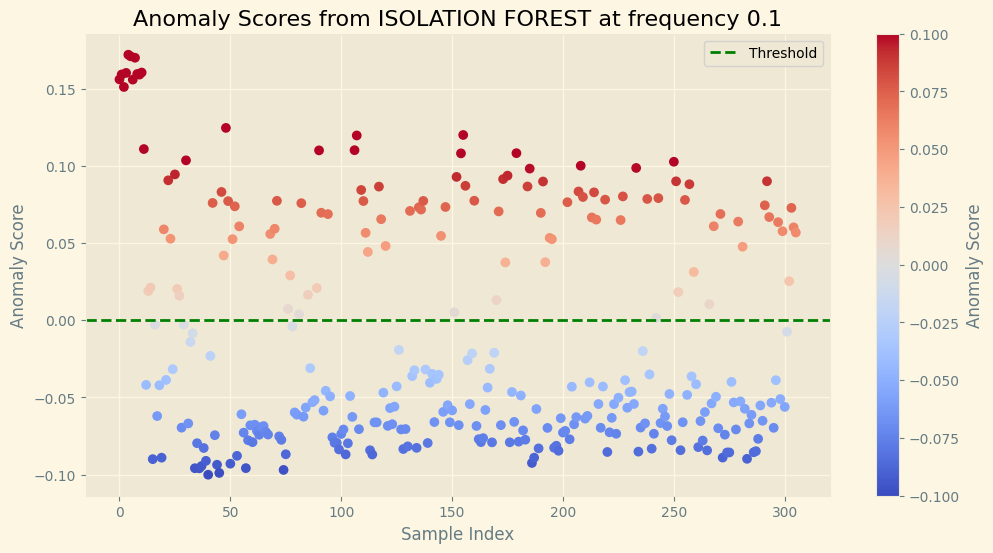

Number of anomalies detected: 110
Threshold: 0.0000
ROC AUC Score: 0.9099
F1 Score: 0.8259
Accuracy: 0.8856
Precision: 0.7545
Recall: 0.9121
              precision    recall  f1-score   support

           0       0.96      0.87      0.91       215
           1       0.75      0.91      0.83        91

    accuracy                           0.89       306
   macro avg       0.86      0.89      0.87       306
weighted avg       0.90      0.89      0.89       306



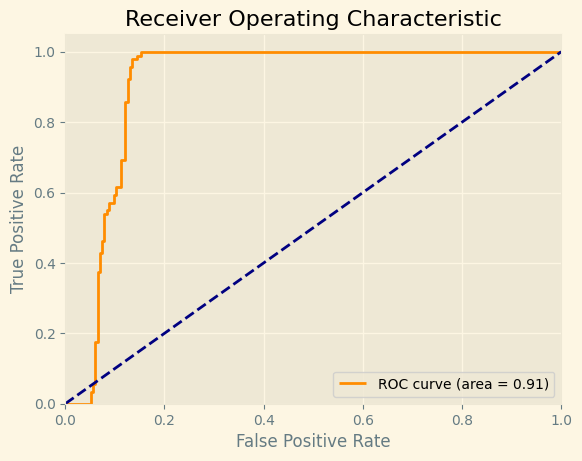

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
119


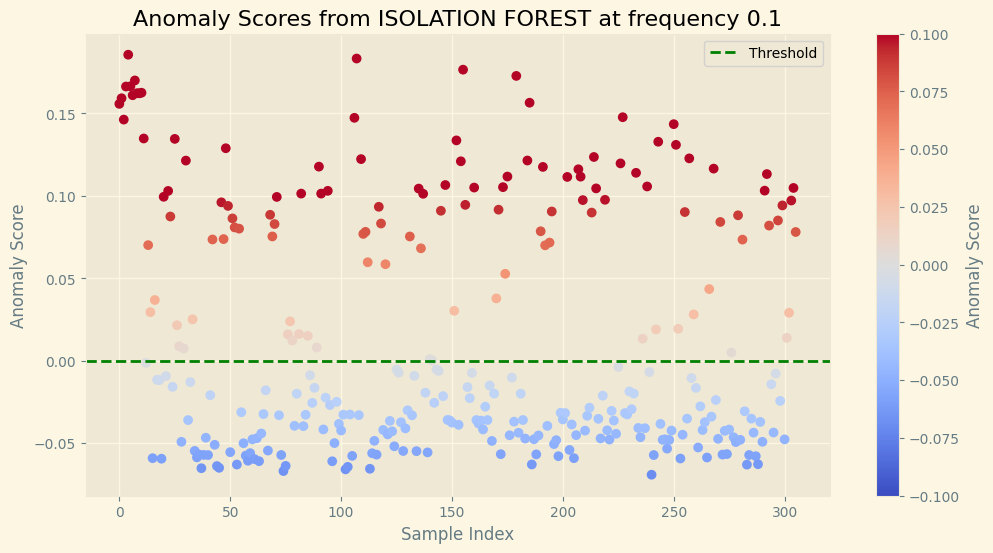

Number of anomalies detected: 119
Threshold: 0.0000
ROC AUC Score: 0.9062
F1 Score: 0.8381
Accuracy: 0.8889
Precision: 0.7395
Recall: 0.9670
              precision    recall  f1-score   support

           0       0.98      0.86      0.92       215
           1       0.74      0.97      0.84        91

    accuracy                           0.89       306
   macro avg       0.86      0.91      0.88       306
weighted avg       0.91      0.89      0.89       306



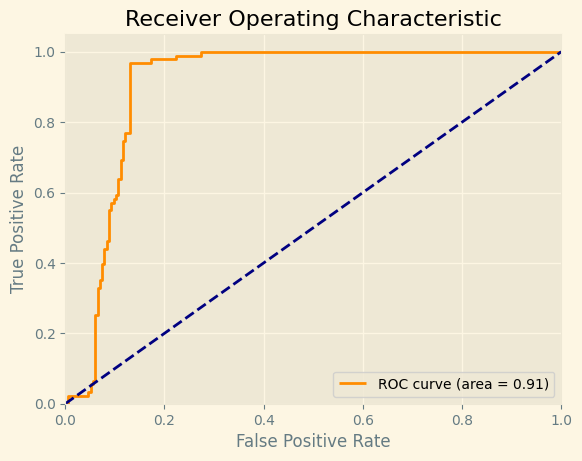

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
143
IsolationForest(contamination=0.3)
159
IsolationForest(contamination=0.4)
173
IsolationForest(contamination=0.5)
189
IsolationForest(contamination=0.03)
17
IsolationForest(contamination=0.0475)
115


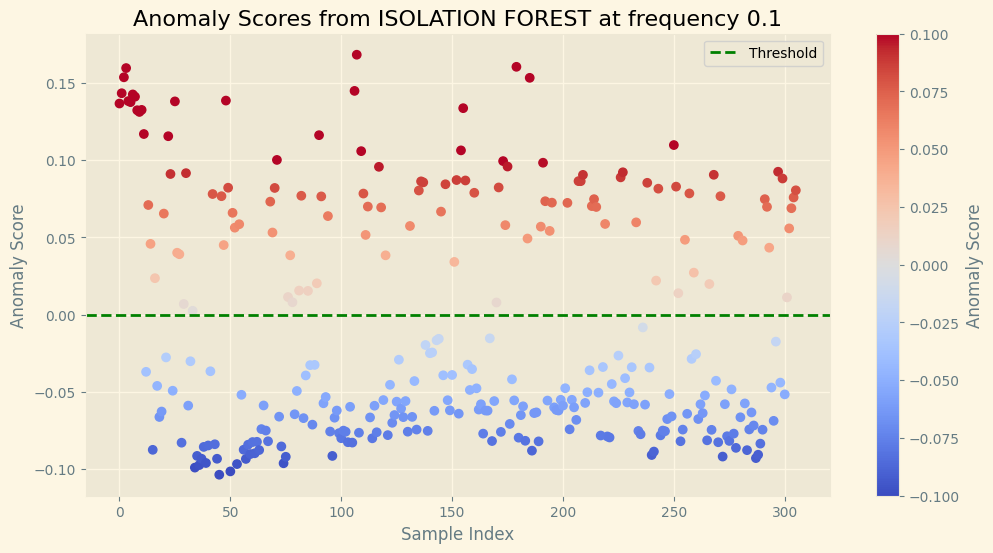

Number of anomalies detected: 115
Threshold: 0.0000
ROC AUC Score: 0.9108
F1 Score: 0.8447
Accuracy: 0.8954
Precision: 0.7565
Recall: 0.9560
              precision    recall  f1-score   support

           0       0.98      0.87      0.92       215
           1       0.76      0.96      0.84        91

    accuracy                           0.90       306
   macro avg       0.87      0.91      0.88       306
weighted avg       0.91      0.90      0.90       306



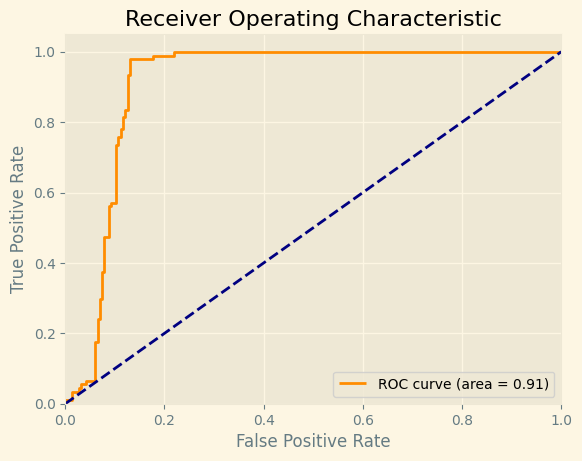

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
116


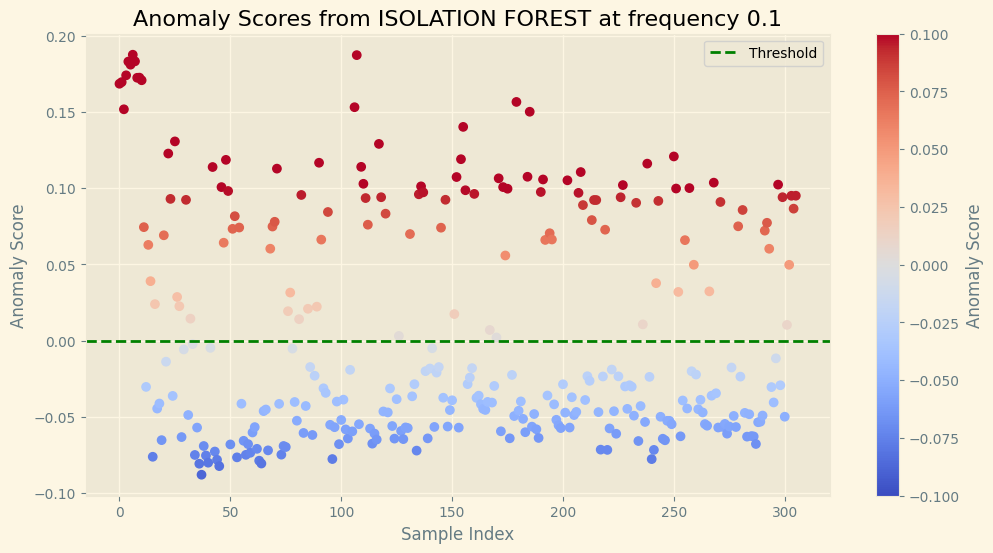

Number of anomalies detected: 116
Threshold: 0.0000
ROC AUC Score: 0.9106
F1 Score: 0.8406
Accuracy: 0.8922
Precision: 0.7500
Recall: 0.9560
              precision    recall  f1-score   support

           0       0.98      0.87      0.92       215
           1       0.75      0.96      0.84        91

    accuracy                           0.89       306
   macro avg       0.86      0.91      0.88       306
weighted avg       0.91      0.89      0.90       306



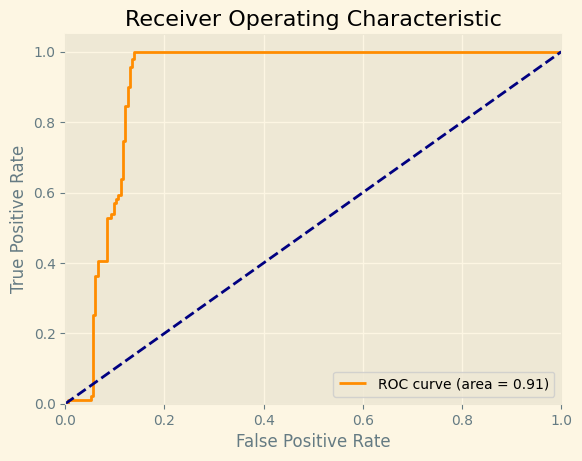

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
120
IsolationForest(contamination=0.1)
119


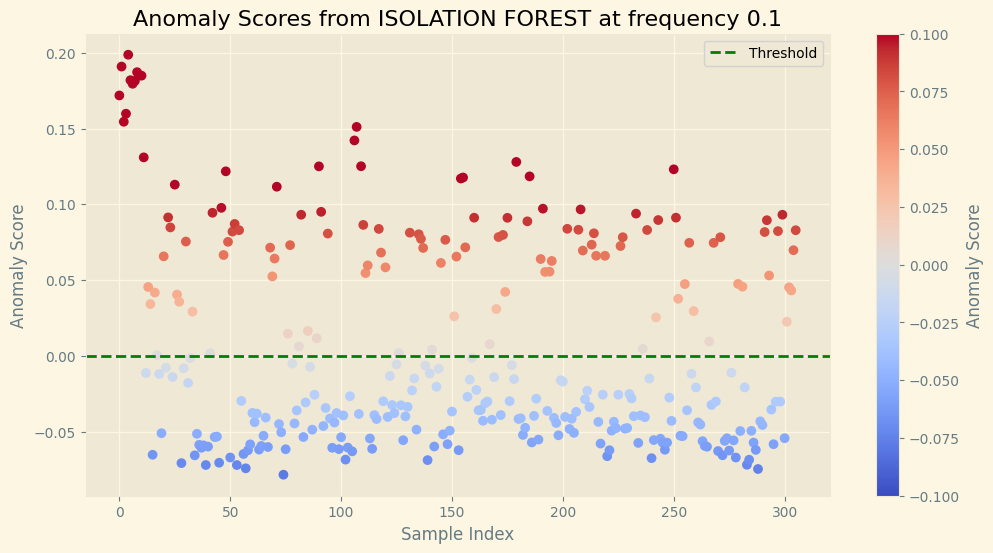

Number of anomalies detected: 119
Threshold: 0.0000
ROC AUC Score: 0.9088
F1 Score: 0.8476
Accuracy: 0.8954
Precision: 0.7479
Recall: 0.9780
              precision    recall  f1-score   support

           0       0.99      0.86      0.92       215
           1       0.75      0.98      0.85        91

    accuracy                           0.90       306
   macro avg       0.87      0.92      0.88       306
weighted avg       0.92      0.90      0.90       306



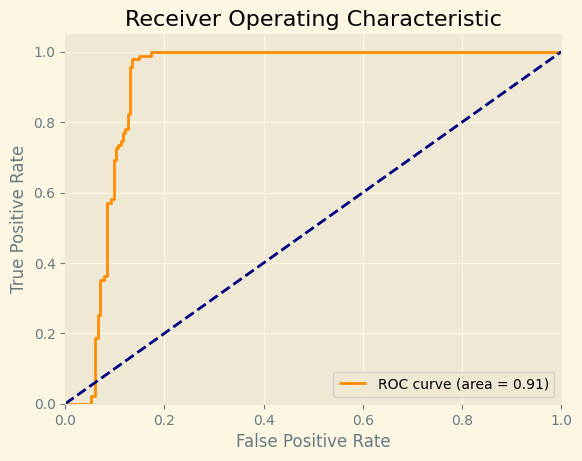

########################## ---------------------------------------- ##########################


In [21]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = np.sum(anomaly_scores > 0)    
    print(f"{anomalies_detected}")
    if (anomalies_detected > 80 and anomalies_detected < 120):
        _ = plot_anomalies(anomaly_scores, freq, threshold, "ISOLATION FOREST")
        compute_metrics(anomaly_scores, y_test_collision, threshold)
        plot_roc_curve(y_test_collision.values, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

### Classifying collisions_1

IsolationForest(contamination=0.2973856209150327, n_estimators=1)
43


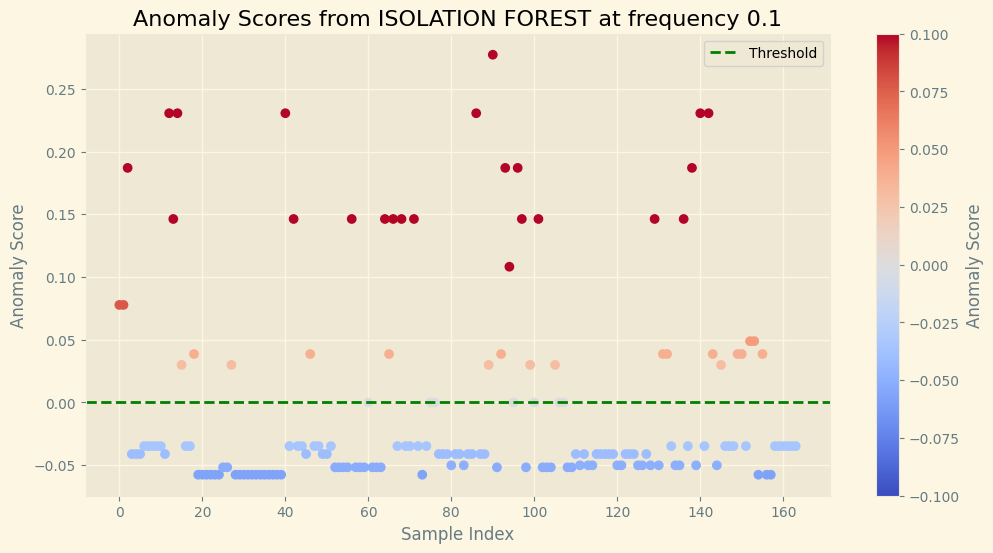

Number of anomalies detected: 43
Threshold: 0.0000
ROC AUC Score: 0.6516
F1 Score: 0.3333
Accuracy: 0.6829
Precision: 0.3023
Recall: 0.3714
              precision    recall  f1-score   support

           0       0.82      0.77      0.79       129
           1       0.30      0.37      0.33        35

    accuracy                           0.68       164
   macro avg       0.56      0.57      0.56       164
weighted avg       0.71      0.68      0.69       164



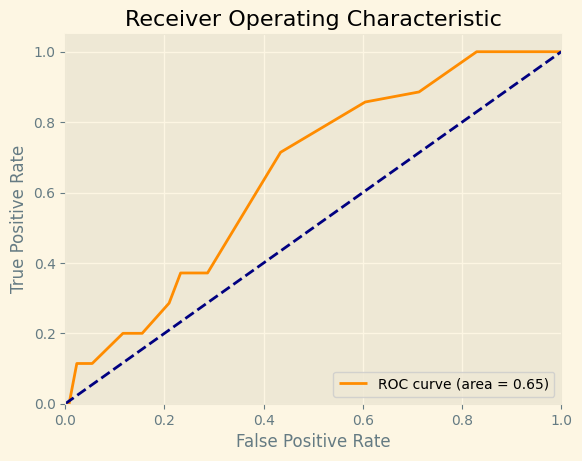

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
5
IsolationForest(contamination=0.05, n_estimators=1)
3
IsolationForest(contamination=0.1, n_estimators=1)
8
IsolationForest(contamination=0.2, n_estimators=1)
39


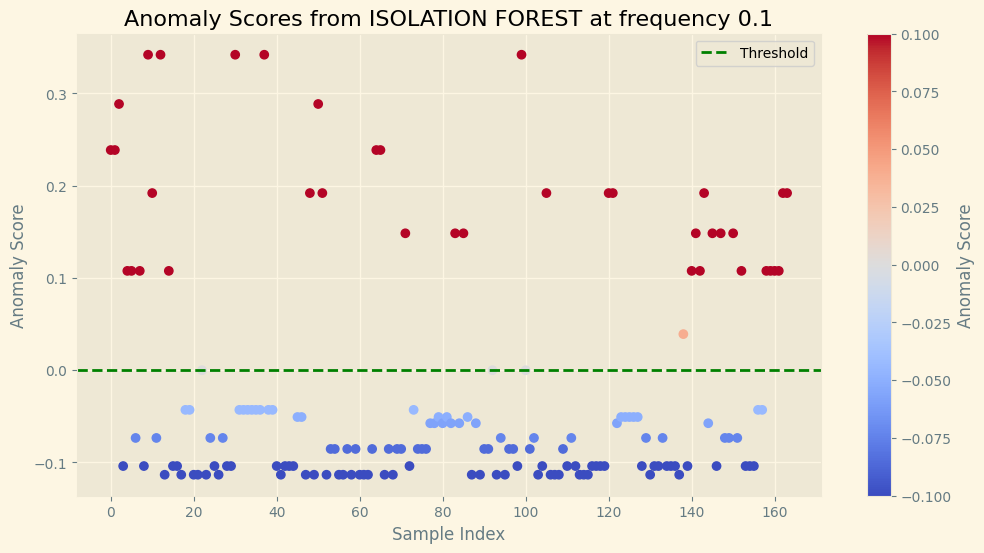

Number of anomalies detected: 39
Threshold: 0.0000
ROC AUC Score: 0.6147
F1 Score: 0.4595
Accuracy: 0.7561
Precision: 0.4359
Recall: 0.4857
              precision    recall  f1-score   support

           0       0.86      0.83      0.84       129
           1       0.44      0.49      0.46        35

    accuracy                           0.76       164
   macro avg       0.65      0.66      0.65       164
weighted avg       0.77      0.76      0.76       164



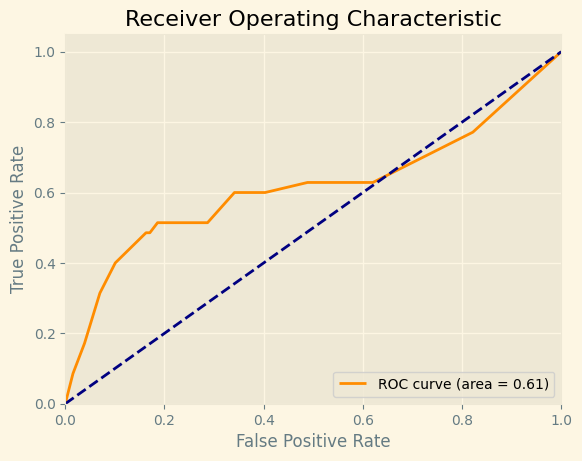

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=1)
51


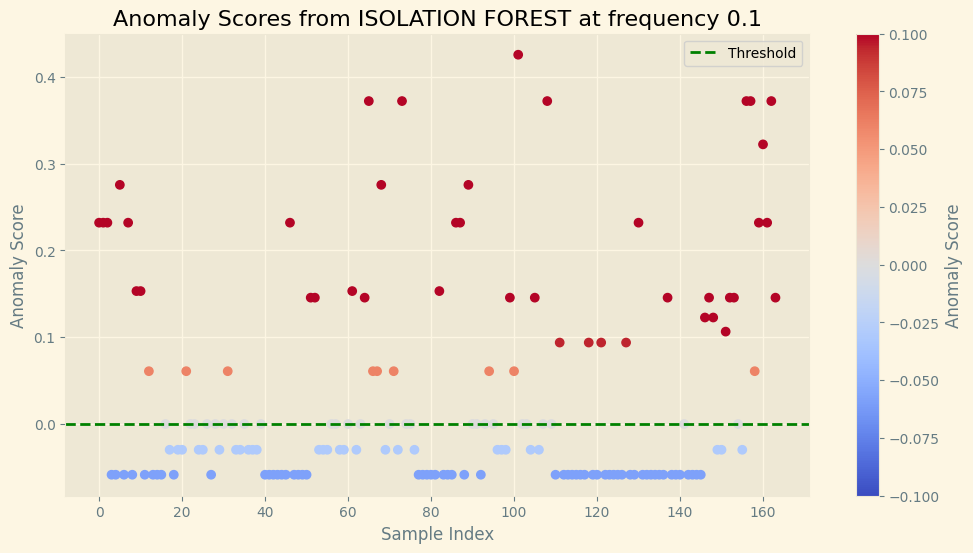

Number of anomalies detected: 51
Threshold: 0.0000
ROC AUC Score: 0.6073
F1 Score: 0.4186
Accuracy: 0.6951
Precision: 0.3529
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.85      0.74      0.79       129
           1       0.35      0.51      0.42        35

    accuracy                           0.70       164
   macro avg       0.60      0.63      0.61       164
weighted avg       0.74      0.70      0.71       164



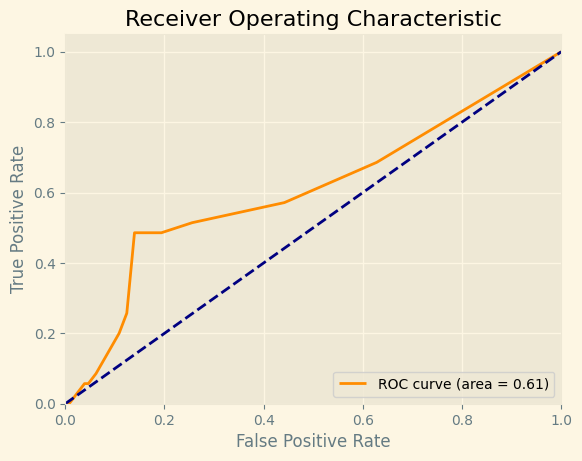

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=1)
49


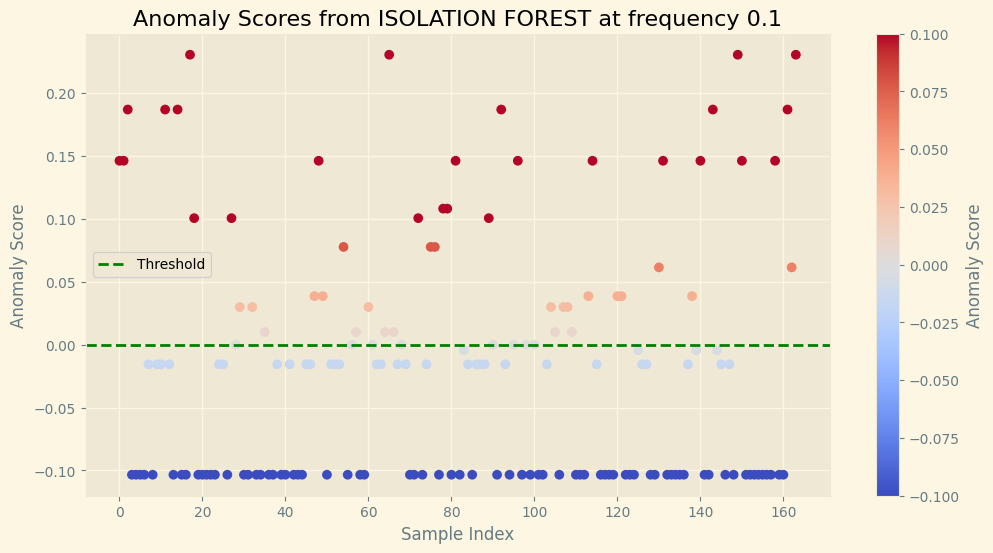

Number of anomalies detected: 49
Threshold: 0.0000
ROC AUC Score: 0.5653
F1 Score: 0.2619
Accuracy: 0.6220
Precision: 0.2245
Recall: 0.3143
              precision    recall  f1-score   support

           0       0.79      0.71      0.75       129
           1       0.22      0.31      0.26        35

    accuracy                           0.62       164
   macro avg       0.51      0.51      0.50       164
weighted avg       0.67      0.62      0.64       164



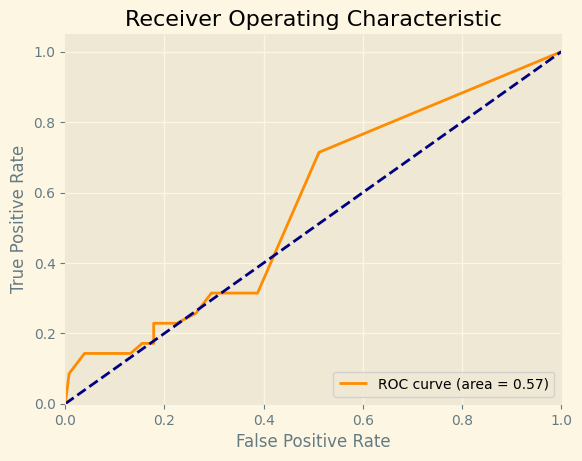

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=1)
53


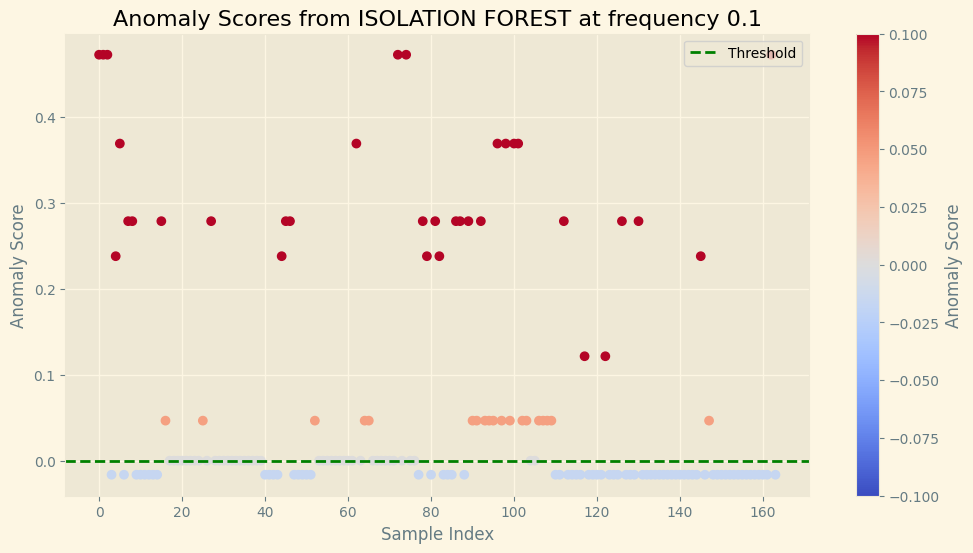

Number of anomalies detected: 53
Threshold: 0.0000
ROC AUC Score: 0.5684
F1 Score: 0.3864
Accuracy: 0.6707
Precision: 0.3208
Recall: 0.4857
              precision    recall  f1-score   support

           0       0.84      0.72      0.78       129
           1       0.32      0.49      0.39        35

    accuracy                           0.67       164
   macro avg       0.58      0.60      0.58       164
weighted avg       0.73      0.67      0.69       164



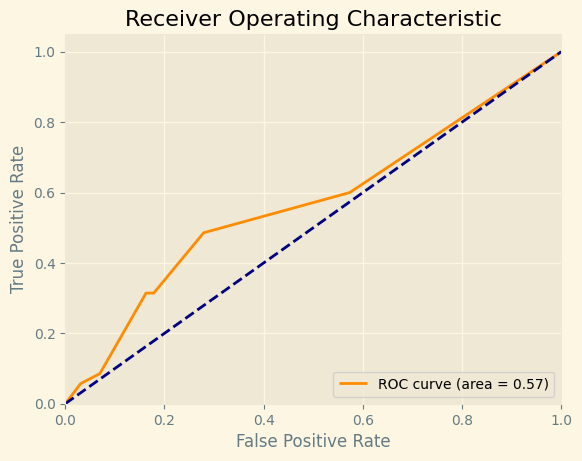

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.03, n_estimators=1)
0
IsolationForest(contamination=0.0475, n_estimators=1)
17
IsolationForest(contamination=0.065, n_estimators=1)
11
IsolationForest(contamination=0.0825, n_estimators=1)
8
IsolationForest(contamination=0.1, n_estimators=1)
40


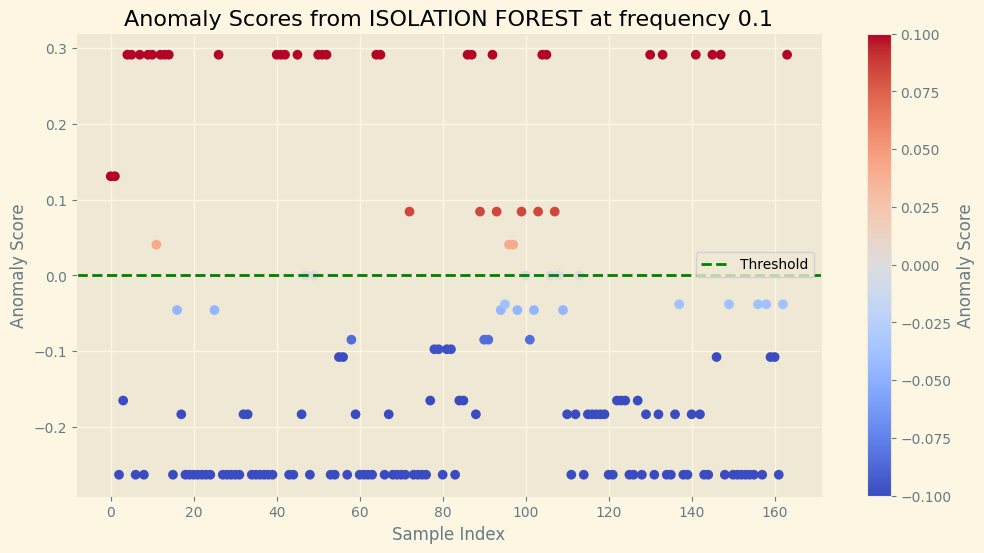

Number of anomalies detected: 40
Threshold: 0.0000
ROC AUC Score: 0.9576
F1 Score: 0.8000
Accuracy: 0.9085
Precision: 0.7500
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       129
           1       0.75      0.86      0.80        35

    accuracy                           0.91       164
   macro avg       0.85      0.89      0.87       164
weighted avg       0.91      0.91      0.91       164



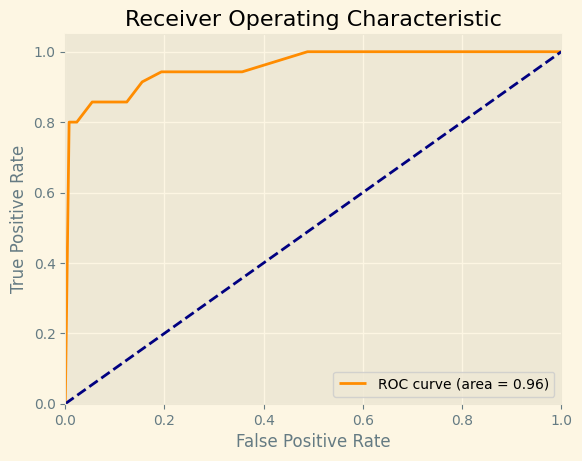

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=2)
57


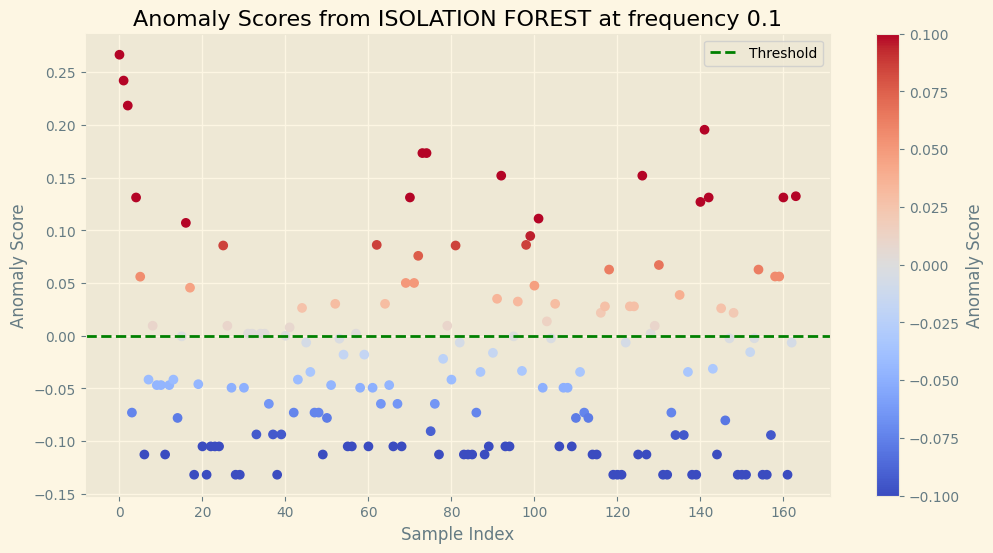

Number of anomalies detected: 57
Threshold: 0.0000
ROC AUC Score: 0.6908
F1 Score: 0.3478
Accuracy: 0.6341
Precision: 0.2807
Recall: 0.4571
              precision    recall  f1-score   support

           0       0.82      0.68      0.75       129
           1       0.28      0.46      0.35        35

    accuracy                           0.63       164
   macro avg       0.55      0.57      0.55       164
weighted avg       0.71      0.63      0.66       164



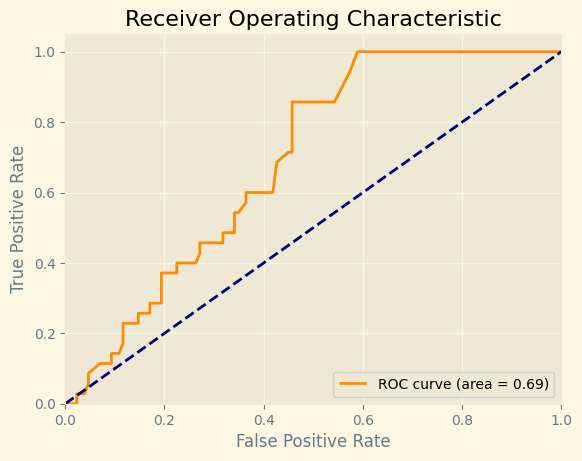

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
14
IsolationForest(contamination=0.05, n_estimators=2)
13
IsolationForest(contamination=0.1, n_estimators=2)
18
IsolationForest(contamination=0.2, n_estimators=2)
29


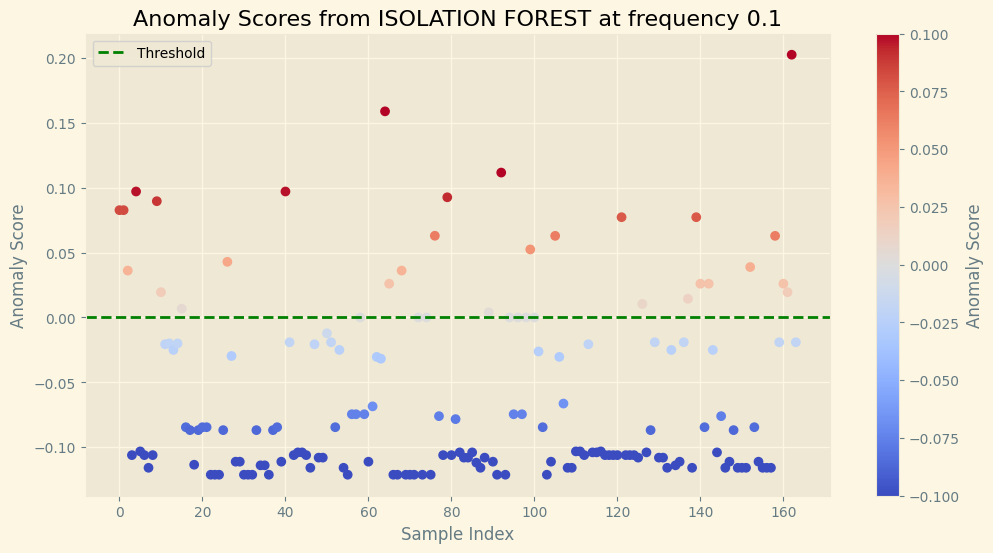

Number of anomalies detected: 29
Threshold: 0.0000
ROC AUC Score: 0.7104
F1 Score: 0.3750
Accuracy: 0.7561
Precision: 0.4138
Recall: 0.3429
              precision    recall  f1-score   support

           0       0.83      0.87      0.85       129
           1       0.41      0.34      0.38        35

    accuracy                           0.76       164
   macro avg       0.62      0.61      0.61       164
weighted avg       0.74      0.76      0.75       164



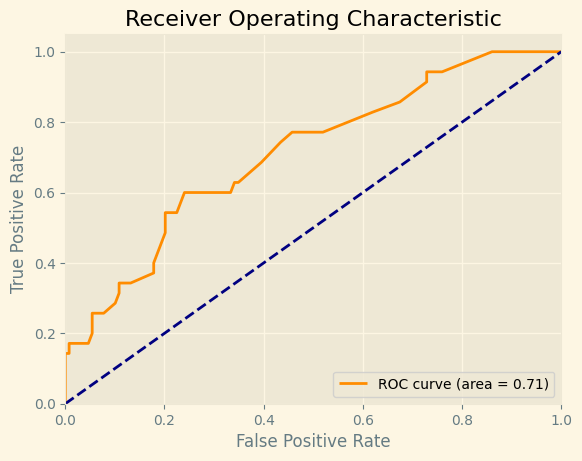

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=2)
68
IsolationForest(contamination=0.4, n_estimators=2)
68
IsolationForest(contamination=0.5, n_estimators=2)
92
IsolationForest(contamination=0.03, n_estimators=2)
9
IsolationForest(contamination=0.0475, n_estimators=2)
3
IsolationForest(contamination=0.065, n_estimators=2)
16
IsolationForest(contamination=0.0825, n_estimators=2)
24


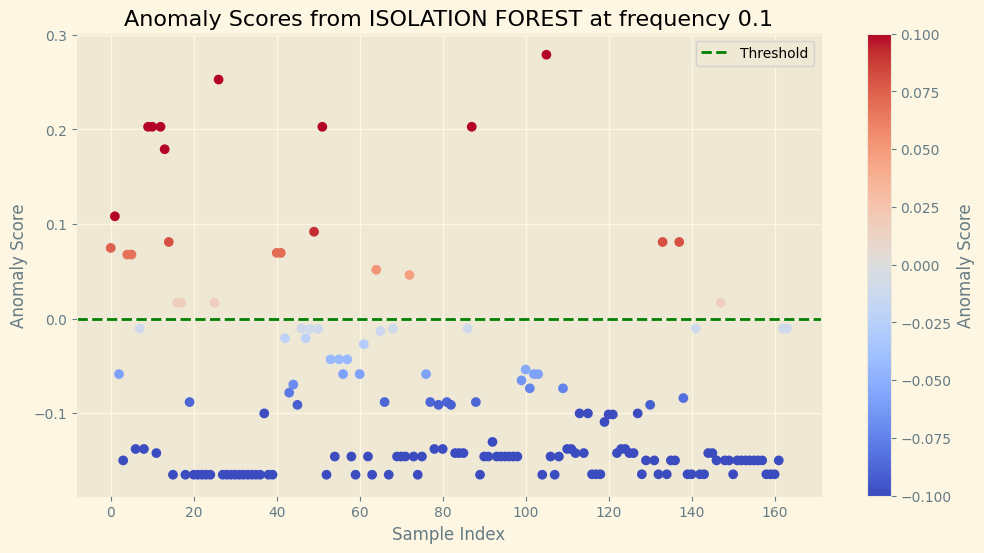

Number of anomalies detected: 24
Threshold: 0.0000
ROC AUC Score: 0.8934
F1 Score: 0.6780
Accuracy: 0.8841
Precision: 0.8333
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       129
           1       0.83      0.57      0.68        35

    accuracy                           0.88       164
   macro avg       0.86      0.77      0.80       164
weighted avg       0.88      0.88      0.88       164



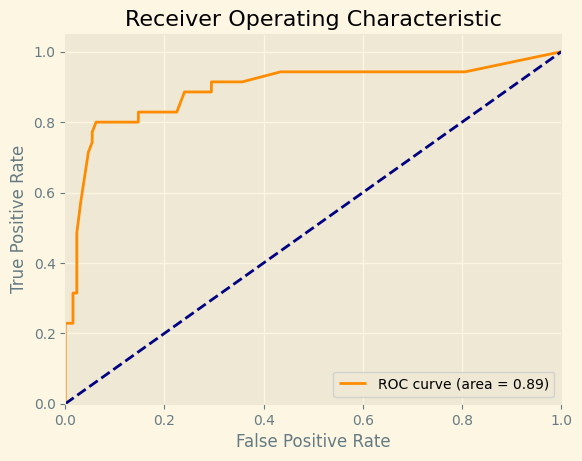

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=2)
22


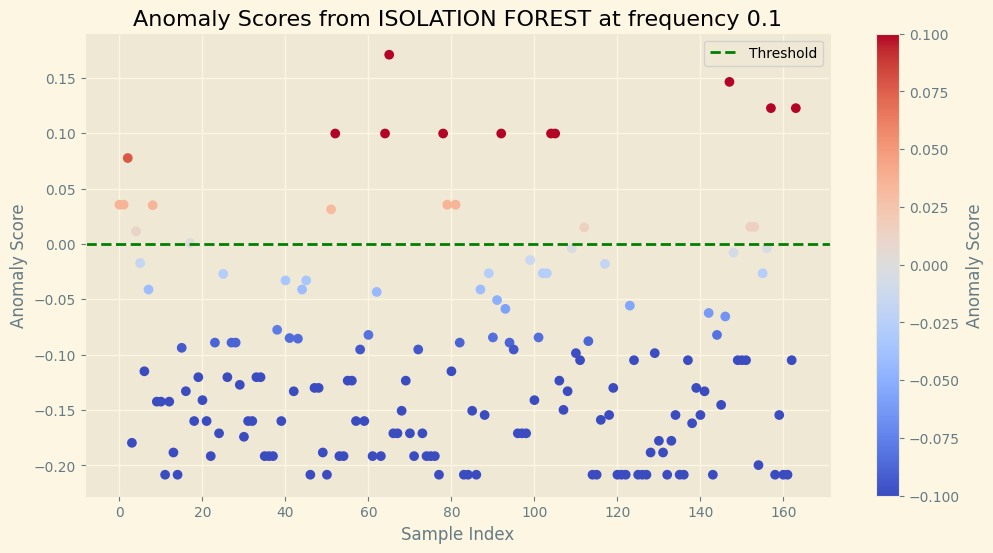

Number of anomalies detected: 22
Threshold: 0.0000
ROC AUC Score: 0.6636
F1 Score: 0.3860
Accuracy: 0.7866
Precision: 0.5000
Recall: 0.3143
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       129
           1       0.50      0.31      0.39        35

    accuracy                           0.79       164
   macro avg       0.67      0.61      0.63       164
weighted avg       0.76      0.79      0.77       164



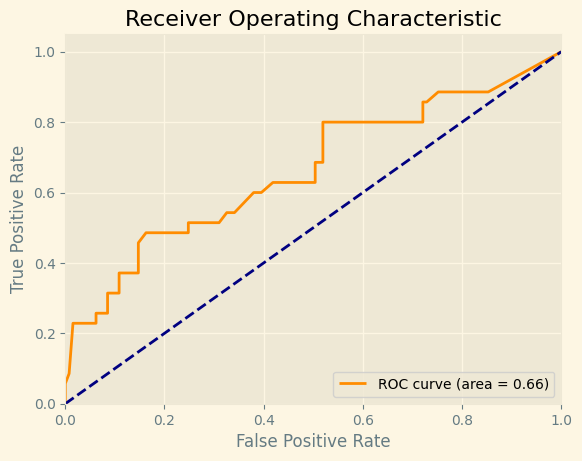

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=3)
63
IsolationForest(contamination=0.005, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
4
IsolationForest(contamination=0.03, n_estimators=3)
2
IsolationForest(contamination=0.05, n_estimators=3)
12
IsolationForest(contamination=0.1, n_estimators=3)
21


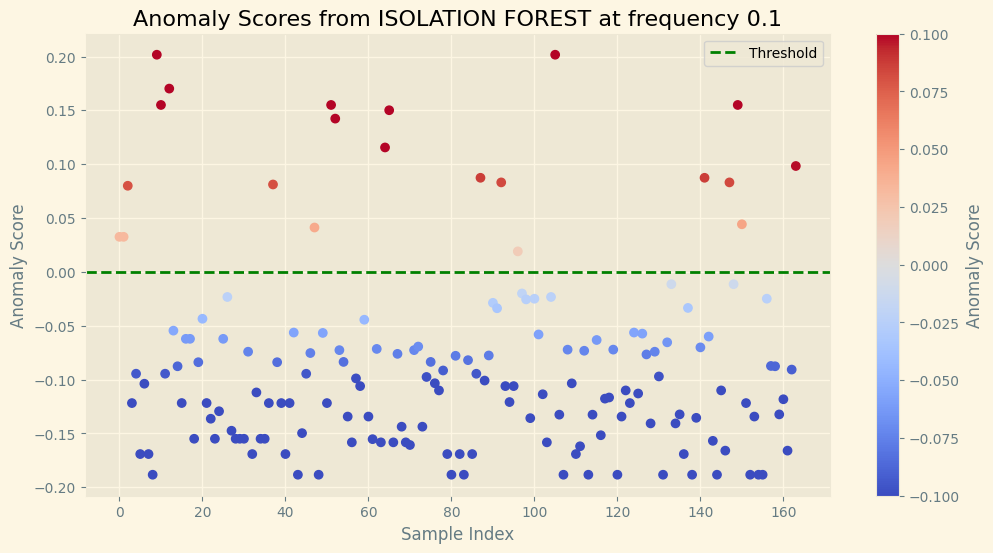

Number of anomalies detected: 21
Threshold: 0.0000
ROC AUC Score: 0.7856
F1 Score: 0.4643
Accuracy: 0.8171
Precision: 0.6190
Recall: 0.3714
              precision    recall  f1-score   support

           0       0.85      0.94      0.89       129
           1       0.62      0.37      0.46        35

    accuracy                           0.82       164
   macro avg       0.73      0.65      0.68       164
weighted avg       0.80      0.82      0.80       164



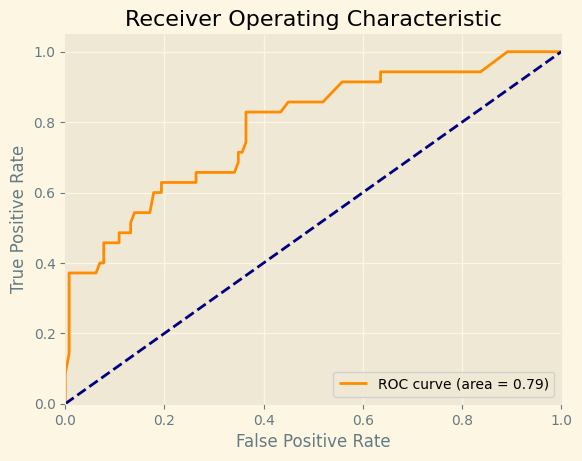

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
48


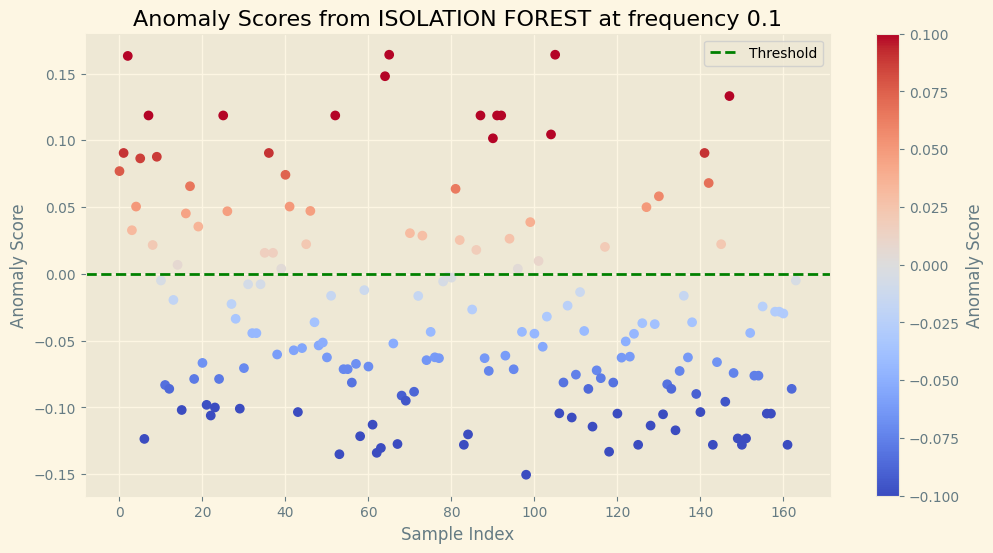

Number of anomalies detected: 48
Threshold: 0.0000
ROC AUC Score: 0.8271
F1 Score: 0.5783
Accuracy: 0.7866
Precision: 0.5000
Recall: 0.6857
              precision    recall  f1-score   support

           0       0.91      0.81      0.86       129
           1       0.50      0.69      0.58        35

    accuracy                           0.79       164
   macro avg       0.70      0.75      0.72       164
weighted avg       0.82      0.79      0.80       164



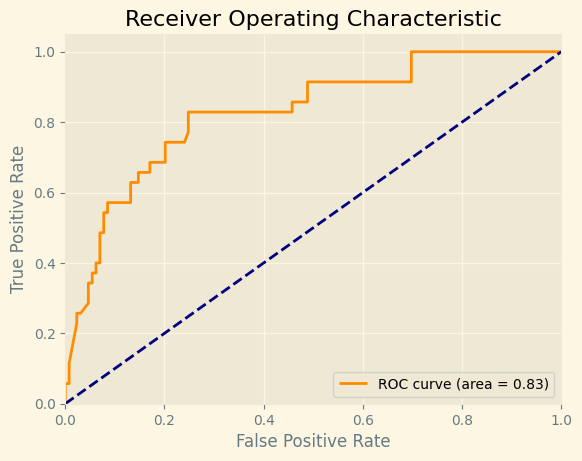

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
64
IsolationForest(contamination=0.4, n_estimators=3)
77
IsolationForest(contamination=0.5, n_estimators=3)
102
IsolationForest(contamination=0.03, n_estimators=3)
10
IsolationForest(contamination=0.0475, n_estimators=3)
4
IsolationForest(contamination=0.065, n_estimators=3)
19
IsolationForest(contamination=0.0825, n_estimators=3)
19
IsolationForest(contamination=0.1, n_estimators=3)
35


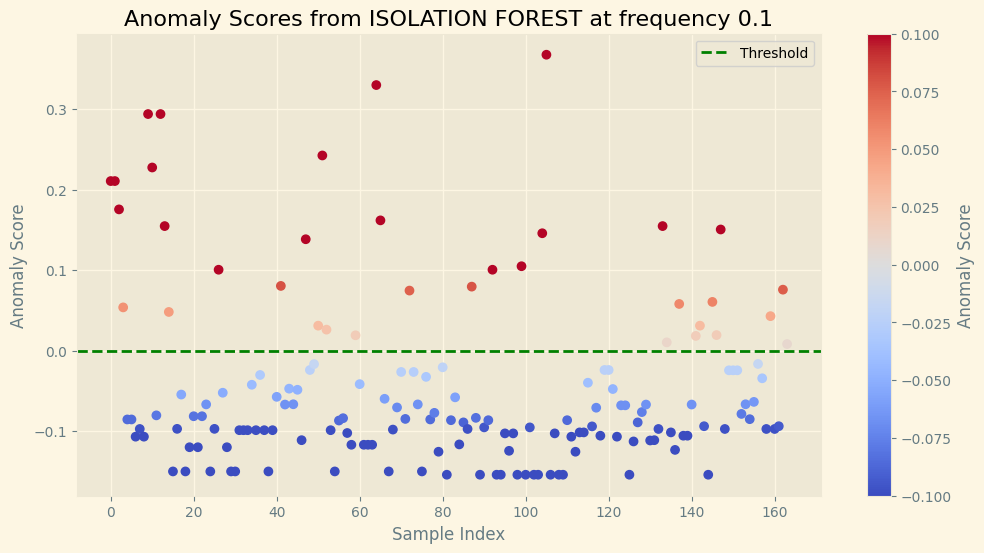

Number of anomalies detected: 35
Threshold: 0.0000
ROC AUC Score: 0.8574
F1 Score: 0.7143
Accuracy: 0.8780
Precision: 0.7143
Recall: 0.7143
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       129
           1       0.71      0.71      0.71        35

    accuracy                           0.88       164
   macro avg       0.82      0.82      0.82       164
weighted avg       0.88      0.88      0.88       164



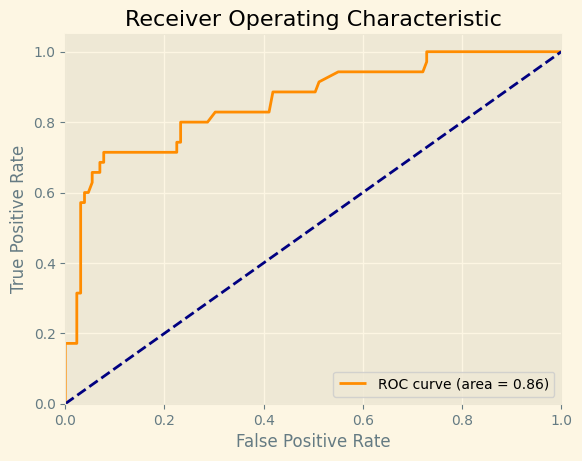

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=5)
69
IsolationForest(contamination=0.005, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.03, n_estimators=5)
3
IsolationForest(contamination=0.05, n_estimators=5)
10
IsolationForest(contamination=0.1, n_estimators=5)
15
IsolationForest(contamination=0.2, n_estimators=5)
63
IsolationForest(contamination=0.3, n_estimators=5)
55


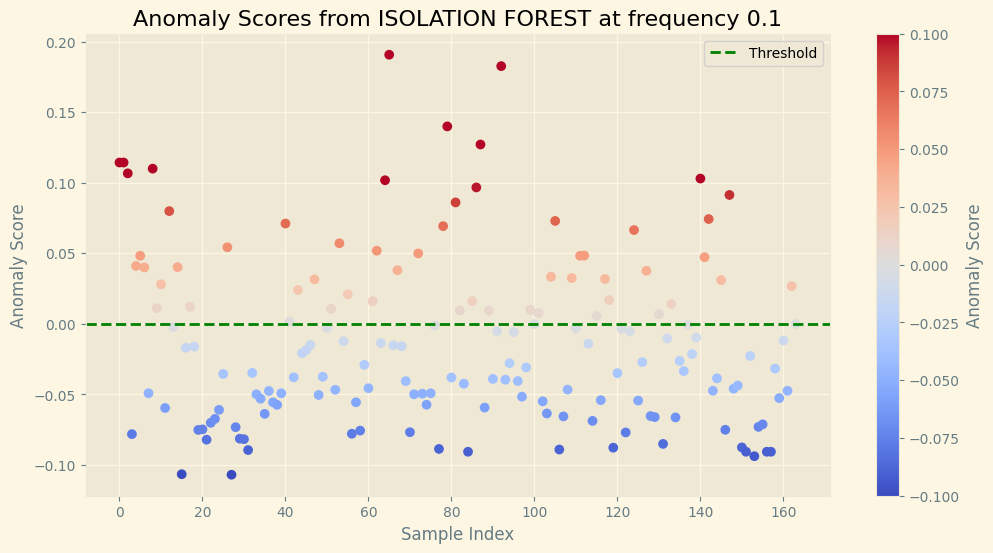

Number of anomalies detected: 55
Threshold: 0.0000
ROC AUC Score: 0.8282
F1 Score: 0.5778
Accuracy: 0.7683
Precision: 0.4727
Recall: 0.7429
              precision    recall  f1-score   support

           0       0.92      0.78      0.84       129
           1       0.47      0.74      0.58        35

    accuracy                           0.77       164
   macro avg       0.70      0.76      0.71       164
weighted avg       0.82      0.77      0.78       164



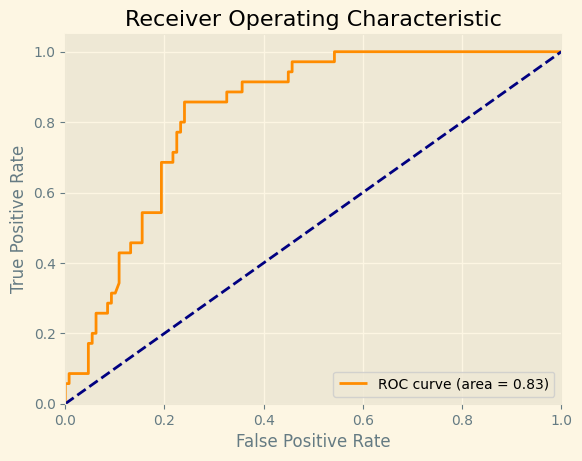

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=5)
70
IsolationForest(contamination=0.5, n_estimators=5)
86
IsolationForest(contamination=0.03, n_estimators=5)
6
IsolationForest(contamination=0.0475, n_estimators=5)
16
IsolationForest(contamination=0.065, n_estimators=5)
19
IsolationForest(contamination=0.0825, n_estimators=5)
20
IsolationForest(contamination=0.1, n_estimators=5)
33


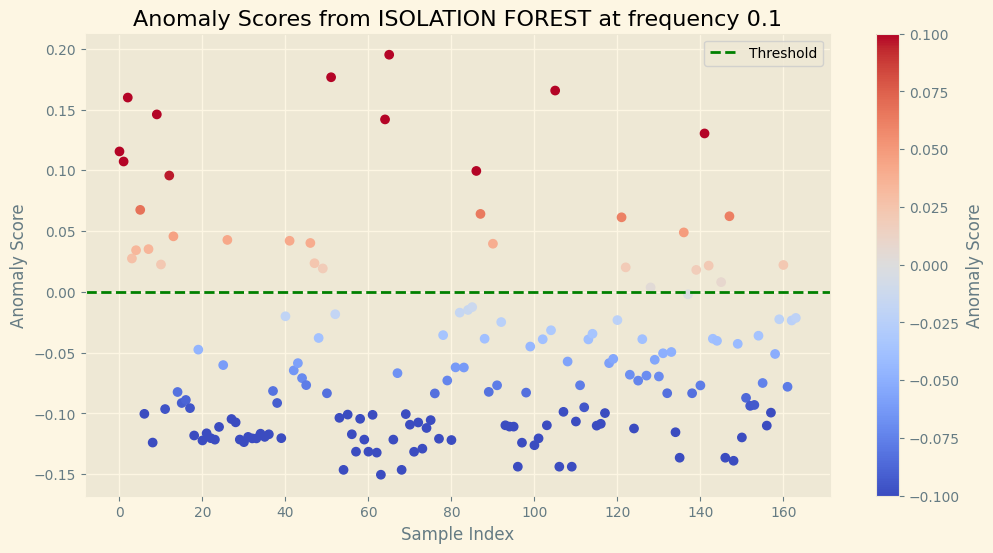

Number of anomalies detected: 33
Threshold: 0.0000
ROC AUC Score: 0.8478
F1 Score: 0.5294
Accuracy: 0.8049
Precision: 0.5455
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.87      0.88      0.88       129
           1       0.55      0.51      0.53        35

    accuracy                           0.80       164
   macro avg       0.71      0.70      0.70       164
weighted avg       0.80      0.80      0.80       164



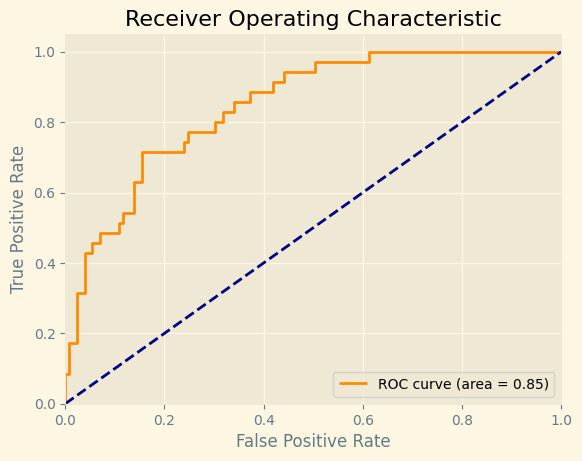

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=10)
71
IsolationForest(contamination=0.005, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
3
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
23


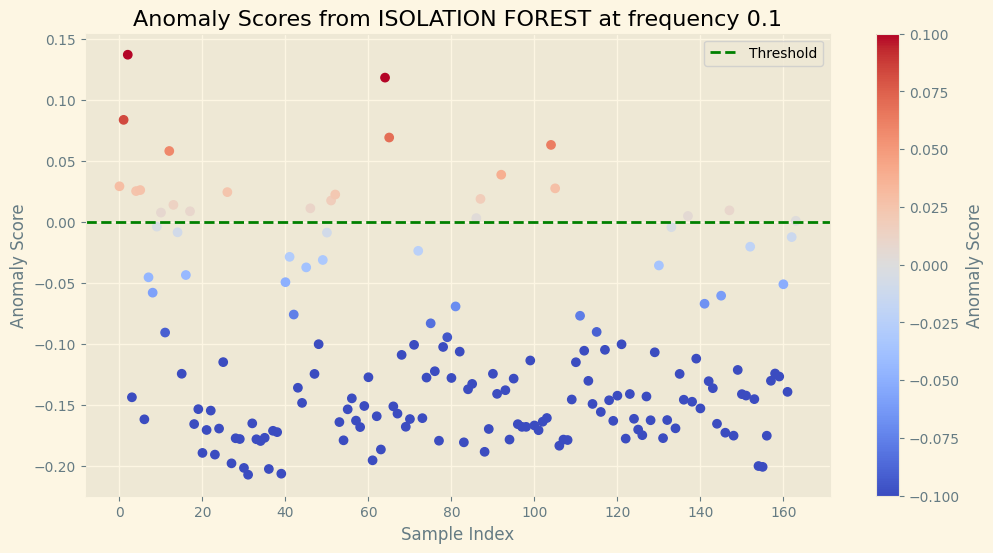

Number of anomalies detected: 23
Threshold: 0.0000
ROC AUC Score: 0.9619
F1 Score: 0.6897
Accuracy: 0.8902
Precision: 0.8696
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       129
           1       0.87      0.57      0.69        35

    accuracy                           0.89       164
   macro avg       0.88      0.77      0.81       164
weighted avg       0.89      0.89      0.88       164



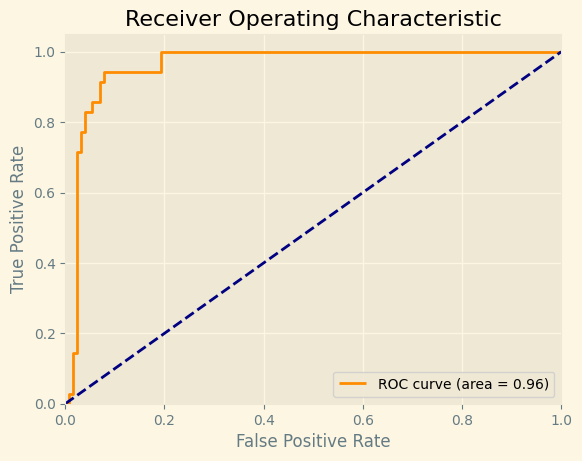

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.05, n_estimators=10)
21


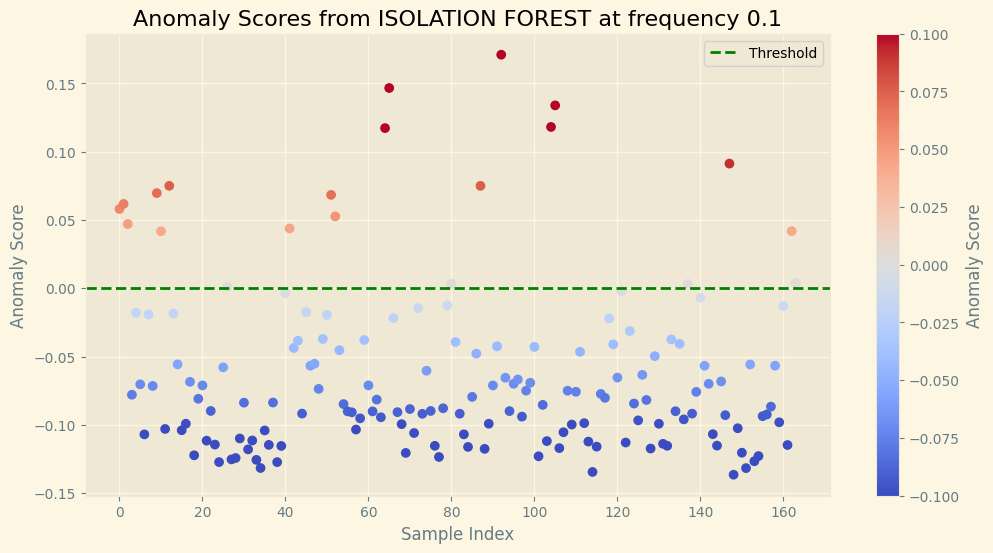

Number of anomalies detected: 21
Threshold: 0.0000
ROC AUC Score: 0.9043
F1 Score: 0.6071
Accuracy: 0.8659
Precision: 0.8095
Recall: 0.4857
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       129
           1       0.81      0.49      0.61        35

    accuracy                           0.87       164
   macro avg       0.84      0.73      0.76       164
weighted avg       0.86      0.87      0.85       164



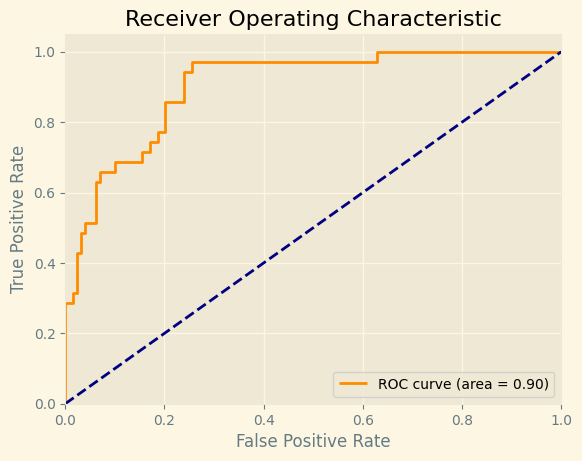

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
39


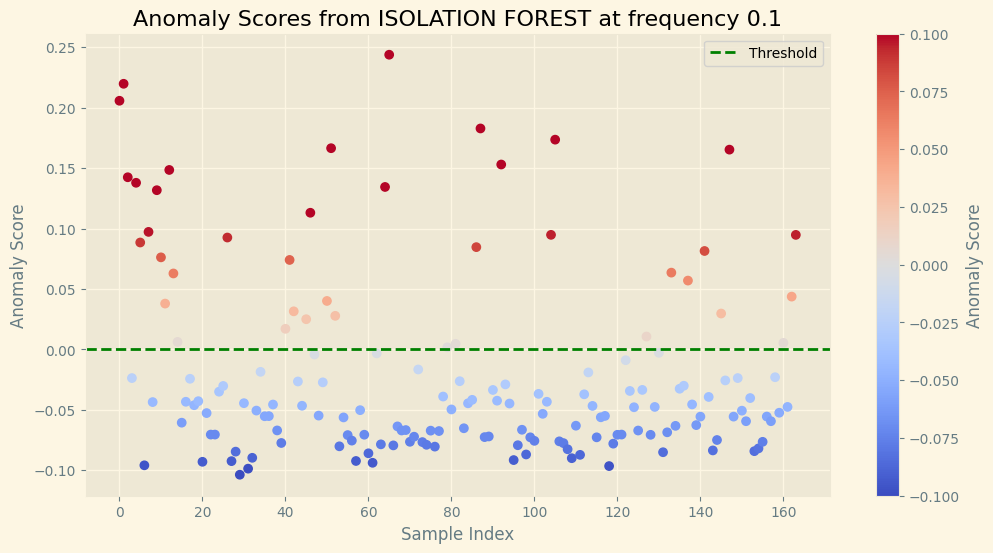

Number of anomalies detected: 39
Threshold: 0.0000
ROC AUC Score: 0.9424
F1 Score: 0.8108
Accuracy: 0.9146
Precision: 0.7692
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       129
           1       0.77      0.86      0.81        35

    accuracy                           0.91       164
   macro avg       0.86      0.89      0.88       164
weighted avg       0.92      0.91      0.92       164



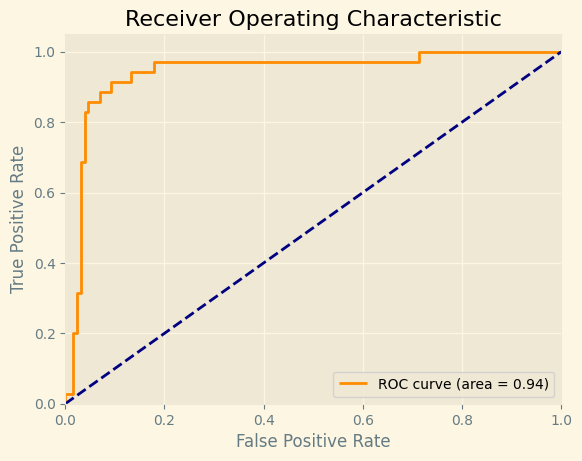

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
45


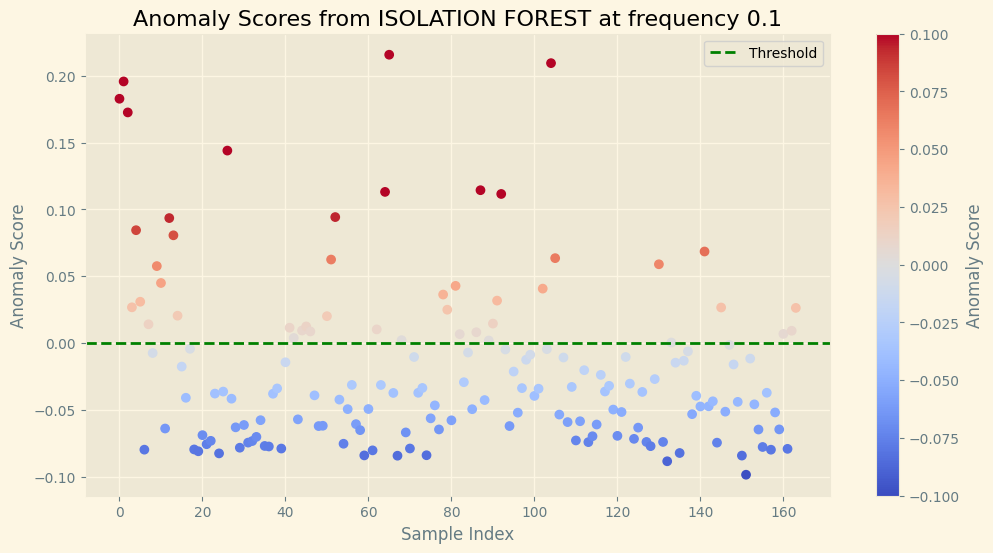

Number of anomalies detected: 45
Threshold: 0.0000
ROC AUC Score: 0.9183
F1 Score: 0.7000
Accuracy: 0.8537
Precision: 0.6222
Recall: 0.8000
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       129
           1       0.62      0.80      0.70        35

    accuracy                           0.85       164
   macro avg       0.78      0.83      0.80       164
weighted avg       0.87      0.85      0.86       164



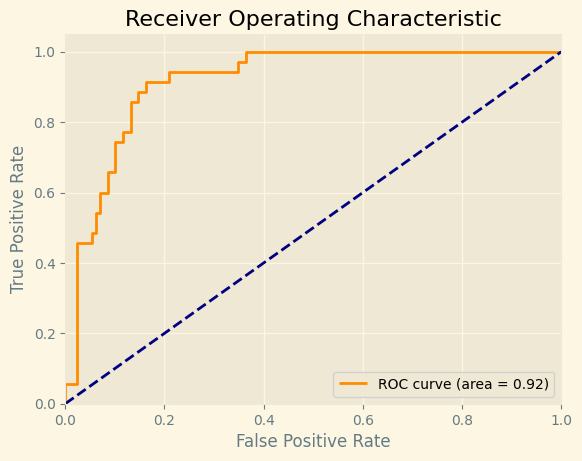

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=10)
63
IsolationForest(contamination=0.4, n_estimators=10)
82
IsolationForest(contamination=0.5, n_estimators=10)
98
IsolationForest(contamination=0.03, n_estimators=10)
3
IsolationForest(contamination=0.0475, n_estimators=10)
24


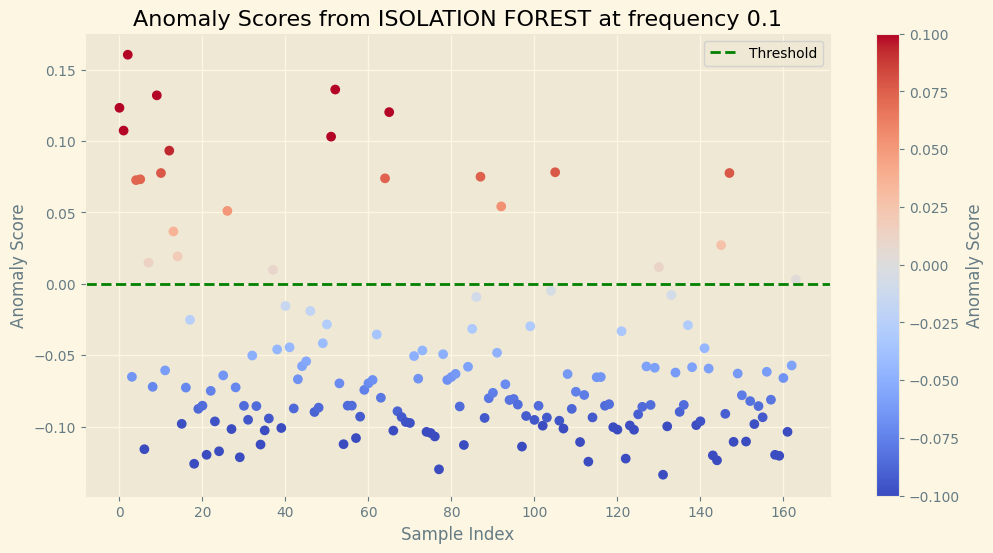

Number of anomalies detected: 24
Threshold: 0.0000
ROC AUC Score: 0.9391
F1 Score: 0.6441
Accuracy: 0.8720
Precision: 0.7917
Recall: 0.5429
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       129
           1       0.79      0.54      0.64        35

    accuracy                           0.87       164
   macro avg       0.84      0.75      0.78       164
weighted avg       0.87      0.87      0.86       164



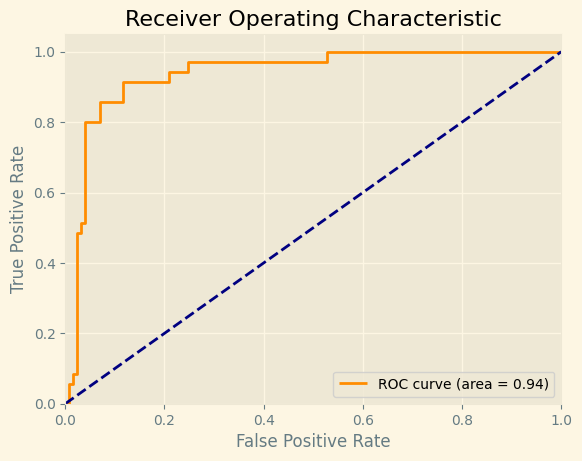

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=10)
24


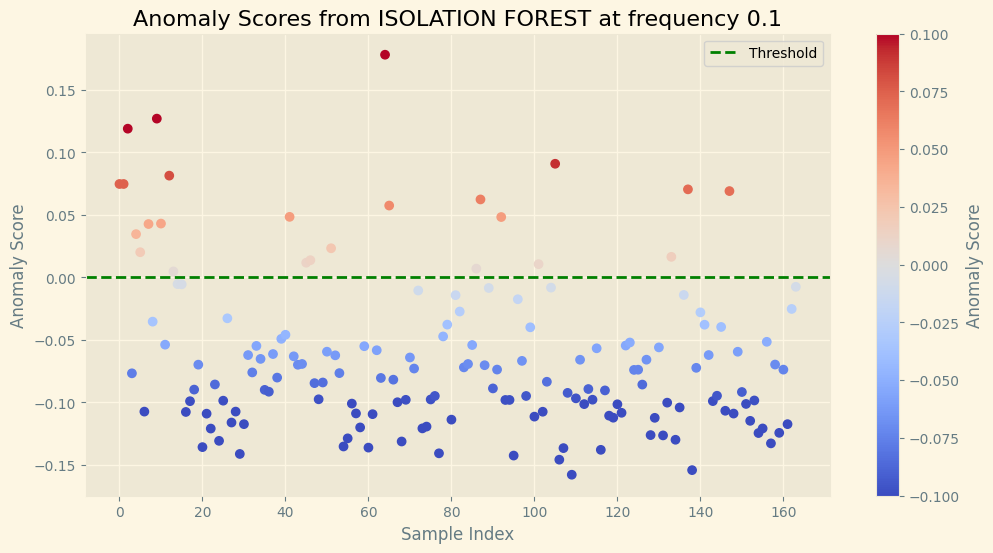

Number of anomalies detected: 24
Threshold: 0.0000
ROC AUC Score: 0.9070
F1 Score: 0.6441
Accuracy: 0.8720
Precision: 0.7917
Recall: 0.5429
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       129
           1       0.79      0.54      0.64        35

    accuracy                           0.87       164
   macro avg       0.84      0.75      0.78       164
weighted avg       0.87      0.87      0.86       164



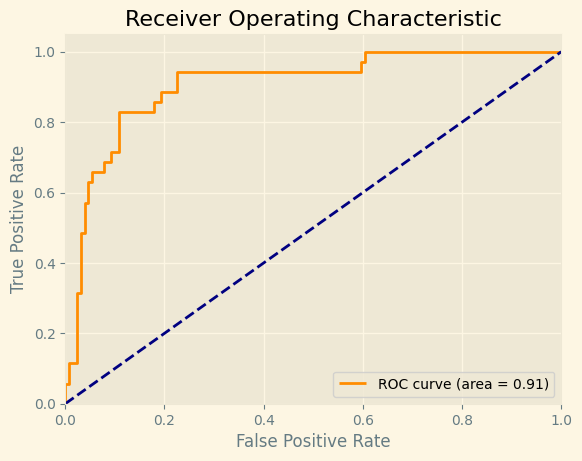

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
39


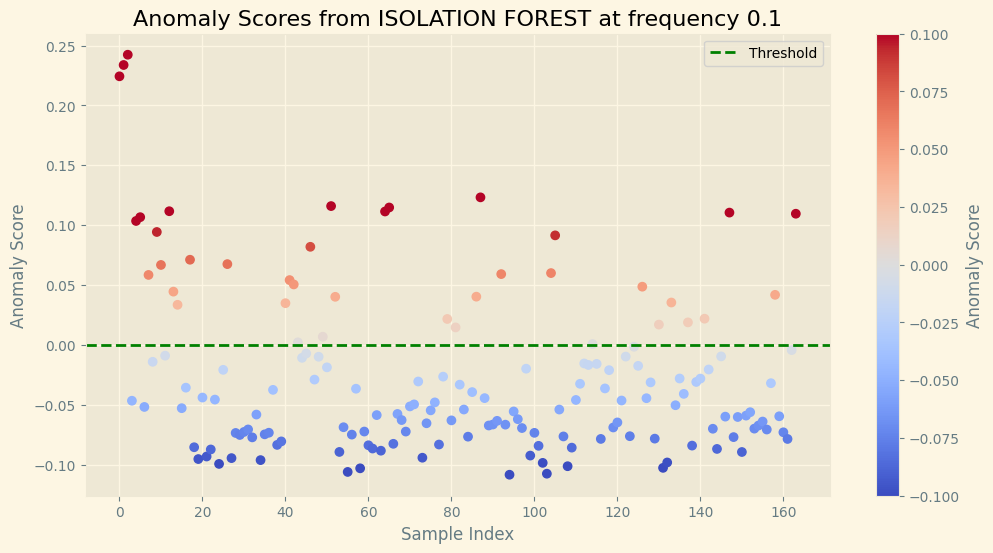

Number of anomalies detected: 39
Threshold: 0.0000
ROC AUC Score: 0.9251
F1 Score: 0.7568
Accuracy: 0.8902
Precision: 0.7179
Recall: 0.8000
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       129
           1       0.72      0.80      0.76        35

    accuracy                           0.89       164
   macro avg       0.83      0.86      0.84       164
weighted avg       0.90      0.89      0.89       164



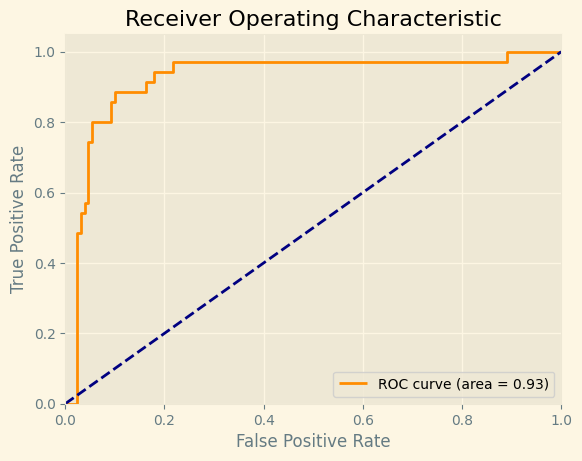

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
25


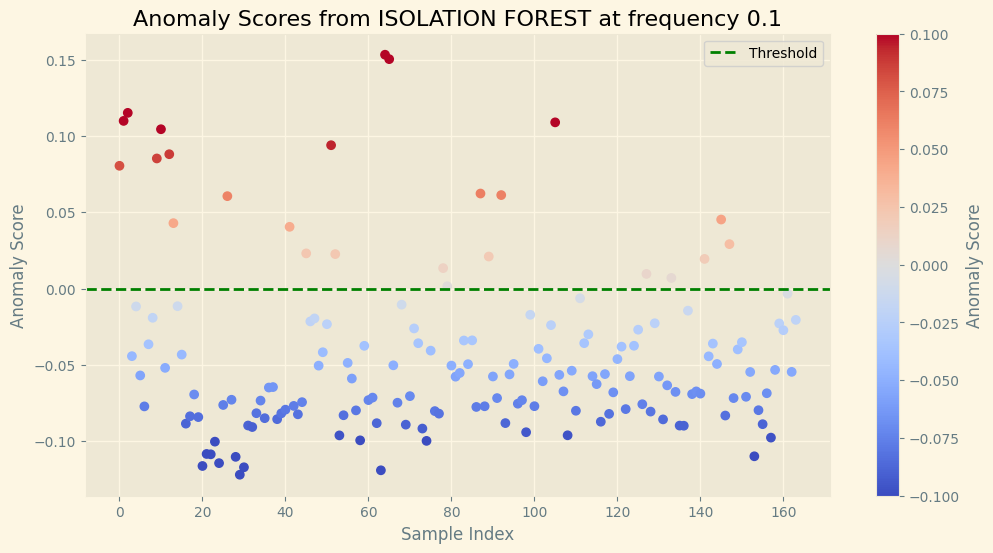

Number of anomalies detected: 25
Threshold: 0.0000
ROC AUC Score: 0.8350
F1 Score: 0.6000
Accuracy: 0.8537
Precision: 0.7200
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.88      0.95      0.91       129
           1       0.72      0.51      0.60        35

    accuracy                           0.85       164
   macro avg       0.80      0.73      0.76       164
weighted avg       0.84      0.85      0.84       164



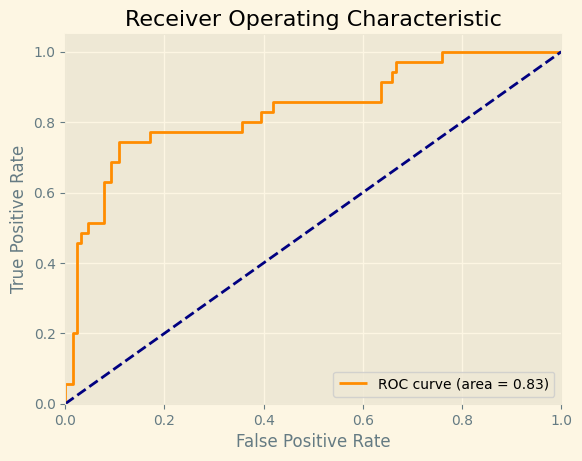

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327)
58


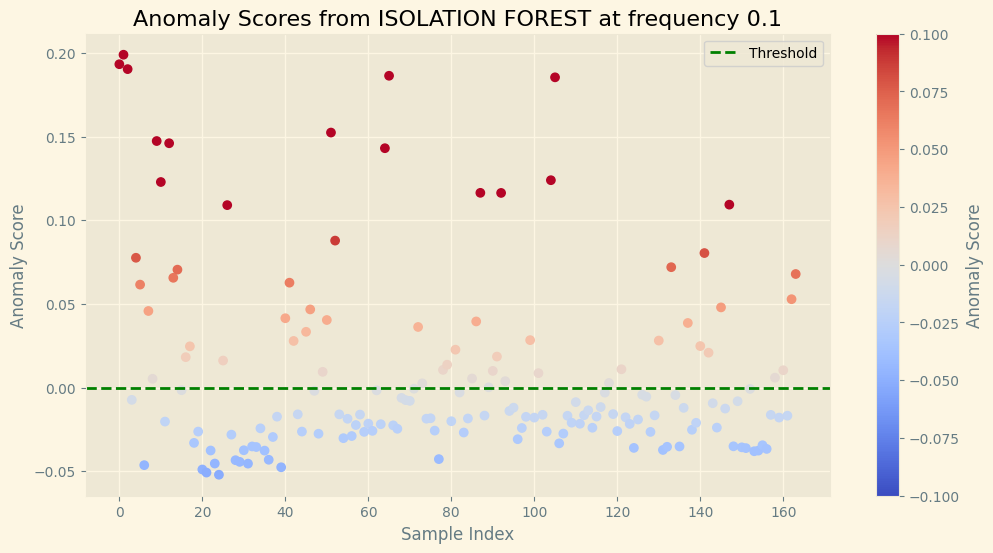

Number of anomalies detected: 58
Threshold: 0.0000
ROC AUC Score: 0.9730
F1 Score: 0.7527
Accuracy: 0.8598
Precision: 0.6034
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.82      0.90       129
           1       0.60      1.00      0.75        35

    accuracy                           0.86       164
   macro avg       0.80      0.91      0.83       164
weighted avg       0.92      0.86      0.87       164



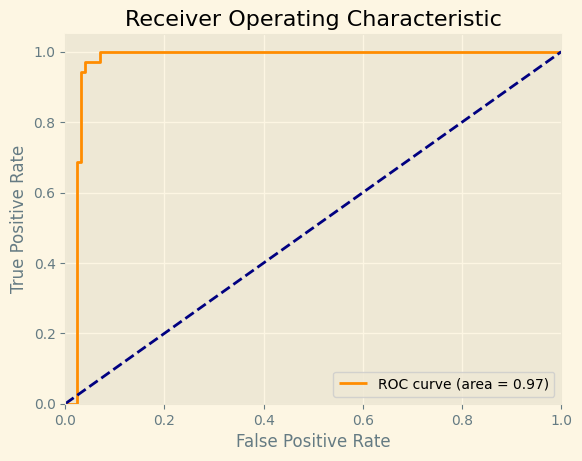

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
5
IsolationForest(contamination=0.05)
31


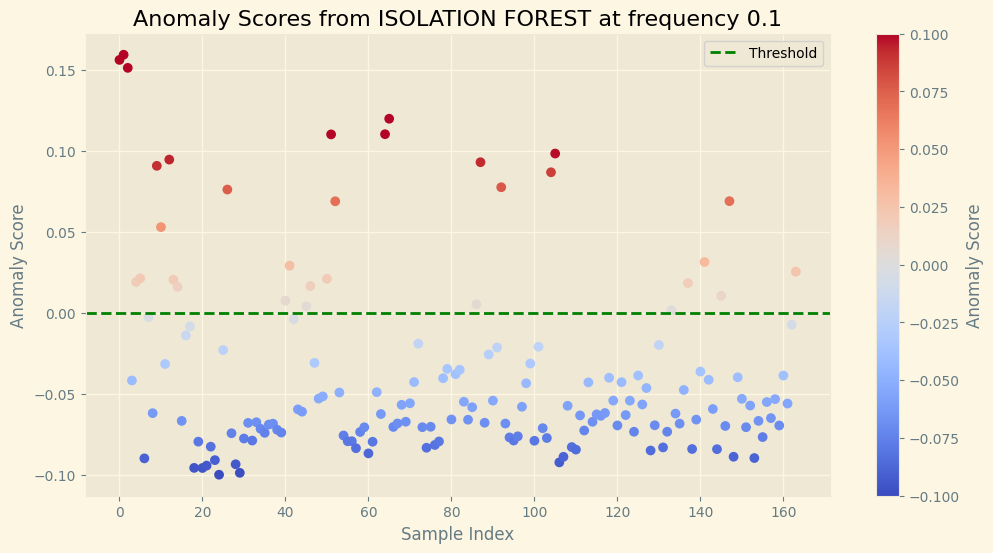

Number of anomalies detected: 31
Threshold: 0.0000
ROC AUC Score: 0.9730
F1 Score: 0.8485
Accuracy: 0.9390
Precision: 0.9032
Recall: 0.8000
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       129
           1       0.90      0.80      0.85        35

    accuracy                           0.94       164
   macro avg       0.93      0.89      0.91       164
weighted avg       0.94      0.94      0.94       164



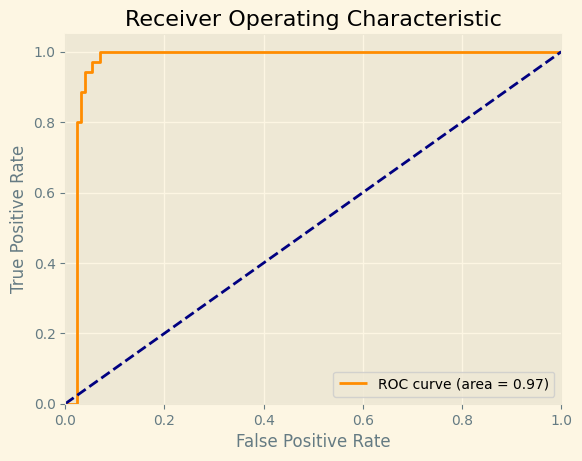

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
39


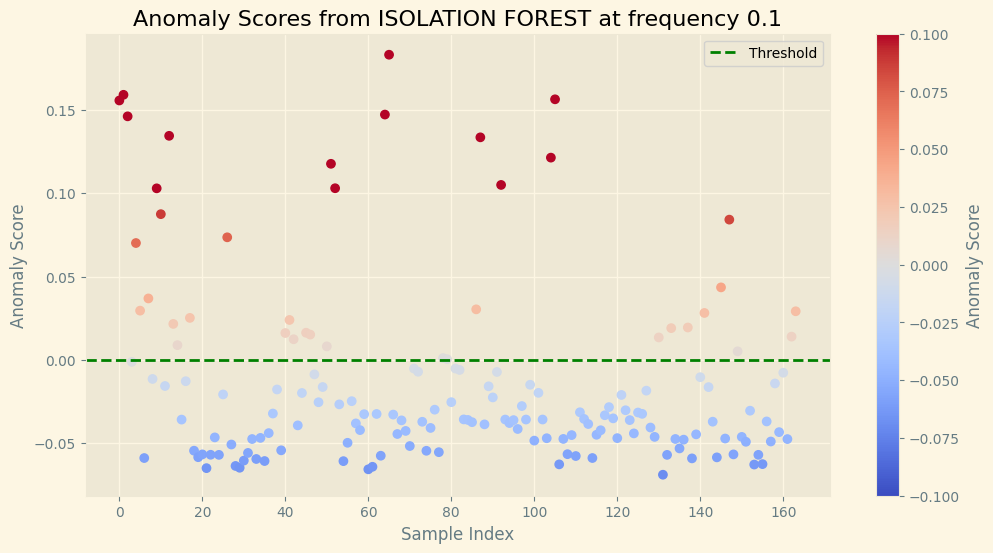

Number of anomalies detected: 39
Threshold: 0.0000
ROC AUC Score: 0.9641
F1 Score: 0.8649
Accuracy: 0.9390
Precision: 0.8205
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       129
           1       0.82      0.91      0.86        35

    accuracy                           0.94       164
   macro avg       0.90      0.93      0.91       164
weighted avg       0.94      0.94      0.94       164



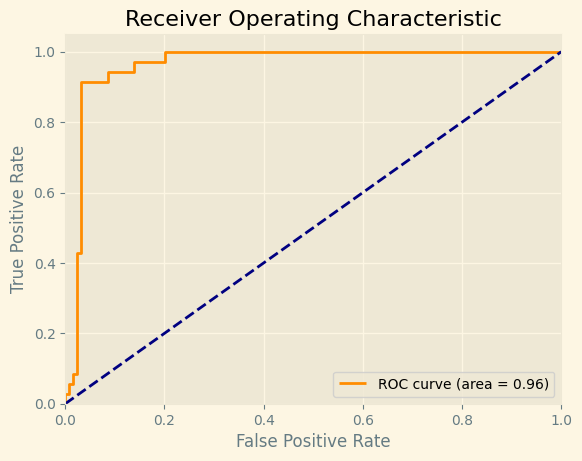

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
57


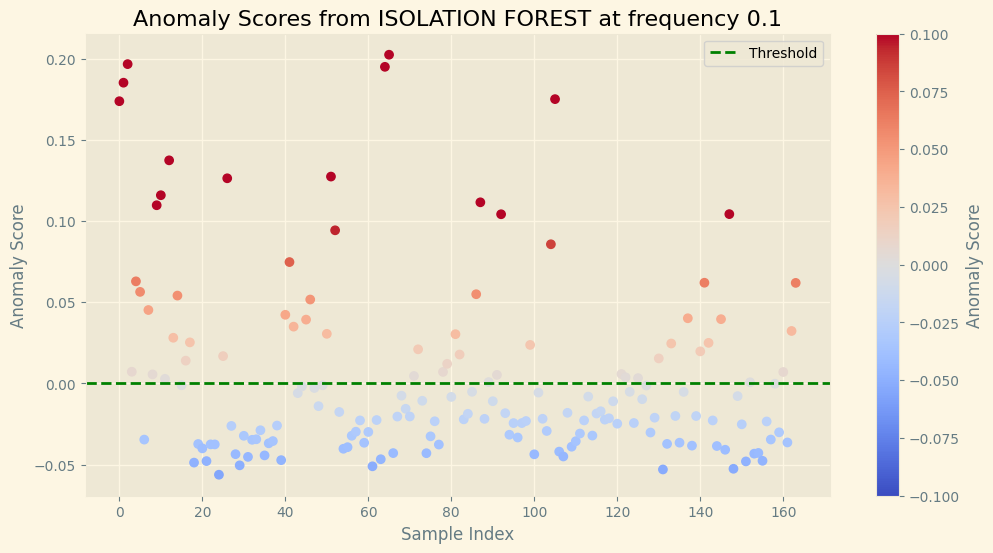

Number of anomalies detected: 57
Threshold: 0.0000
ROC AUC Score: 0.9714
F1 Score: 0.7609
Accuracy: 0.8659
Precision: 0.6140
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.83      0.91       129
           1       0.61      1.00      0.76        35

    accuracy                           0.87       164
   macro avg       0.81      0.91      0.83       164
weighted avg       0.92      0.87      0.88       164



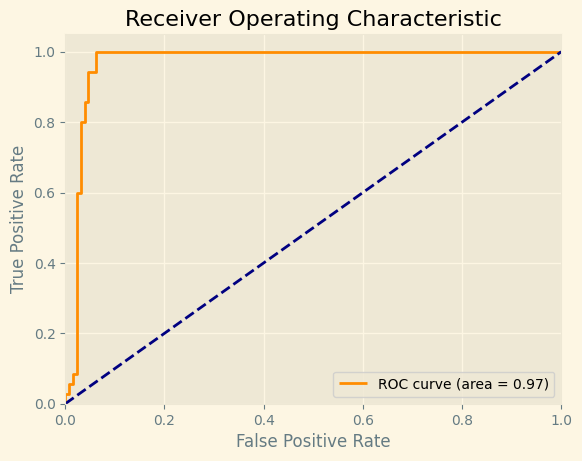

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3)
65
IsolationForest(contamination=0.4)
77
IsolationForest(contamination=0.5)
86
IsolationForest(contamination=0.03)
6
IsolationForest(contamination=0.0475)
35


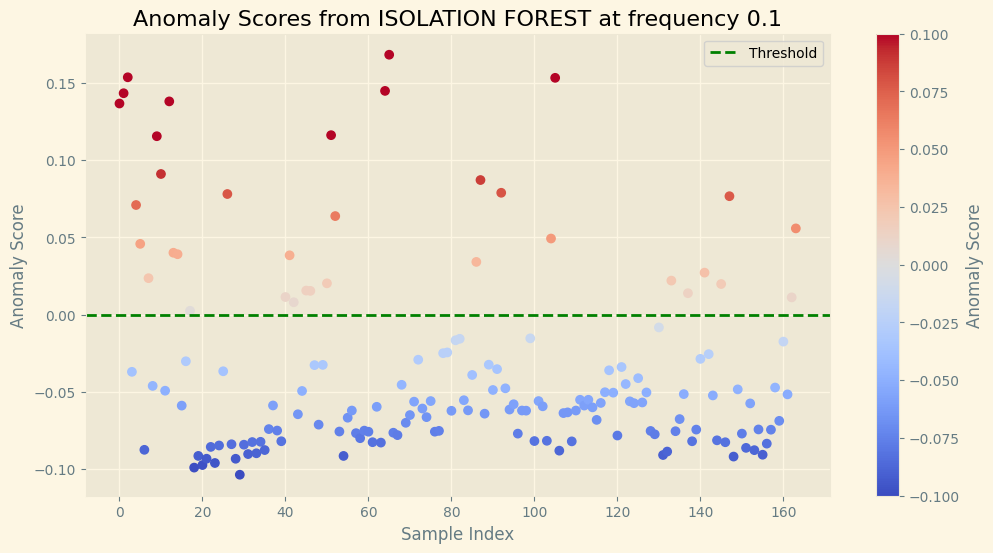

Number of anomalies detected: 35
Threshold: 0.0000
ROC AUC Score: 0.9708
F1 Score: 0.8857
Accuracy: 0.9512
Precision: 0.8857
Recall: 0.8857
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       129
           1       0.89      0.89      0.89        35

    accuracy                           0.95       164
   macro avg       0.93      0.93      0.93       164
weighted avg       0.95      0.95      0.95       164



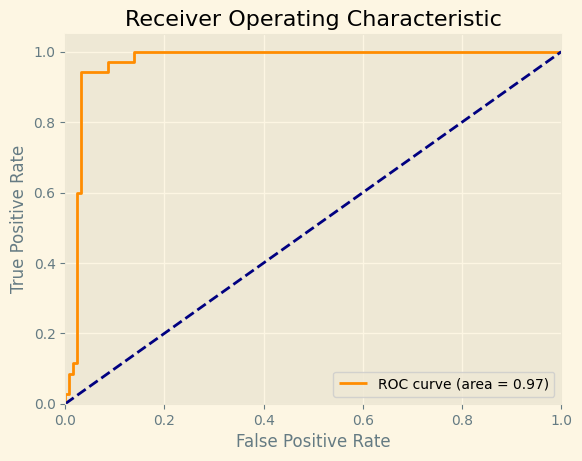

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
37


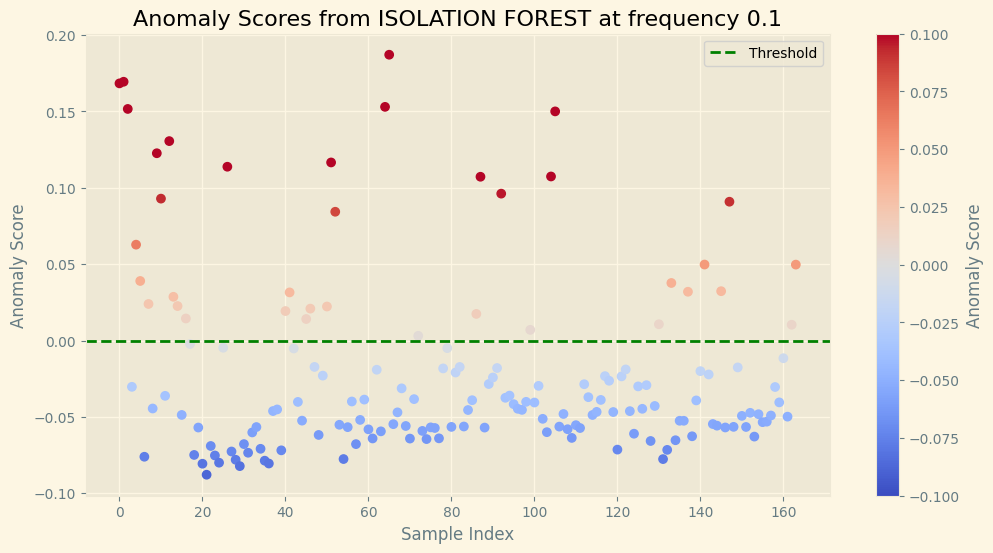

Number of anomalies detected: 37
Threshold: 0.0000
ROC AUC Score: 0.9728
F1 Score: 0.8889
Accuracy: 0.9512
Precision: 0.8649
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       129
           1       0.86      0.91      0.89        35

    accuracy                           0.95       164
   macro avg       0.92      0.94      0.93       164
weighted avg       0.95      0.95      0.95       164



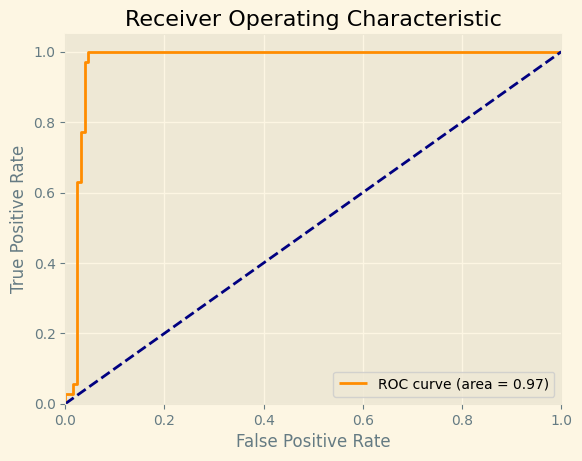

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
40


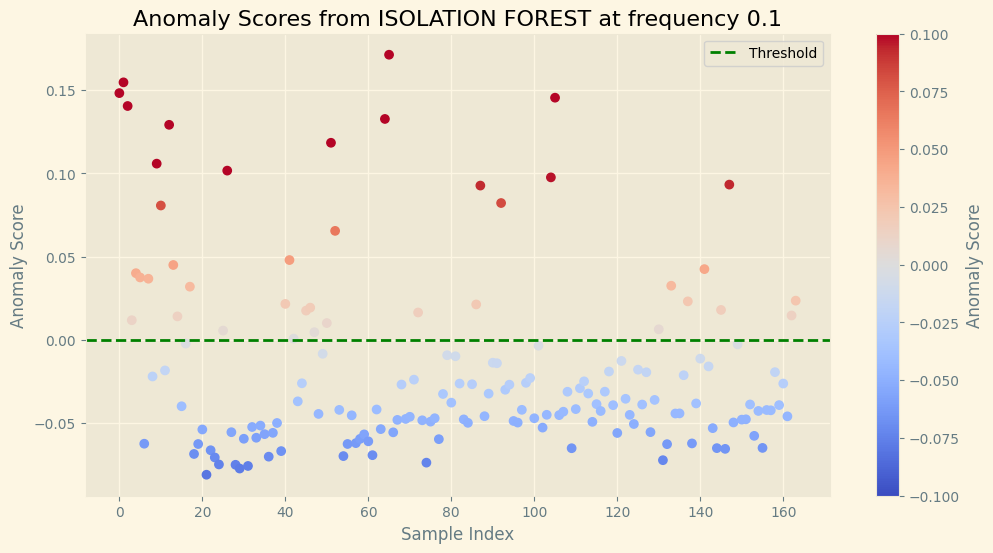

Number of anomalies detected: 40
Threshold: 0.0000
ROC AUC Score: 0.9683
F1 Score: 0.9067
Accuracy: 0.9573
Precision: 0.8500
Recall: 0.9714
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       129
           1       0.85      0.97      0.91        35

    accuracy                           0.96       164
   macro avg       0.92      0.96      0.94       164
weighted avg       0.96      0.96      0.96       164



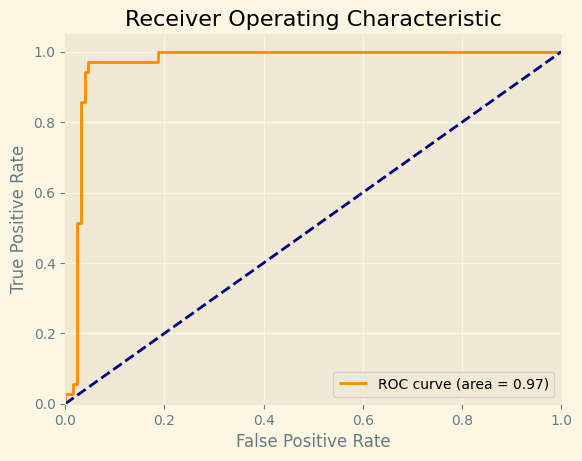

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
40


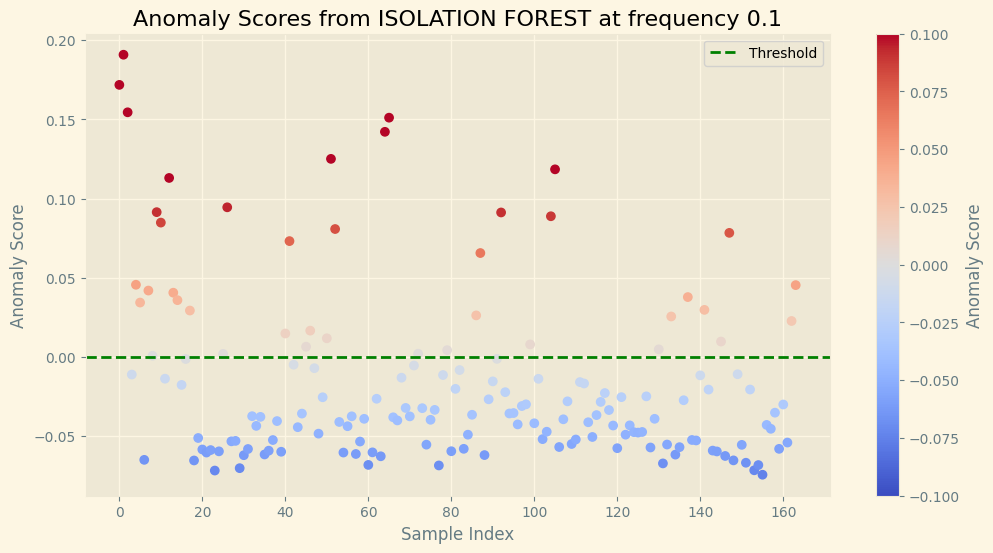

Number of anomalies detected: 40
Threshold: 0.0000
ROC AUC Score: 0.9712
F1 Score: 0.9067
Accuracy: 0.9573
Precision: 0.8500
Recall: 0.9714
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       129
           1       0.85      0.97      0.91        35

    accuracy                           0.96       164
   macro avg       0.92      0.96      0.94       164
weighted avg       0.96      0.96      0.96       164



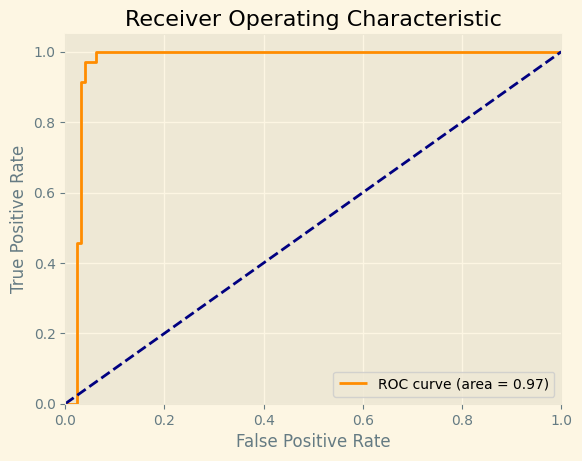

########################## ---------------------------------------- ##########################


In [22]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s_1):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = np.sum(anomaly_scores > 0)    
    print(f"{anomalies_detected}")
    if (anomalies_detected > 20 and anomalies_detected < 60):
        _ = plot_anomalies(anomaly_scores, freq, threshold, "ISOLATION FOREST")
        compute_metrics(anomaly_scores, y_test_collision_1, threshold)
        plot_roc_curve(y_test_collision_1.values, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

### Classifying collisions_5

IsolationForest(contamination=0.2973856209150327, n_estimators=1)
48


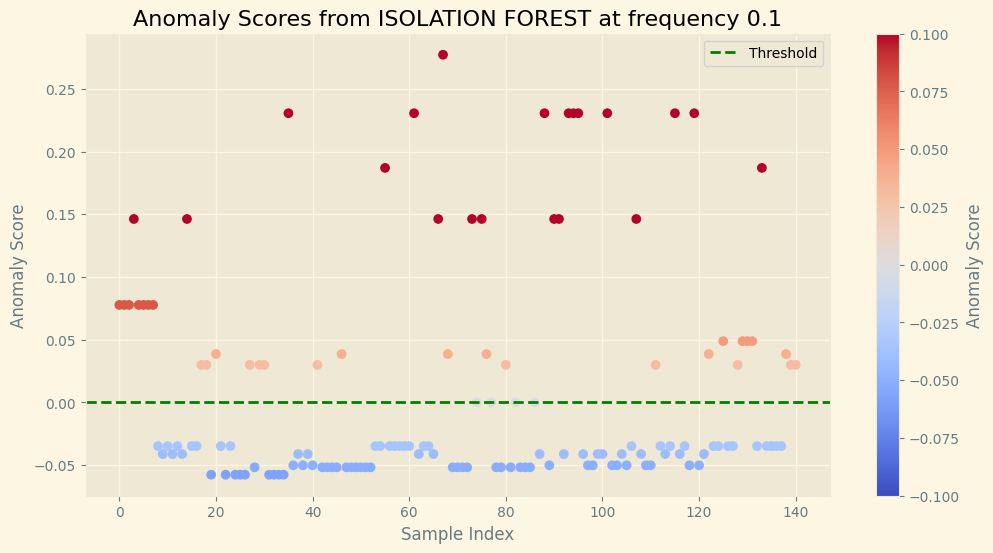

Number of anomalies detected: 48
Threshold: 0.0000
ROC AUC Score: 0.5332
F1 Score: 0.3846
Accuracy: 0.5461
Precision: 0.4167
Recall: 0.3571
              precision    recall  f1-score   support

           0       0.61      0.67      0.64        85
           1       0.42      0.36      0.38        56

    accuracy                           0.55       141
   macro avg       0.51      0.51      0.51       141
weighted avg       0.53      0.55      0.54       141



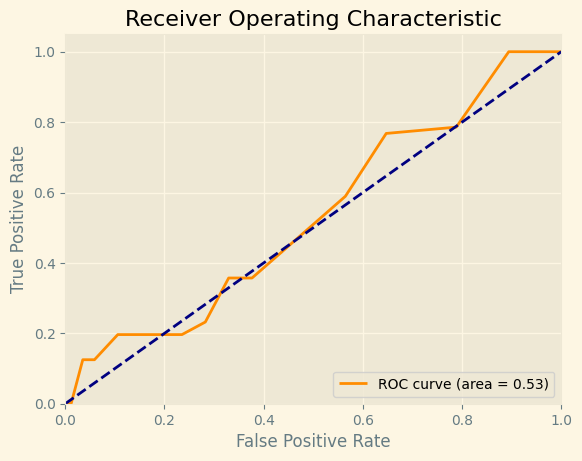

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
13
IsolationForest(contamination=0.05, n_estimators=1)
9
IsolationForest(contamination=0.1, n_estimators=1)
11
IsolationForest(contamination=0.2, n_estimators=1)
31
IsolationForest(contamination=0.3, n_estimators=1)
63


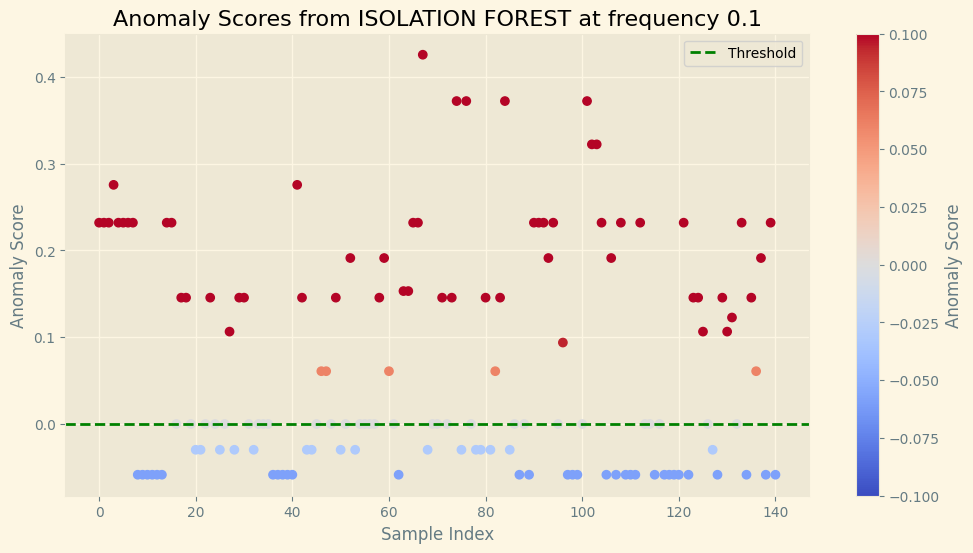

Number of anomalies detected: 63
Threshold: 0.0000
ROC AUC Score: 0.6544
F1 Score: 0.5378
Accuracy: 0.6099
Precision: 0.5079
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.69      0.64      0.66        85
           1       0.51      0.57      0.54        56

    accuracy                           0.61       141
   macro avg       0.60      0.60      0.60       141
weighted avg       0.62      0.61      0.61       141



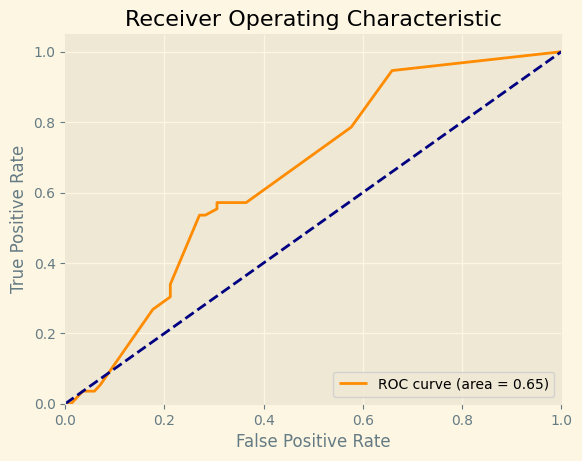

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=1)
45


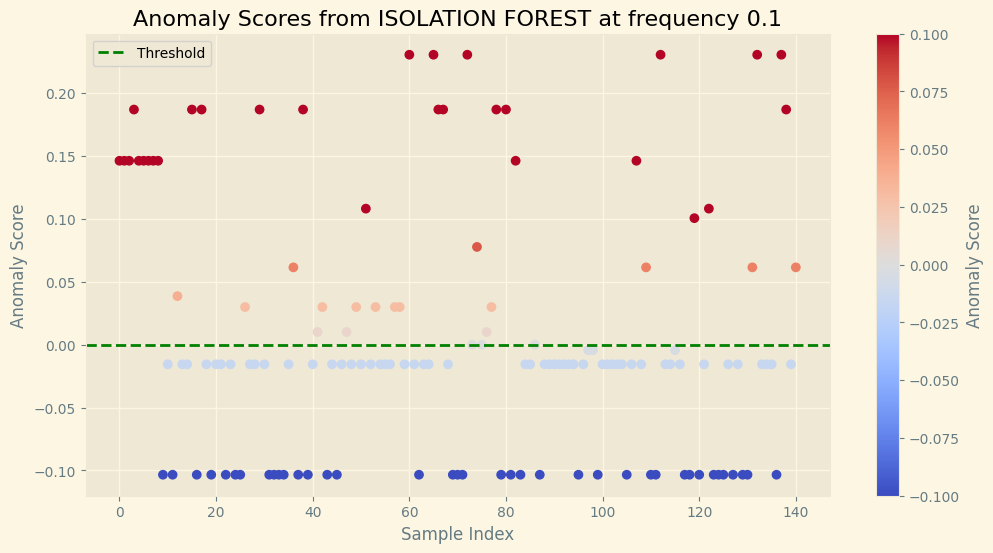

Number of anomalies detected: 45
Threshold: 0.0000
ROC AUC Score: 0.5252
F1 Score: 0.2970
Accuracy: 0.4965
Precision: 0.3333
Recall: 0.2679
              precision    recall  f1-score   support

           0       0.57      0.65      0.61        85
           1       0.33      0.27      0.30        56

    accuracy                           0.50       141
   macro avg       0.45      0.46      0.45       141
weighted avg       0.48      0.50      0.48       141



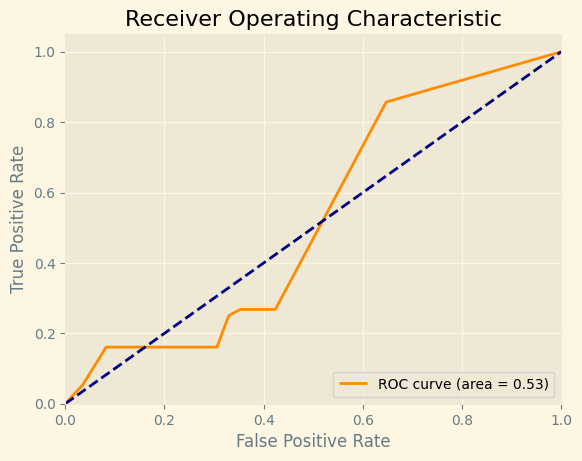

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=1)
52


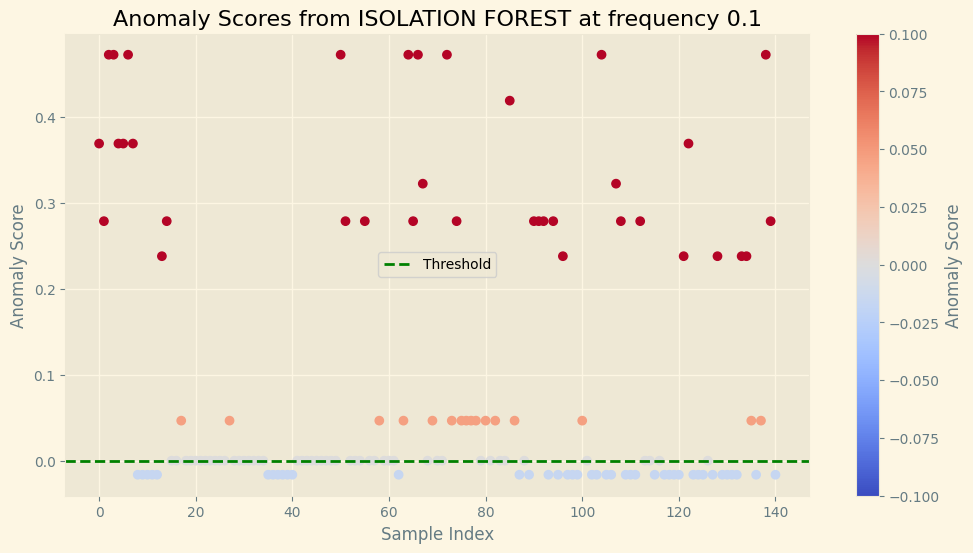

Number of anomalies detected: 52
Threshold: 0.0000
ROC AUC Score: 0.5950
F1 Score: 0.3889
Accuracy: 0.5319
Precision: 0.4038
Recall: 0.3750
              precision    recall  f1-score   support

           0       0.61      0.64      0.62        85
           1       0.40      0.38      0.39        56

    accuracy                           0.53       141
   macro avg       0.51      0.51      0.50       141
weighted avg       0.53      0.53      0.53       141



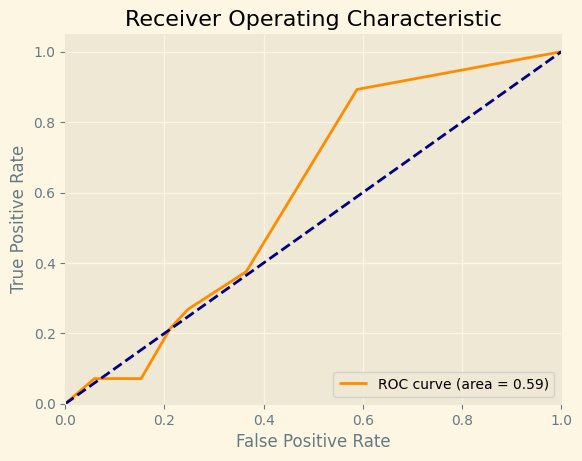

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.03, n_estimators=1)
1
IsolationForest(contamination=0.0475, n_estimators=1)
17
IsolationForest(contamination=0.065, n_estimators=1)
41


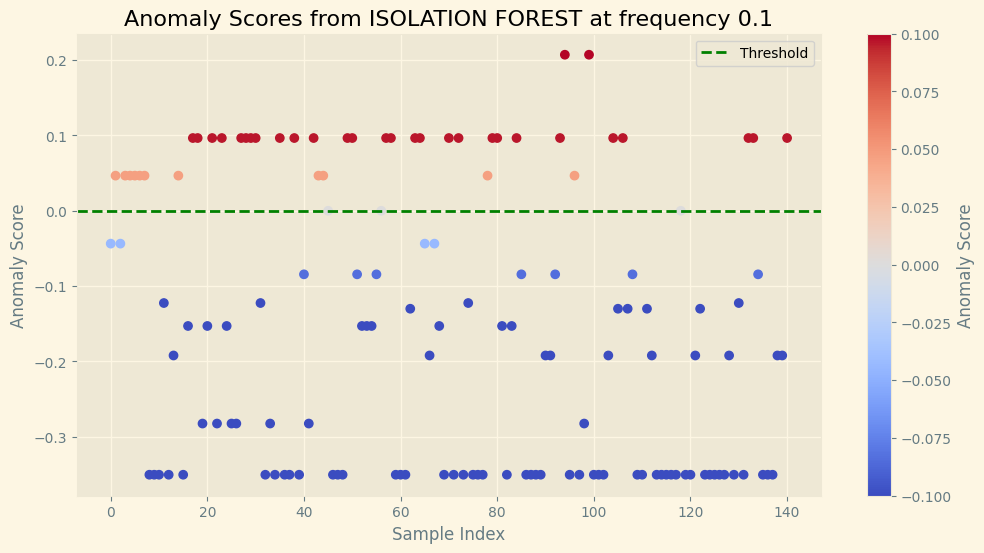

Number of anomalies detected: 41
Threshold: 0.0000
ROC AUC Score: 0.7176
F1 Score: 0.5979
Accuracy: 0.7234
Precision: 0.7073
Recall: 0.5179
              precision    recall  f1-score   support

           0       0.73      0.86      0.79        85
           1       0.71      0.52      0.60        56

    accuracy                           0.72       141
   macro avg       0.72      0.69      0.69       141
weighted avg       0.72      0.72      0.71       141



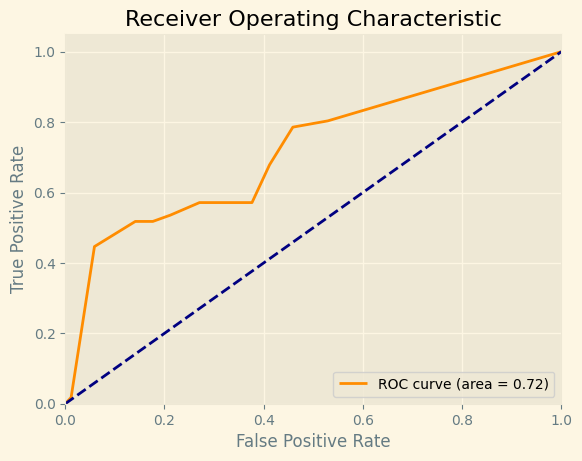

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=1)
15
IsolationForest(contamination=0.1, n_estimators=1)
78


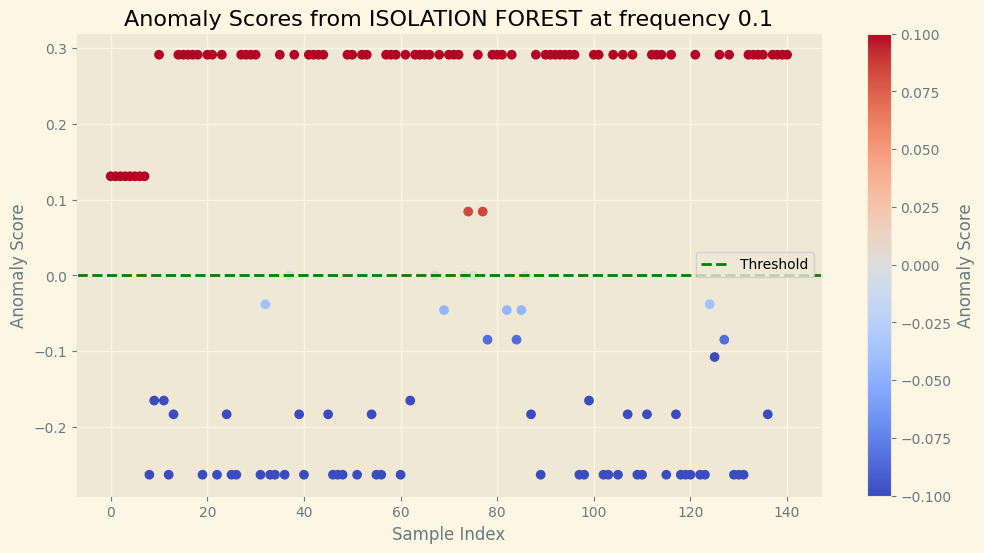

Number of anomalies detected: 78
Threshold: 0.0000
ROC AUC Score: 0.9037
F1 Score: 0.8060
Accuracy: 0.8156
Precision: 0.6923
Recall: 0.9643
              precision    recall  f1-score   support

           0       0.97      0.72      0.82        85
           1       0.69      0.96      0.81        56

    accuracy                           0.82       141
   macro avg       0.83      0.84      0.82       141
weighted avg       0.86      0.82      0.82       141



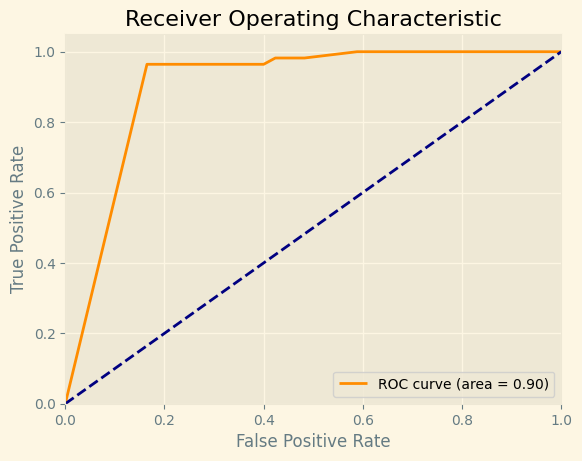

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=2)
70


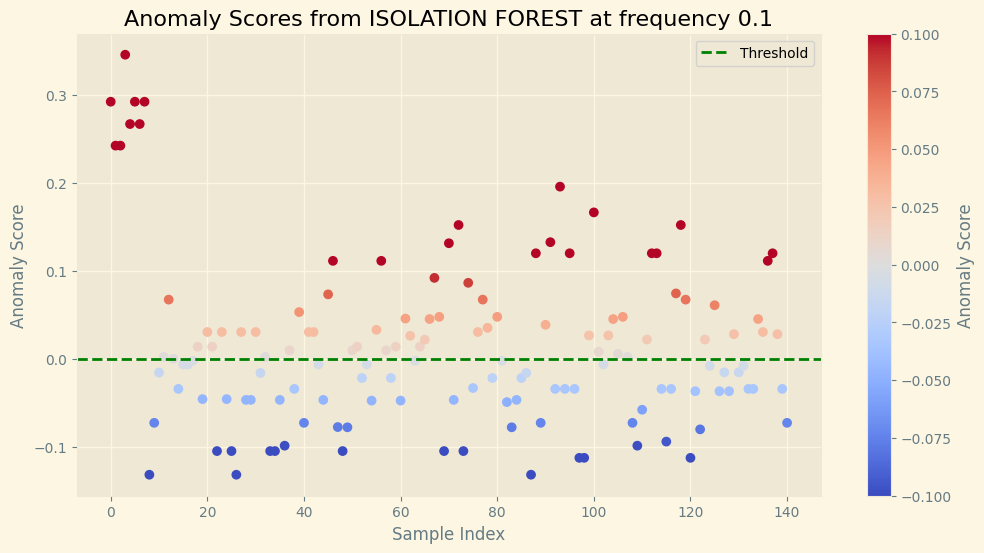

Number of anomalies detected: 70
Threshold: 0.0000
ROC AUC Score: 0.5631
F1 Score: 0.4444
Accuracy: 0.5035
Precision: 0.4000
Recall: 0.5000
              precision    recall  f1-score   support

           0       0.61      0.51      0.55        85
           1       0.40      0.50      0.44        56

    accuracy                           0.50       141
   macro avg       0.50      0.50      0.50       141
weighted avg       0.52      0.50      0.51       141



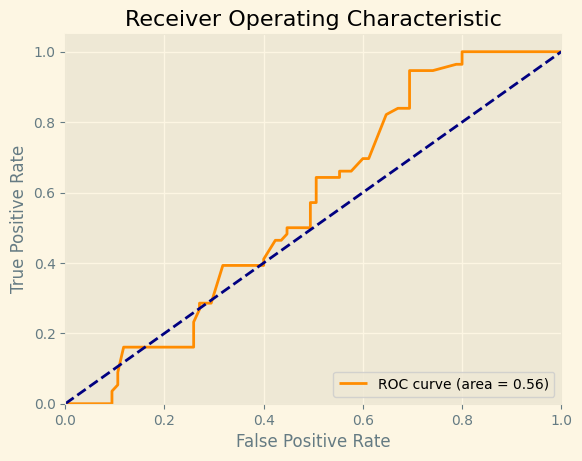

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
43


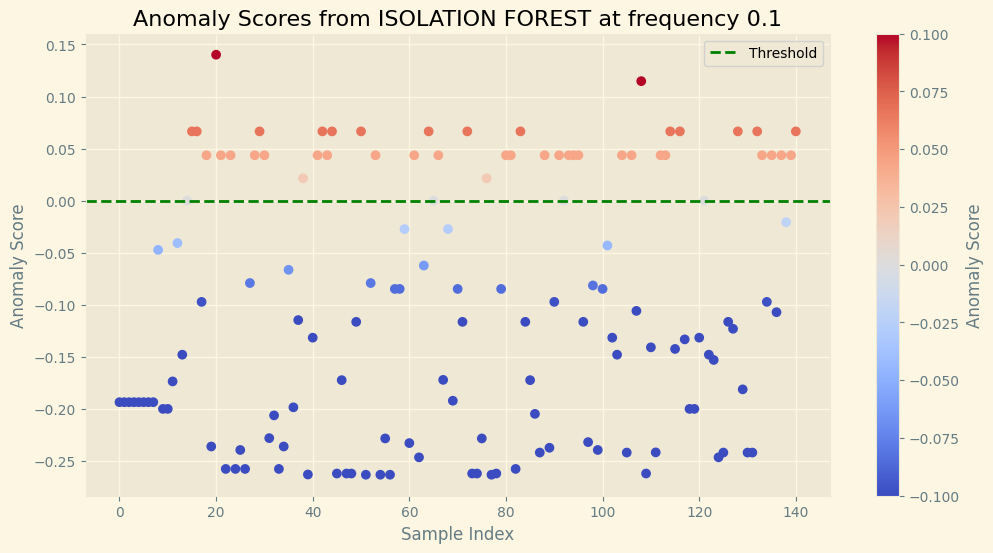

Number of anomalies detected: 43
Threshold: 0.0000
ROC AUC Score: 0.8926
F1 Score: 0.6869
Accuracy: 0.7801
Precision: 0.7907
Recall: 0.6071
              precision    recall  f1-score   support

           0       0.78      0.89      0.83        85
           1       0.79      0.61      0.69        56

    accuracy                           0.78       141
   macro avg       0.78      0.75      0.76       141
weighted avg       0.78      0.78      0.77       141



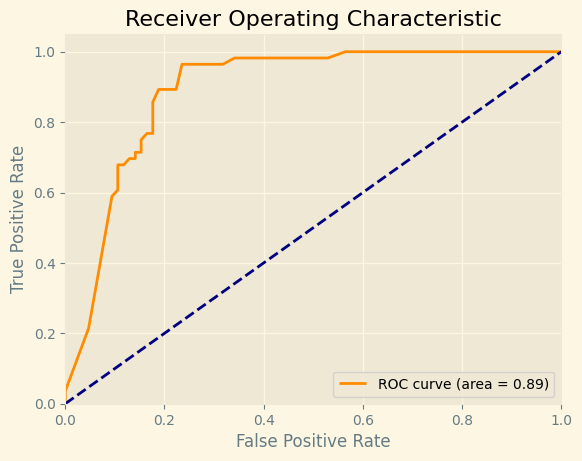

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.05, n_estimators=2)
26
IsolationForest(contamination=0.1, n_estimators=2)
60


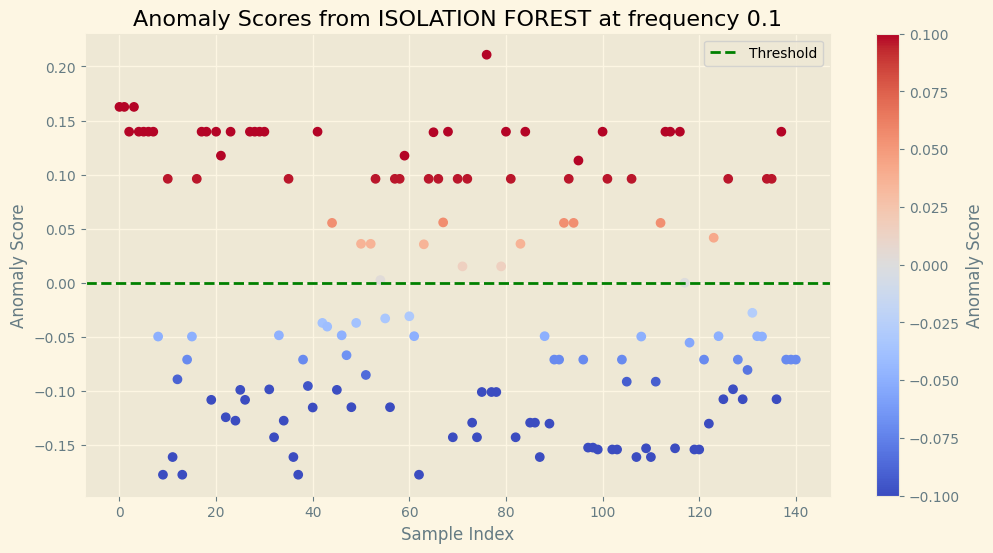

Number of anomalies detected: 60
Threshold: 0.0000
ROC AUC Score: 0.8023
F1 Score: 0.7069
Accuracy: 0.7589
Precision: 0.6833
Recall: 0.7321
              precision    recall  f1-score   support

           0       0.81      0.78      0.80        85
           1       0.68      0.73      0.71        56

    accuracy                           0.76       141
   macro avg       0.75      0.75      0.75       141
weighted avg       0.76      0.76      0.76       141



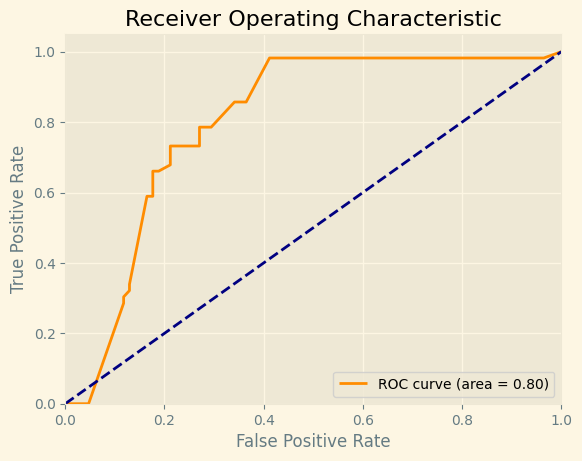

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=2)
32
IsolationForest(contamination=0.3, n_estimators=2)
63


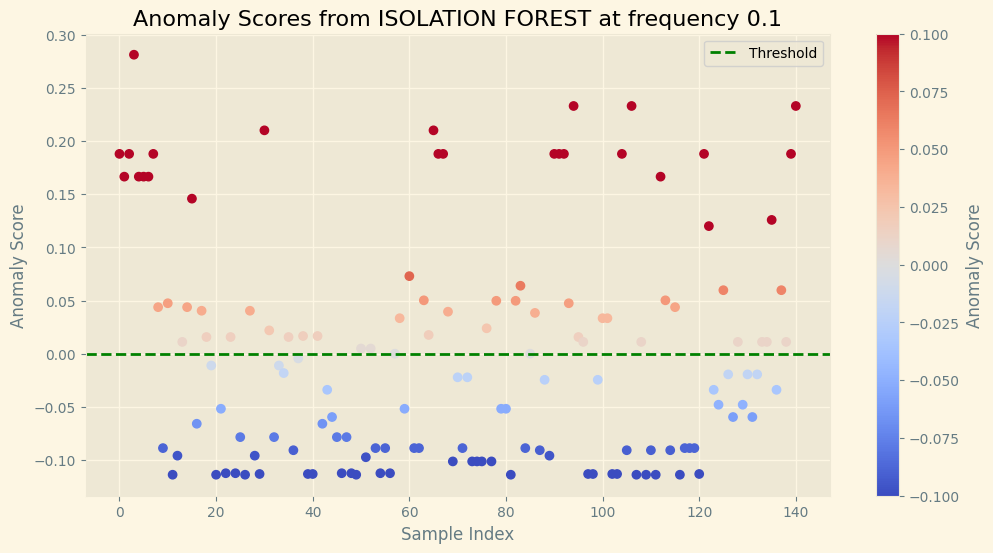

Number of anomalies detected: 63
Threshold: 0.0000
ROC AUC Score: 0.6456
F1 Score: 0.5714
Accuracy: 0.6383
Precision: 0.5397
Recall: 0.6071
              precision    recall  f1-score   support

           0       0.72      0.66      0.69        85
           1       0.54      0.61      0.57        56

    accuracy                           0.64       141
   macro avg       0.63      0.63      0.63       141
weighted avg       0.65      0.64      0.64       141



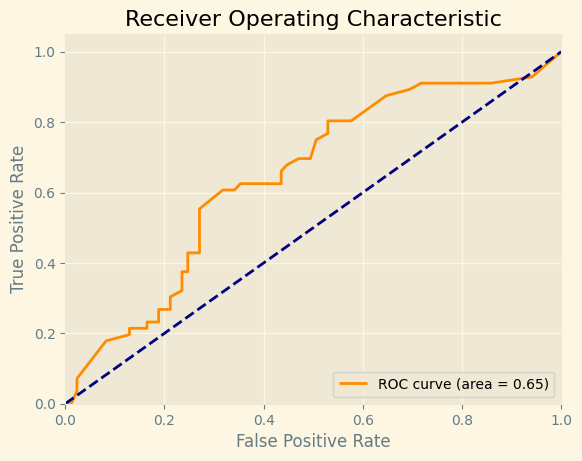

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=2)
77


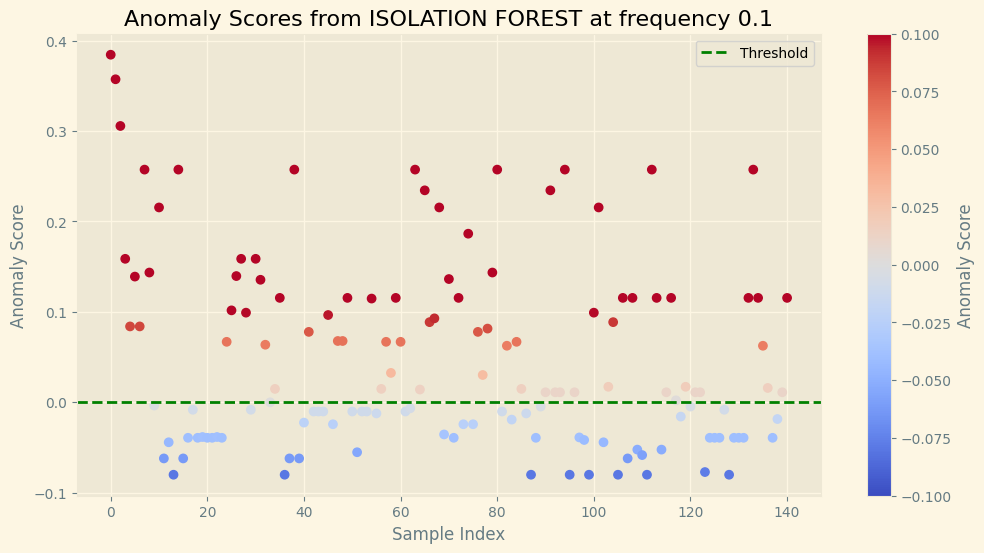

Number of anomalies detected: 77
Threshold: 0.0000
ROC AUC Score: 0.6274
F1 Score: 0.5414
Accuracy: 0.5674
Precision: 0.4675
Recall: 0.6429
              precision    recall  f1-score   support

           0       0.69      0.52      0.59        85
           1       0.47      0.64      0.54        56

    accuracy                           0.57       141
   macro avg       0.58      0.58      0.57       141
weighted avg       0.60      0.57      0.57       141



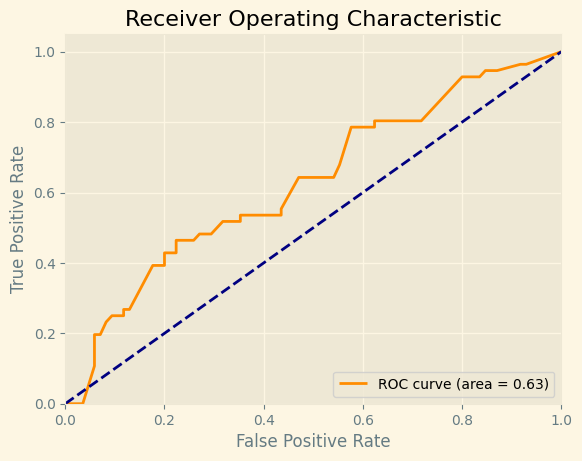

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=2)
84
IsolationForest(contamination=0.03, n_estimators=2)
40
IsolationForest(contamination=0.0475, n_estimators=2)
16
IsolationForest(contamination=0.065, n_estimators=2)
58


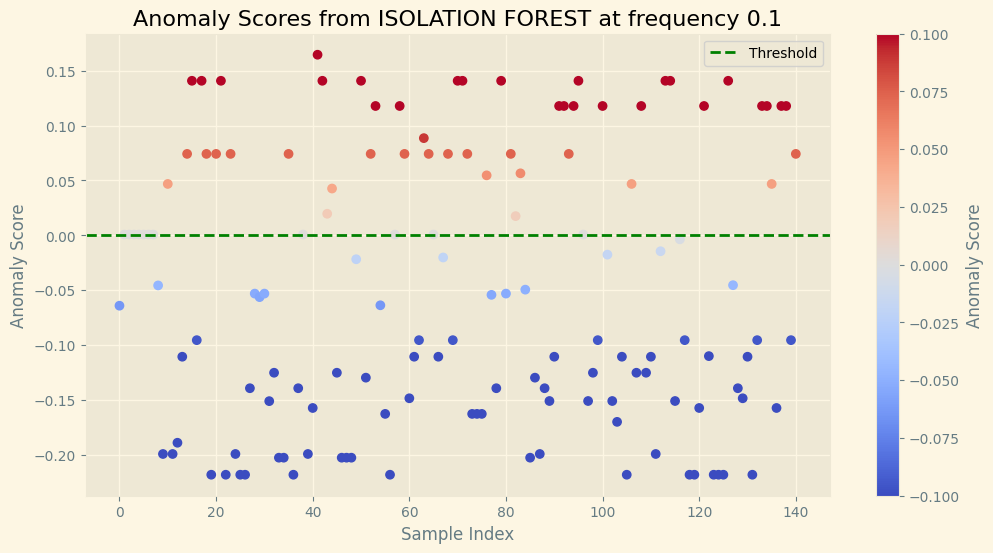

Number of anomalies detected: 58
Threshold: 0.0000
ROC AUC Score: 0.8523
F1 Score: 0.6842
Accuracy: 0.7447
Precision: 0.6724
Recall: 0.6964
              precision    recall  f1-score   support

           0       0.80      0.78      0.79        85
           1       0.67      0.70      0.68        56

    accuracy                           0.74       141
   macro avg       0.73      0.74      0.73       141
weighted avg       0.75      0.74      0.75       141



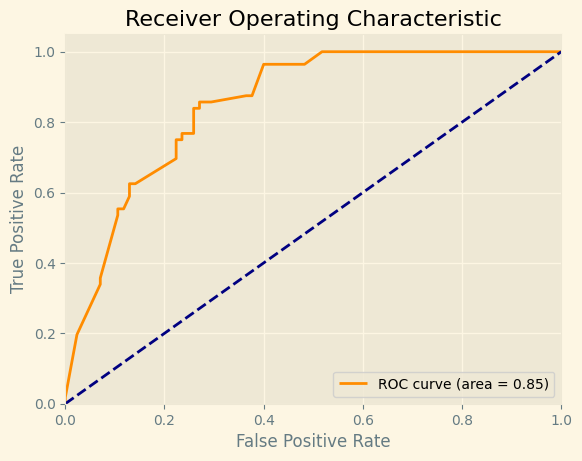

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=2)
47


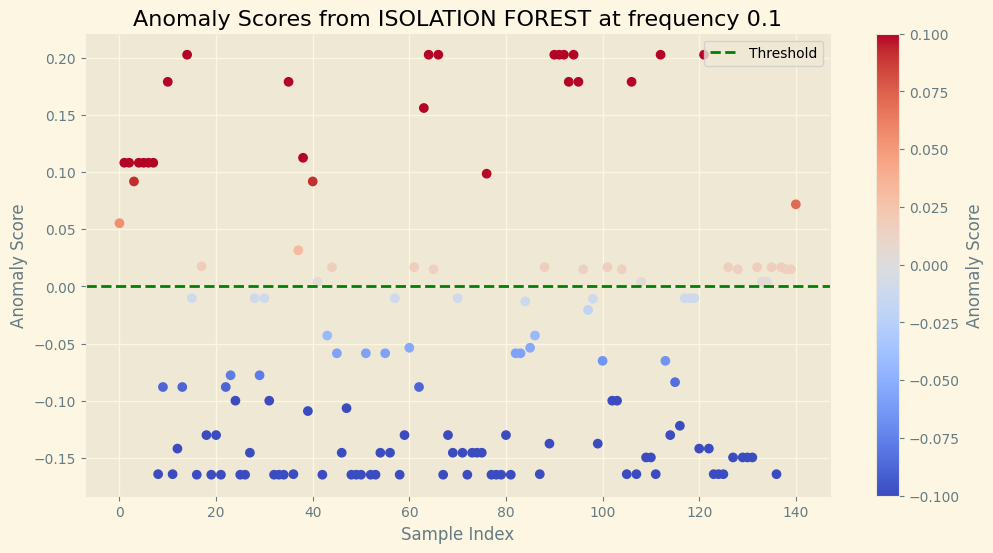

Number of anomalies detected: 47
Threshold: 0.0000
ROC AUC Score: 0.6647
F1 Score: 0.5049
Accuracy: 0.6383
Precision: 0.5532
Recall: 0.4643
              precision    recall  f1-score   support

           0       0.68      0.75      0.72        85
           1       0.55      0.46      0.50        56

    accuracy                           0.64       141
   macro avg       0.62      0.61      0.61       141
weighted avg       0.63      0.64      0.63       141



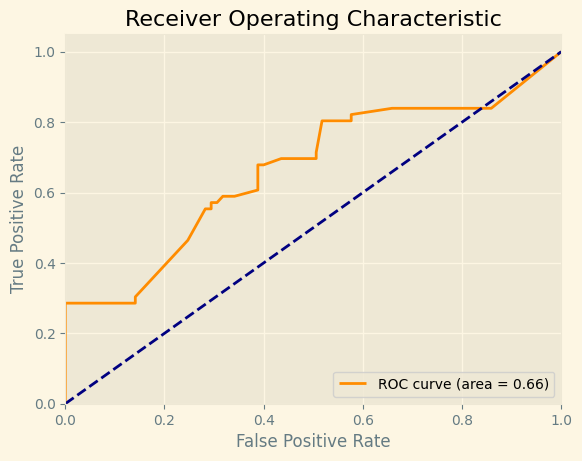

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=2)
39
IsolationForest(contamination=0.2973856209150327, n_estimators=3)
100
IsolationForest(contamination=0.005, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
7
IsolationForest(contamination=0.03, n_estimators=3)
9
IsolationForest(contamination=0.05, n_estimators=3)
18
IsolationForest(contamination=0.1, n_estimators=3)
60


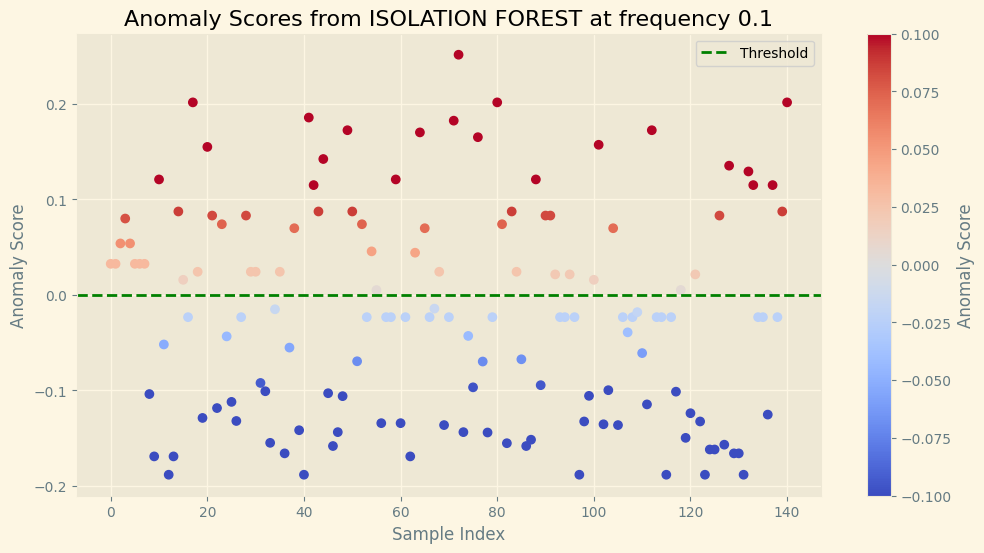

Number of anomalies detected: 60
Threshold: 0.0000
ROC AUC Score: 0.8085
F1 Score: 0.6552
Accuracy: 0.7163
Precision: 0.6333
Recall: 0.6786
              precision    recall  f1-score   support

           0       0.78      0.74      0.76        85
           1       0.63      0.68      0.66        56

    accuracy                           0.72       141
   macro avg       0.71      0.71      0.71       141
weighted avg       0.72      0.72      0.72       141



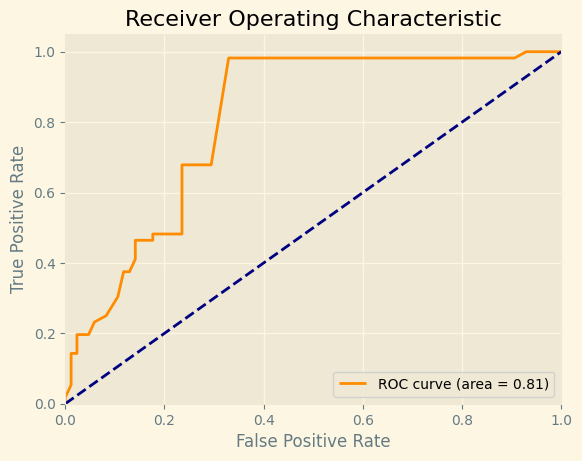

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
85
IsolationForest(contamination=0.3, n_estimators=3)
85
IsolationForest(contamination=0.4, n_estimators=3)
99
IsolationForest(contamination=0.5, n_estimators=3)
104
IsolationForest(contamination=0.03, n_estimators=3)
9
IsolationForest(contamination=0.0475, n_estimators=3)
11
IsolationForest(contamination=0.065, n_estimators=3)
68


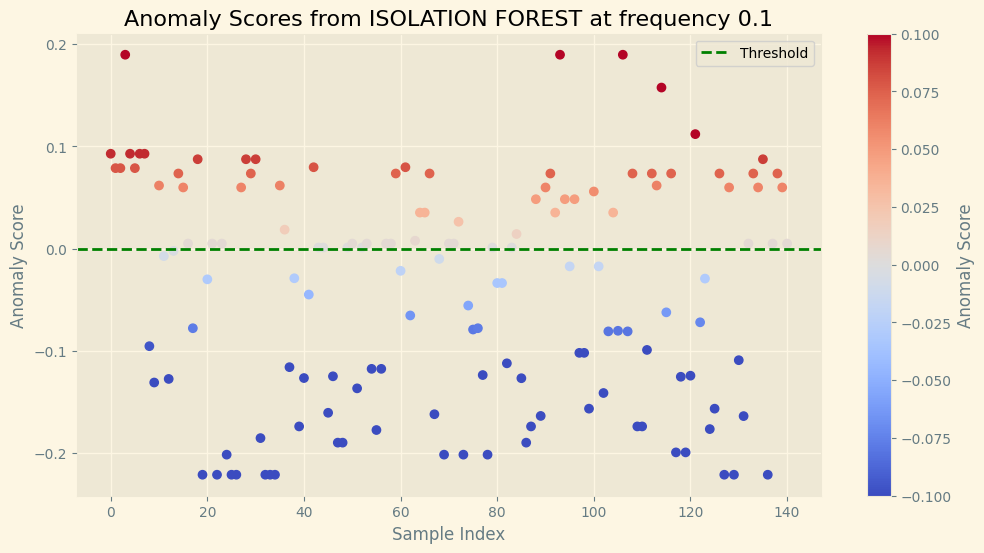

Number of anomalies detected: 68
Threshold: 0.0000
ROC AUC Score: 0.8166
F1 Score: 0.7419
Accuracy: 0.7730
Precision: 0.6765
Recall: 0.8214
              precision    recall  f1-score   support

           0       0.86      0.74      0.80        85
           1       0.68      0.82      0.74        56

    accuracy                           0.77       141
   macro avg       0.77      0.78      0.77       141
weighted avg       0.79      0.77      0.78       141



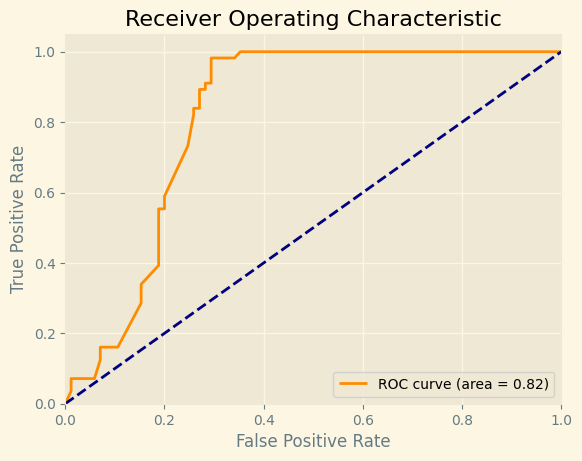

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=3)
52


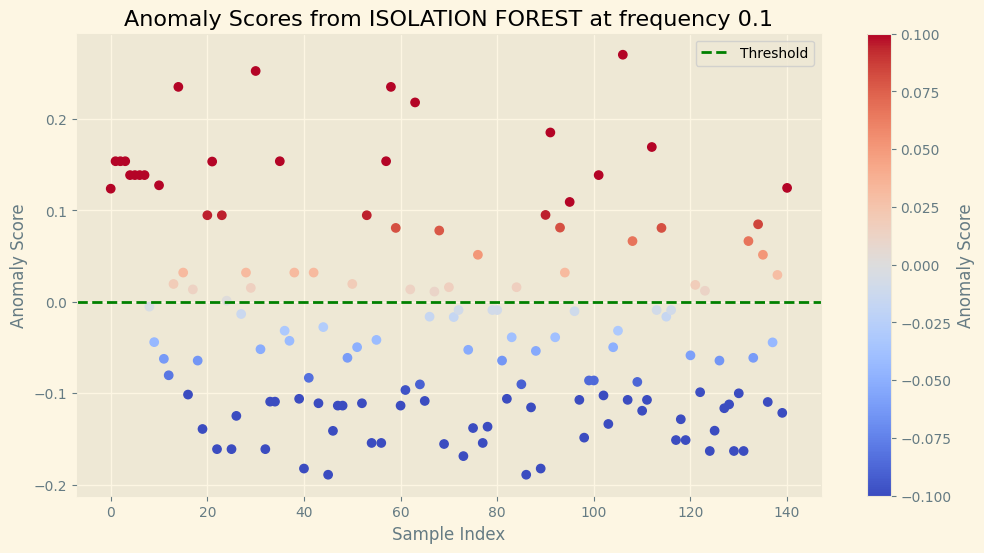

Number of anomalies detected: 52
Threshold: 0.0000
ROC AUC Score: 0.7935
F1 Score: 0.5926
Accuracy: 0.6879
Precision: 0.6154
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.73      0.76      0.75        85
           1       0.62      0.57      0.59        56

    accuracy                           0.69       141
   macro avg       0.67      0.67      0.67       141
weighted avg       0.68      0.69      0.69       141



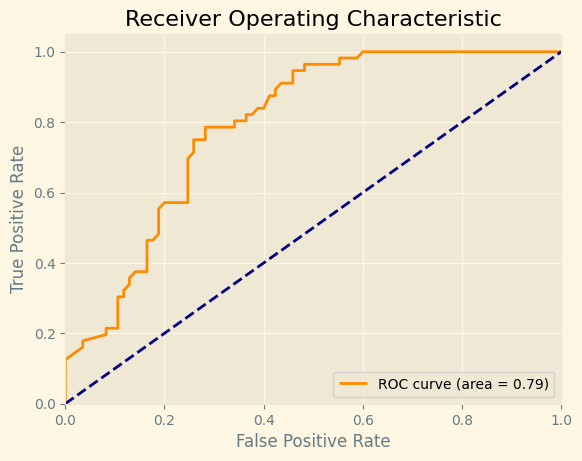

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=3)
80
IsolationForest(contamination=0.2973856209150327, n_estimators=5)
94
IsolationForest(contamination=0.005, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.03, n_estimators=5)
10
IsolationForest(contamination=0.05, n_estimators=5)
29
IsolationForest(contamination=0.1, n_estimators=5)
30
IsolationForest(contamination=0.2, n_estimators=5)
86
IsolationForest(contamination=0.3, n_estimators=5)
61


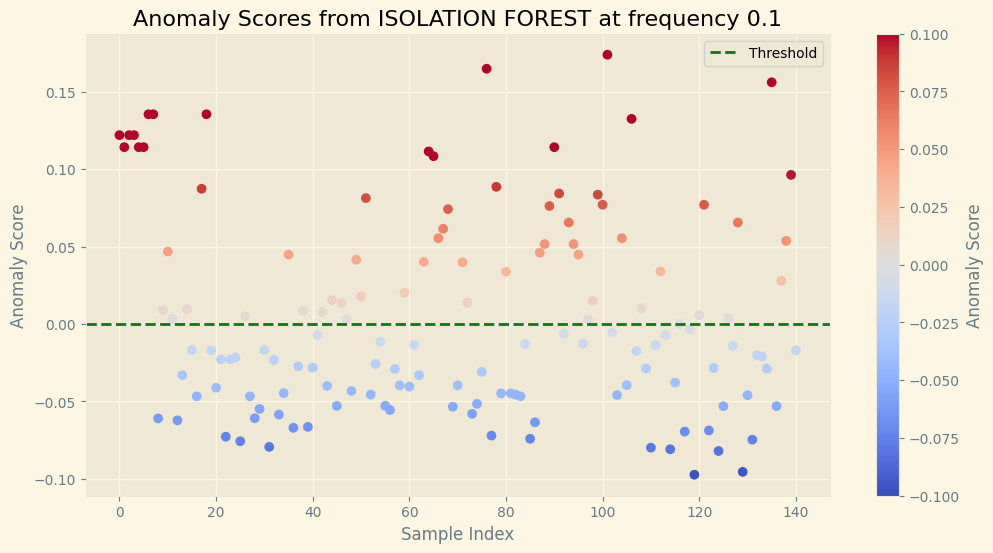

Number of anomalies detected: 61
Threshold: 0.0000
ROC AUC Score: 0.6381
F1 Score: 0.5128
Accuracy: 0.5957
Precision: 0.4918
Recall: 0.5357
              precision    recall  f1-score   support

           0       0.68      0.64      0.65        85
           1       0.49      0.54      0.51        56

    accuracy                           0.60       141
   macro avg       0.58      0.59      0.58       141
weighted avg       0.60      0.60      0.60       141



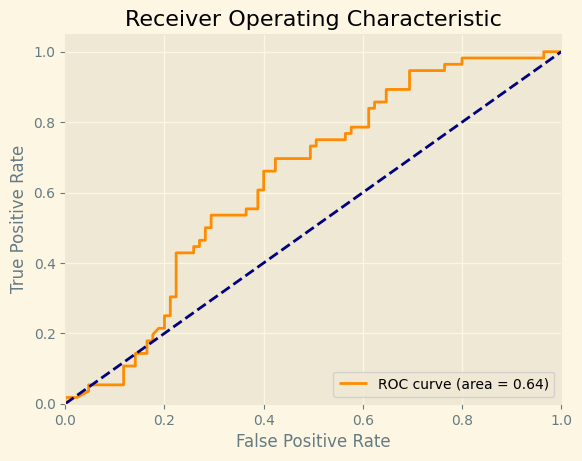

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=5)
97
IsolationForest(contamination=0.5, n_estimators=5)
104
IsolationForest(contamination=0.03, n_estimators=5)
15
IsolationForest(contamination=0.0475, n_estimators=5)
49


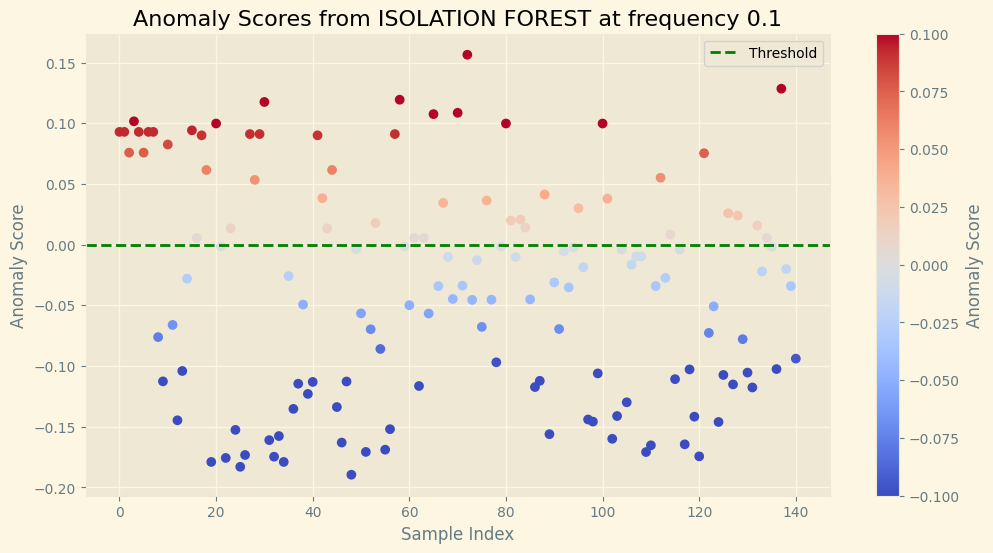

Number of anomalies detected: 49
Threshold: 0.0000
ROC AUC Score: 0.8405
F1 Score: 0.6476
Accuracy: 0.7376
Precision: 0.6939
Recall: 0.6071
              precision    recall  f1-score   support

           0       0.76      0.82      0.79        85
           1       0.69      0.61      0.65        56

    accuracy                           0.74       141
   macro avg       0.73      0.72      0.72       141
weighted avg       0.73      0.74      0.73       141



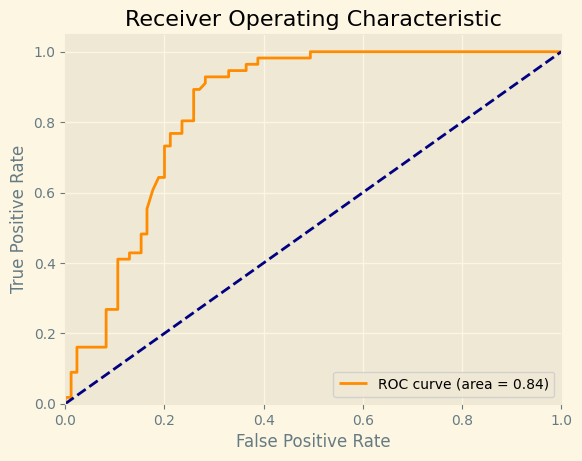

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=5)
65


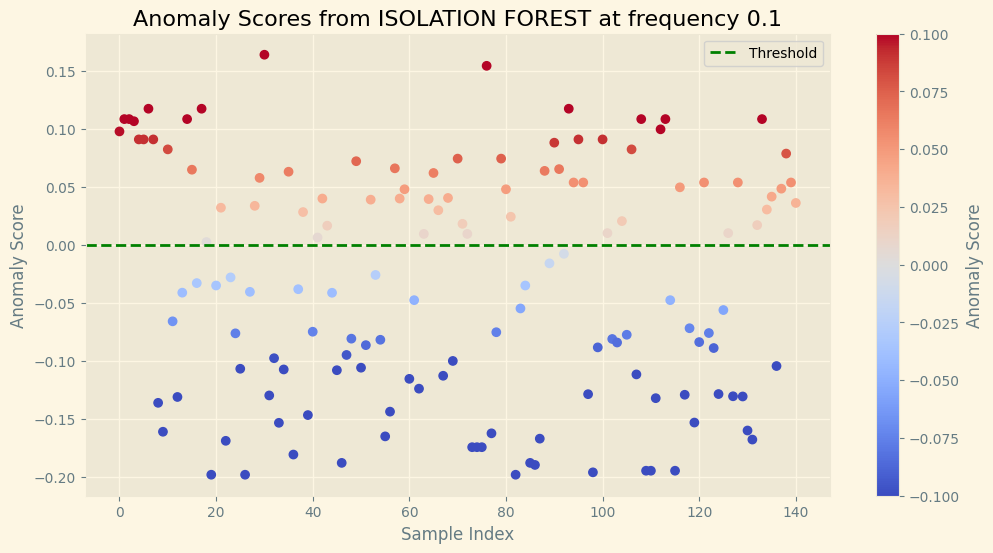

Number of anomalies detected: 65
Threshold: 0.0000
ROC AUC Score: 0.8259
F1 Score: 0.7273
Accuracy: 0.7660
Precision: 0.6769
Recall: 0.7857
              precision    recall  f1-score   support

           0       0.84      0.75      0.80        85
           1       0.68      0.79      0.73        56

    accuracy                           0.77       141
   macro avg       0.76      0.77      0.76       141
weighted avg       0.78      0.77      0.77       141



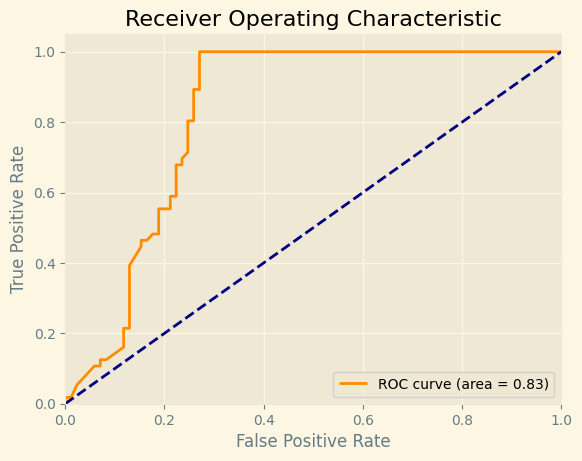

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=5)
64


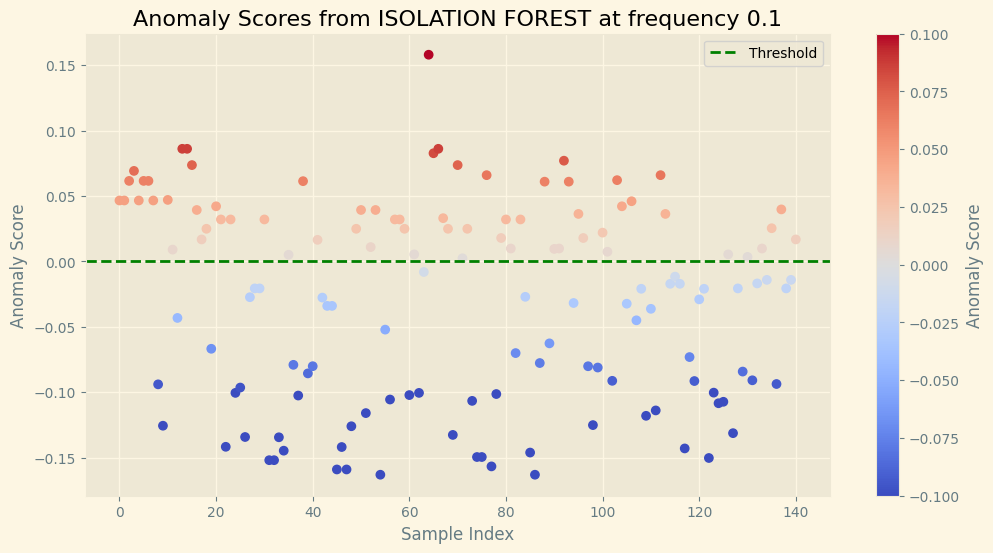

Number of anomalies detected: 64
Threshold: 0.0000
ROC AUC Score: 0.8310
F1 Score: 0.7167
Accuracy: 0.7589
Precision: 0.6719
Recall: 0.7679
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        85
           1       0.67      0.77      0.72        56

    accuracy                           0.76       141
   macro avg       0.75      0.76      0.75       141
weighted avg       0.77      0.76      0.76       141



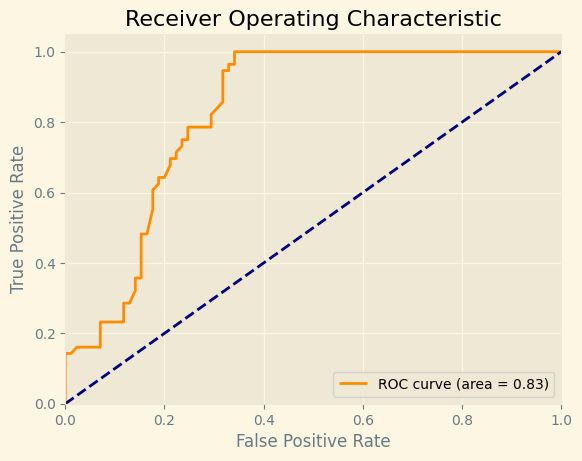

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=5)
55


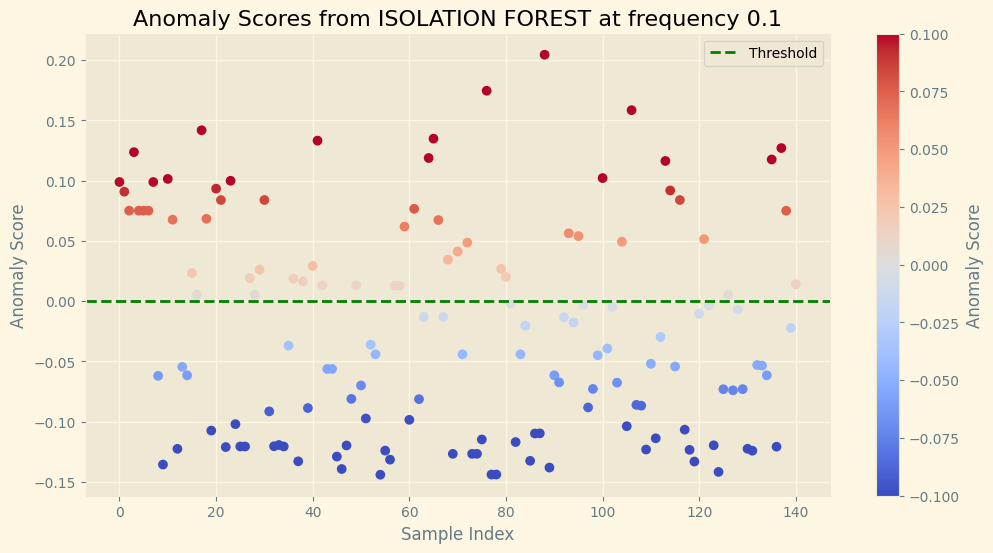

Number of anomalies detected: 55
Threshold: 0.0000
ROC AUC Score: 0.8151
F1 Score: 0.6667
Accuracy: 0.7376
Precision: 0.6727
Recall: 0.6607
              precision    recall  f1-score   support

           0       0.78      0.79      0.78        85
           1       0.67      0.66      0.67        56

    accuracy                           0.74       141
   macro avg       0.73      0.72      0.73       141
weighted avg       0.74      0.74      0.74       141



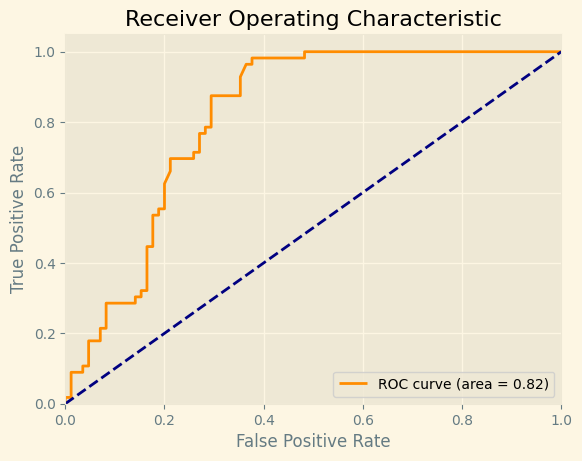

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327, n_estimators=10)
93
IsolationForest(contamination=0.005, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
7
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
49


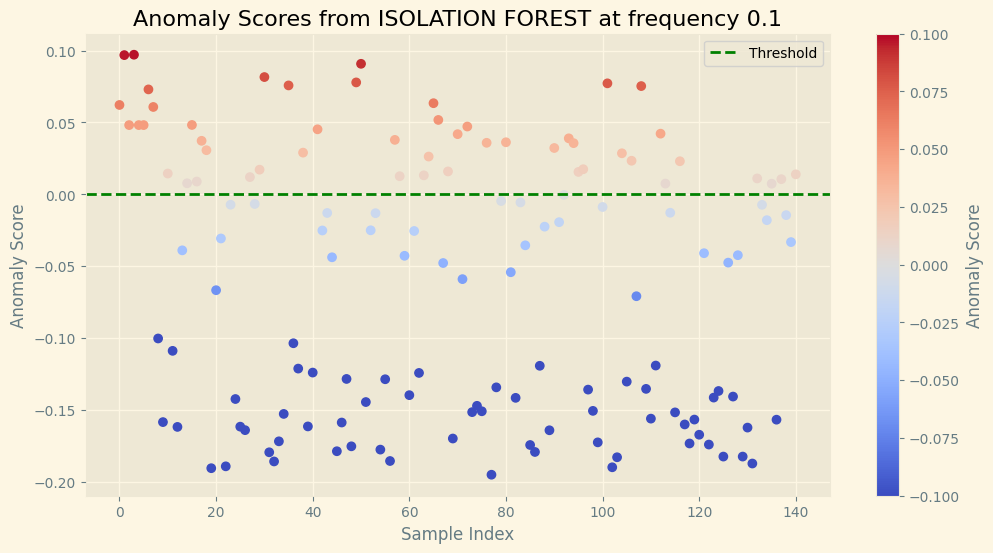

Number of anomalies detected: 49
Threshold: 0.0000
ROC AUC Score: 0.8592
F1 Score: 0.6667
Accuracy: 0.7518
Precision: 0.7143
Recall: 0.6250
              precision    recall  f1-score   support

           0       0.77      0.84      0.80        85
           1       0.71      0.62      0.67        56

    accuracy                           0.75       141
   macro avg       0.74      0.73      0.73       141
weighted avg       0.75      0.75      0.75       141



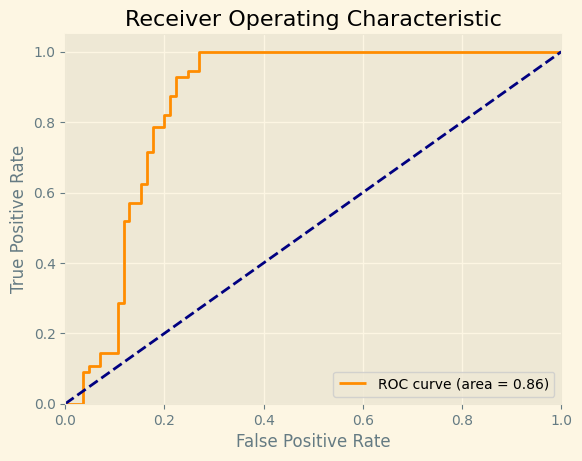

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.05, n_estimators=10)
67


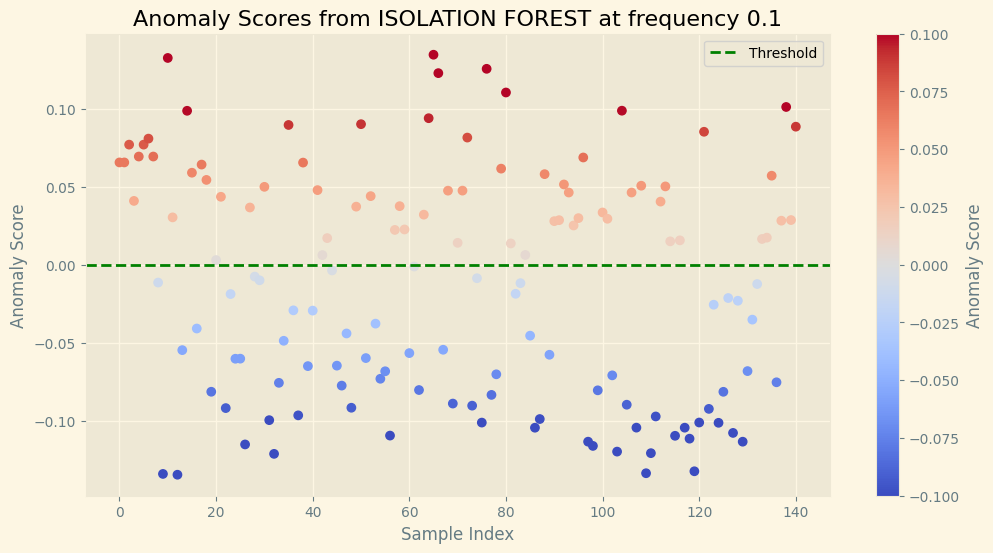

Number of anomalies detected: 67
Threshold: 0.0000
ROC AUC Score: 0.8366
F1 Score: 0.7642
Accuracy: 0.7943
Precision: 0.7015
Recall: 0.8393
              precision    recall  f1-score   support

           0       0.88      0.76      0.82        85
           1       0.70      0.84      0.76        56

    accuracy                           0.79       141
   macro avg       0.79      0.80      0.79       141
weighted avg       0.81      0.79      0.80       141



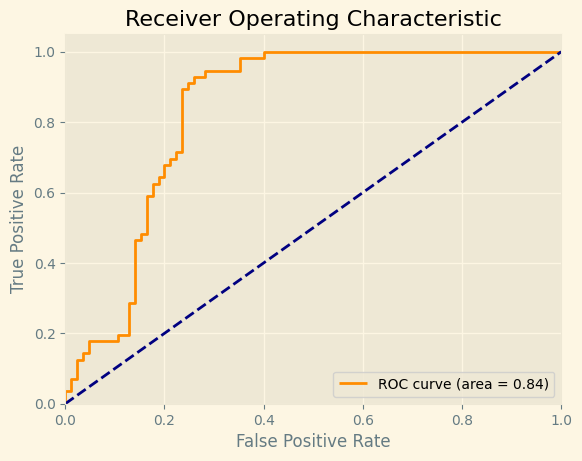

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
80
IsolationForest(contamination=0.2, n_estimators=10)
82
IsolationForest(contamination=0.3, n_estimators=10)
88
IsolationForest(contamination=0.4, n_estimators=10)
95
IsolationForest(contamination=0.5, n_estimators=10)
104
IsolationForest(contamination=0.03, n_estimators=10)
13
IsolationForest(contamination=0.0475, n_estimators=10)
61


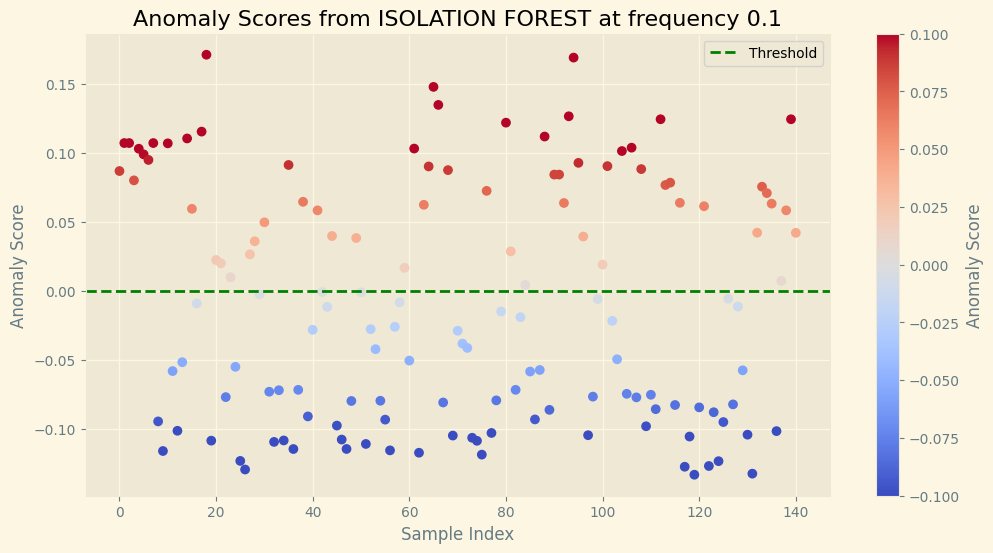

Number of anomalies detected: 61
Threshold: 0.0000
ROC AUC Score: 0.8583
F1 Score: 0.7350
Accuracy: 0.7801
Precision: 0.7049
Recall: 0.7679
              precision    recall  f1-score   support

           0       0.84      0.79      0.81        85
           1       0.70      0.77      0.74        56

    accuracy                           0.78       141
   macro avg       0.77      0.78      0.77       141
weighted avg       0.78      0.78      0.78       141



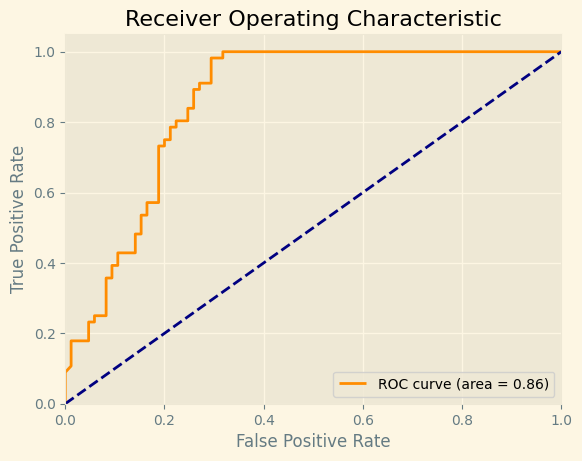

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=10)
50


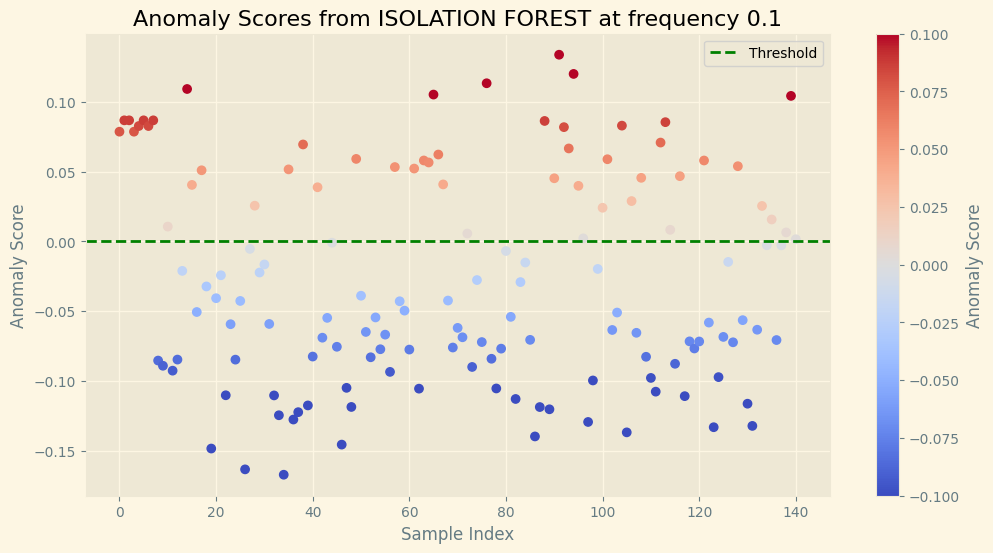

Number of anomalies detected: 50
Threshold: 0.0000
ROC AUC Score: 0.8212
F1 Score: 0.6415
Accuracy: 0.7305
Precision: 0.6800
Recall: 0.6071
              precision    recall  f1-score   support

           0       0.76      0.81      0.78        85
           1       0.68      0.61      0.64        56

    accuracy                           0.73       141
   macro avg       0.72      0.71      0.71       141
weighted avg       0.73      0.73      0.73       141



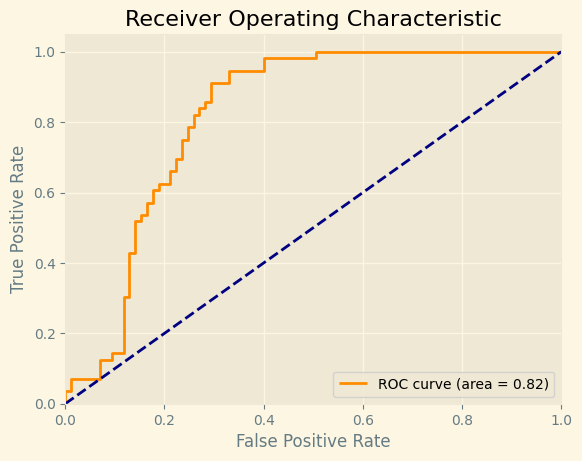

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
79


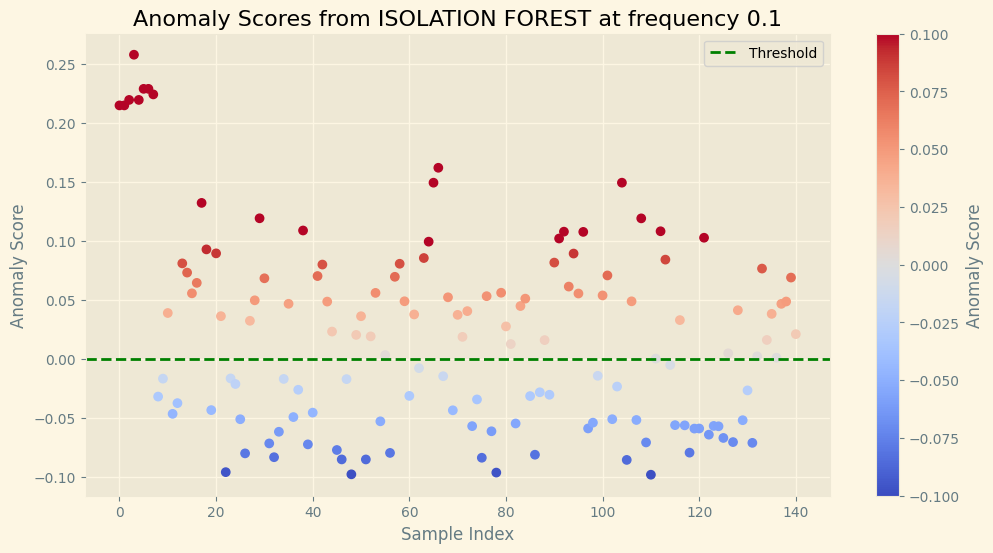

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8628
F1 Score: 0.8000
Accuracy: 0.8085
Precision: 0.6835
Recall: 0.9643
              precision    recall  f1-score   support

           0       0.97      0.71      0.82        85
           1       0.68      0.96      0.80        56

    accuracy                           0.81       141
   macro avg       0.83      0.84      0.81       141
weighted avg       0.85      0.81      0.81       141



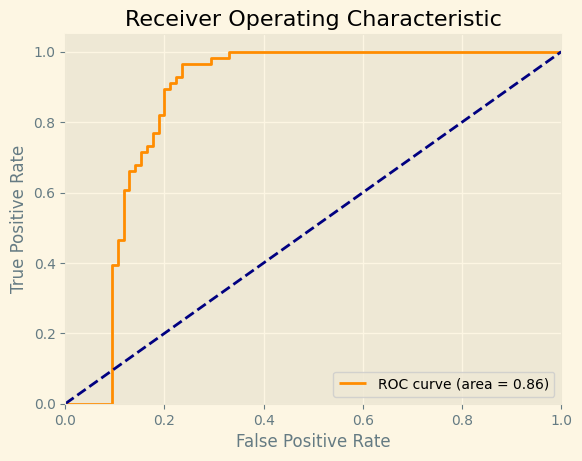

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
61


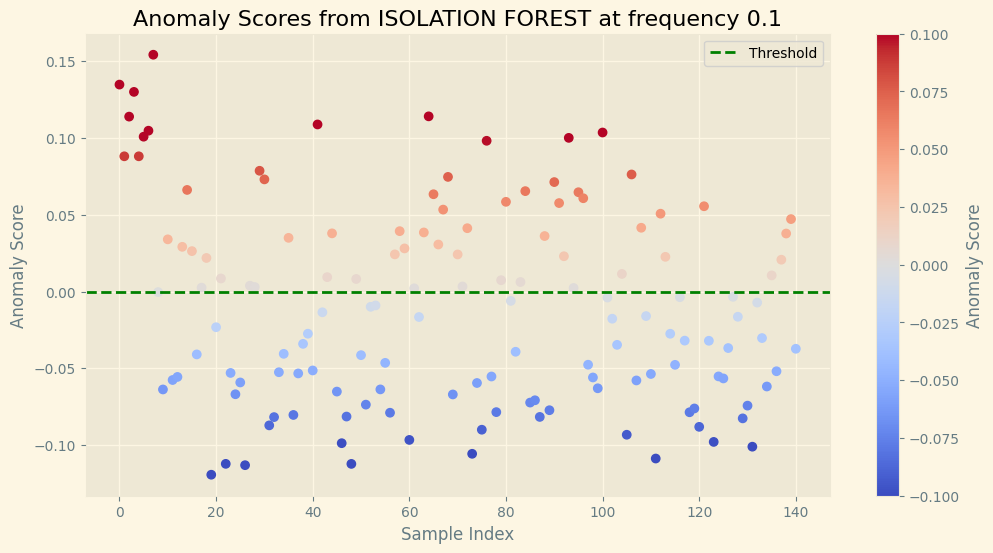

Number of anomalies detected: 61
Threshold: 0.0000
ROC AUC Score: 0.8424
F1 Score: 0.7863
Accuracy: 0.8227
Precision: 0.7541
Recall: 0.8214
              precision    recall  f1-score   support

           0       0.88      0.82      0.85        85
           1       0.75      0.82      0.79        56

    accuracy                           0.82       141
   macro avg       0.81      0.82      0.82       141
weighted avg       0.83      0.82      0.82       141



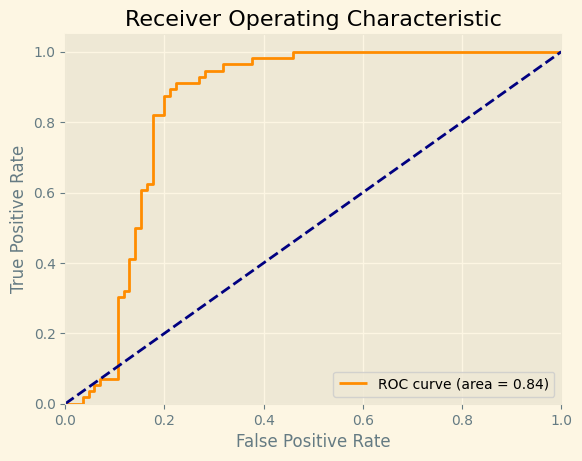

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2973856209150327)
89
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
11
IsolationForest(contamination=0.05)
78


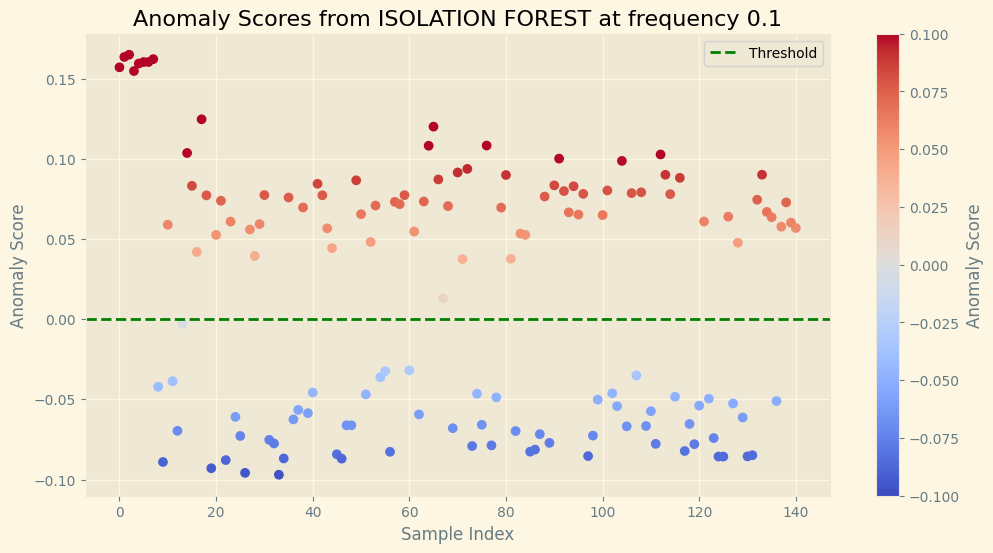

Number of anomalies detected: 78
Threshold: 0.0000
ROC AUC Score: 0.8422
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



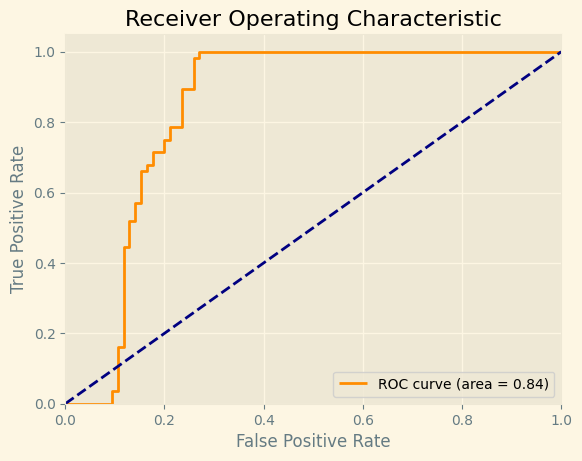

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
79


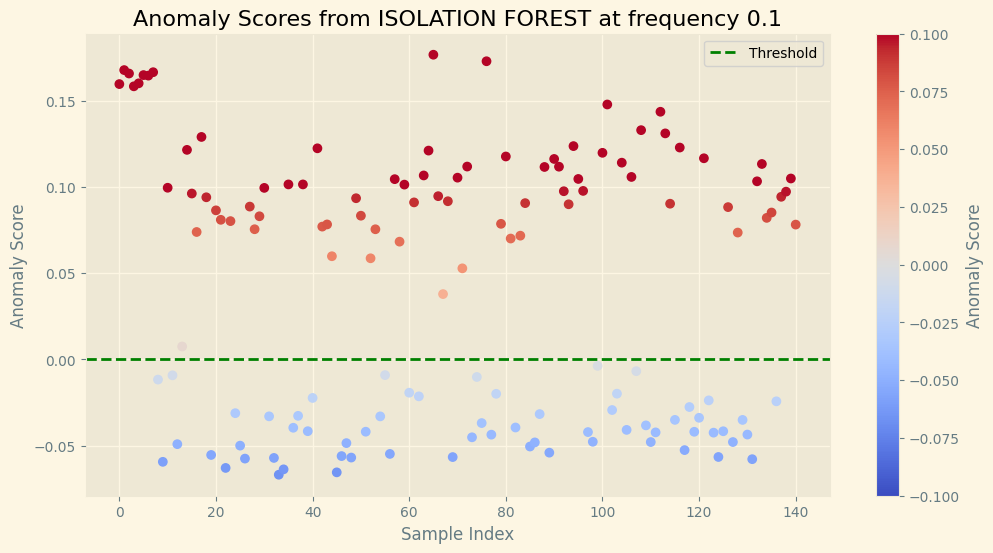

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8403
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



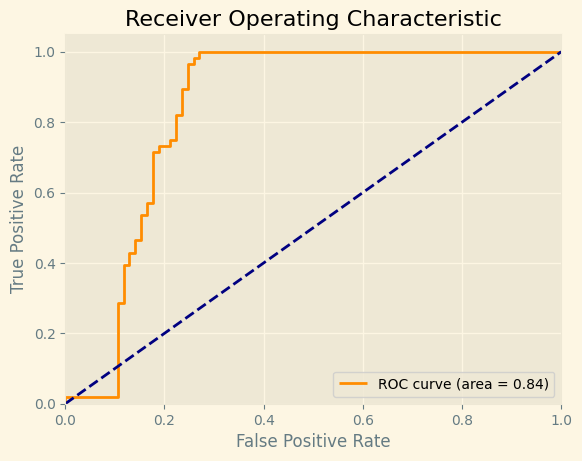

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
85
IsolationForest(contamination=0.3)
93
IsolationForest(contamination=0.4)
95
IsolationForest(contamination=0.5)
102
IsolationForest(contamination=0.03)
11
IsolationForest(contamination=0.0475)
79


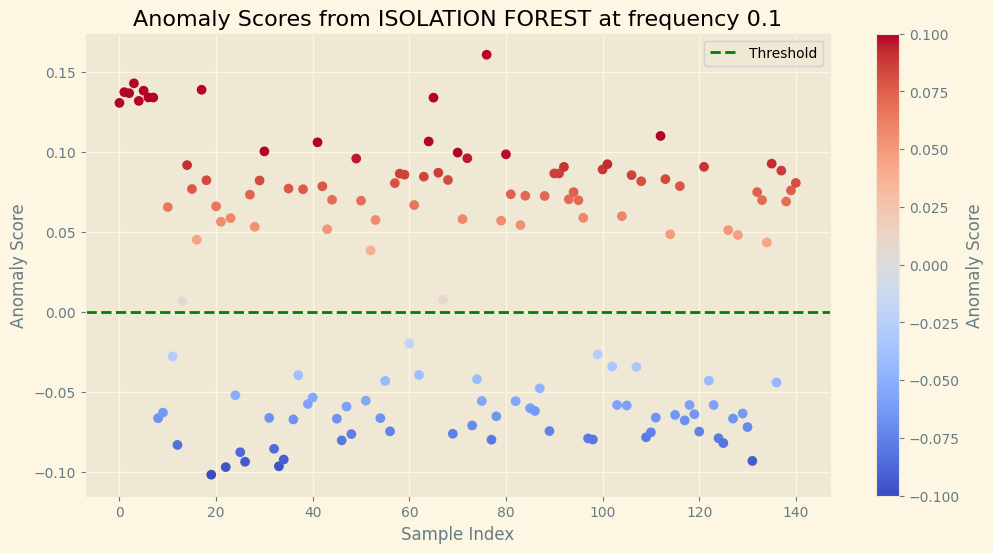

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8416
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



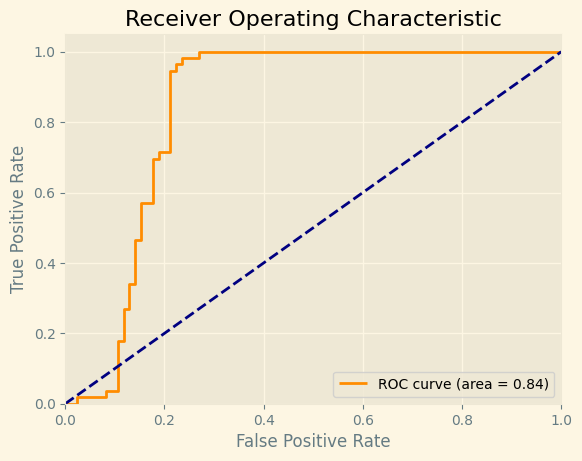

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
78


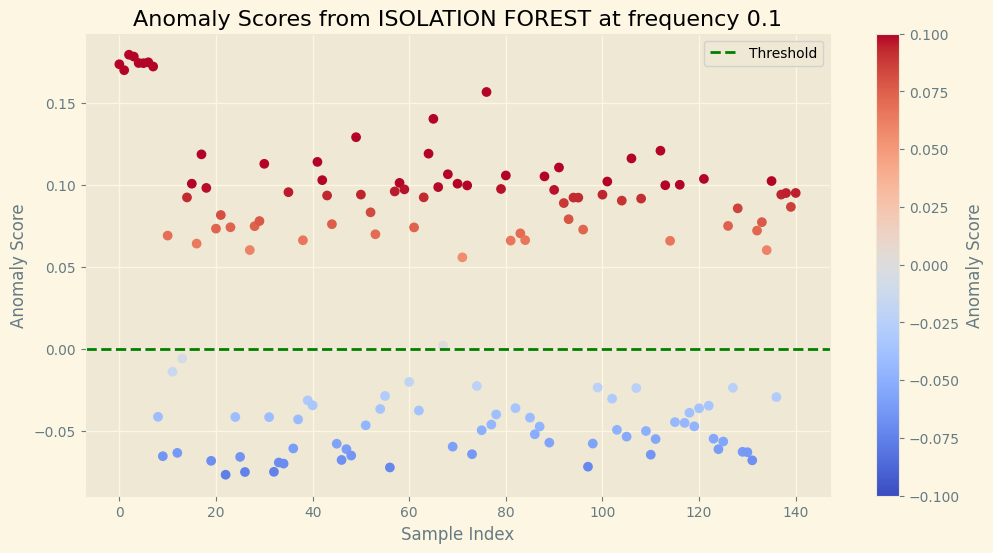

Number of anomalies detected: 78
Threshold: 0.0000
ROC AUC Score: 0.8317
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



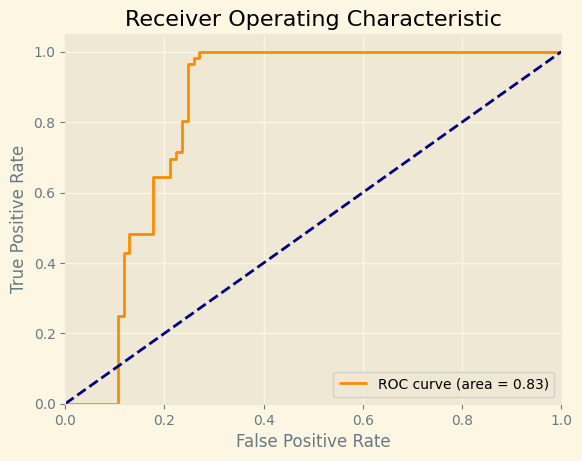

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
79


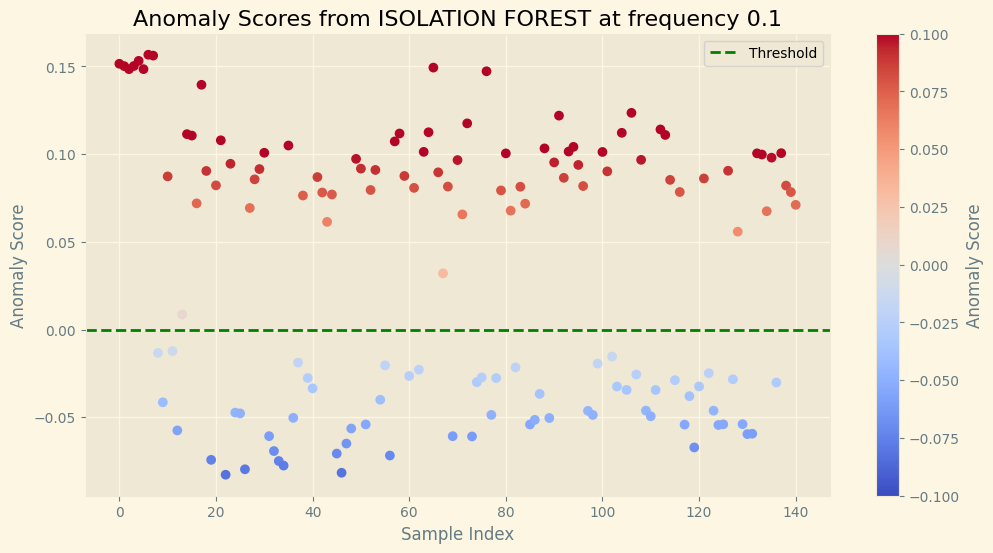

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8395
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



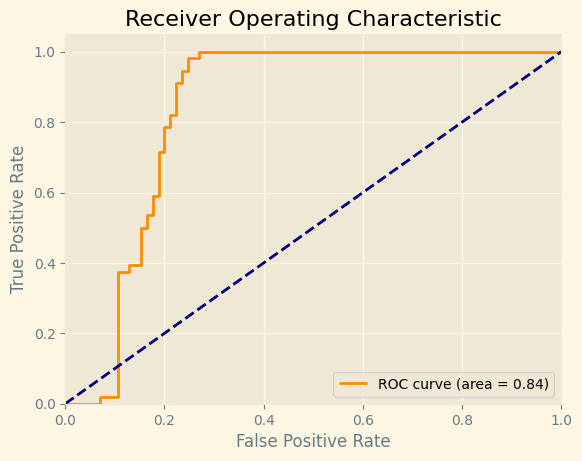

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
78


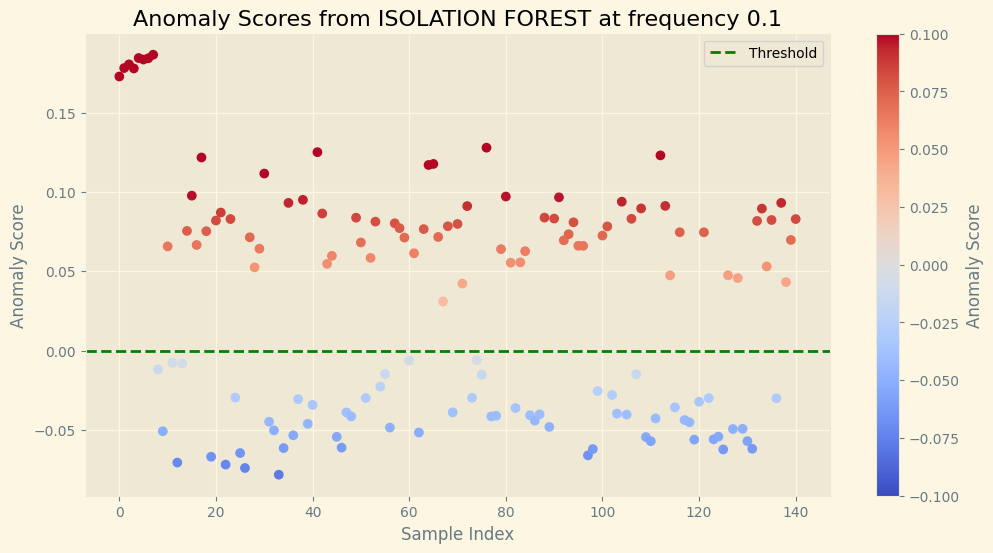

Number of anomalies detected: 78
Threshold: 0.0000
ROC AUC Score: 0.8397
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



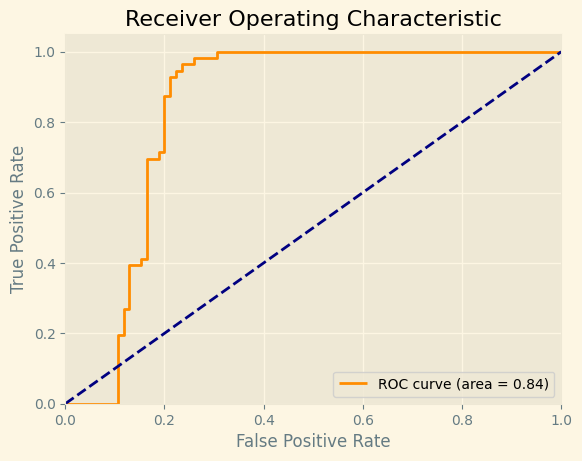

########################## ---------------------------------------- ##########################


In [23]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s_5):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = np.sum(anomaly_scores > 0)
    print(f"{anomalies_detected}")
    if (anomalies_detected > 40 and anomalies_detected < 80):
        _ = plot_anomalies(anomaly_scores, freq, threshold, "ISOLATION FOREST")
        compute_metrics(anomaly_scores, y_test_collision_5, threshold)
        plot_roc_curve(y_test_collision_5.values, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

## Map anomalies to original time series

In [24]:
# def plot_anomalies_over_time_isolation_forest(X_test, pred, freq, collision_zones, X_test_start_end):
#     # Step 1: Create a DataFrame with the original data and anomaly scores
#     df = X_test.copy()

#     # Step 2: Add a timestamp column since it doesn't exist
#     df['timestamp'] = pd.date_range(start=X_test_start_end['start'].to_list()[0], end=X_test_start_end['end'].to_list()[-1], periods=len(df))  #Qua assicurati di bindare bene i timestamp (se puoi, non generarli)

#     print(df['timestamp'])

#     # Step 3: Select a few features to plot along with the anomaly scores
#     features_to_plot = df.columns.drop(['timestamp'])

#     # Step 4: Create the plot
#     fig, ax1 = plt.subplots(figsize=(15, 6))
#     ax1.set_title(f'Time Series Data with Anomaly Scores at frequency {freq}', fontsize=16)
    
#     # Plot features on primary y-axis
#     ax1.set_xlabel('Time')
#     ax1.set_ylabel('Feature Values')
#     colors = plt.cm.Greys(np.linspace(0, 1, len(features_to_plot)))
#     lines = []  # To collect plot lines for legend
#     labels = []  # To collect plot labels for legend
    
#     # print(f"THRESH: {threshold}")
#     for feature, color in zip(features_to_plot, colors):
#         # if any(df[feature] > threshold):
#         line, = ax1.plot(df['timestamp'], df[feature], label=f'Feature: {feature}', linewidth=1, color=color, alpha=0.7)
#         lines.append(line)
#         labels.append(f'Feature: {feature}')
#         # else:
#             # print("\t\tQuesta feature non supera mai soglia")

#     #Highlighting collision zones on the graph
#     for s, e in zip(collision_zones['start'].tolist(), collision_zones['end'].tolist()):
#         ax1.axvspan(s, e, alpha=0.2, color='blue')

#     # ax1.plot(df['timestamp'], df['anomaly_score'], color='red', label='Anomaly Score', linestyle='--', linewidth=1)
#     ax1.plot(df['timestamp'], pred, 'go-', label='Anomaly Score', linestyle='--', linewidth=1)

#     fig.tight_layout()
#     plt.show()

In [25]:
# for pred in pred_s:
#     plot_anomalies_over_time_isolation_forest(X_test, pred, freq, collision_zones, X_test_start_end)